# EXPLORATORY DATA ANALYSIS REPORT:

#### Team ID: PTID-CDS-MAY-23-1515 
#### Project ID: PRCP-1020 - Home price prediction

# Importing libraries, modules and classes to work with data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.special as special

#### Importing train  data set

In [2]:
train_df = pd.read_csv('train.csv')
print(train_df.shape)
print("=======================================================================================================================")
train_df.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


#### Importing test data set

In [3]:
test_df = pd.read_csv('test.csv')
print(test_df.shape)
print("=======================================================================================================================")
test_df.head()

(1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


#### Concatenate both train_df, and test_df data sets to form a new data set

- The train data set contains training samples, it has 80 independent features and 1 target feature (SalePrice).
- The test data set contains testing samples, it has 80 independent features.
- We need to concatenate both dataframes to form a new data frame.

In [4]:
# To see all columns of data frame
pd.set_option('display.max_columns', None)

In [5]:
# The ignore_index=True parameter ensures that the resulting DataFrame has a new continuous index,
# ignoring the original indices of the train and test data.

concatenated_data = pd.concat([train_df, test_df], ignore_index=True)
print(concatenated_data.shape)
print("=======================================================================================================================")
concatenated_data.head()

(2919, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


#### From above data set we can see that some 1459 rows in Salesprice column contains null values, because those rows belong to test data set.

# Exploratory Data Analysis (EDA)

#### For data analysis purpose we only need train data set because it contains target feature

In [6]:
# Creating a copy of train_df data frame, so we can work without changing the original data
df = train_df.copy()
print(df.shape)
print("=======================================================================================================================")
df.head(3)

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


## Basic checks

In [7]:
df.tail(3)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [8]:
# Gets us no of non null values and data types of each column, and also tells us about total memory consumption
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
# perform stats analysis on numerical columns
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [10]:
# perform stats analysis on categorical columns
df.describe(include=['O'])

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


In [11]:
# To see all rows of data frame
pd.set_option('display.max_rows', None)

In [12]:
# code to check no of unique values in a column and list them
num_list = [] # Generate a list of numbers from 1 to n features, for ex here 1 to 40
num = 0

cols_desc = [] # an empty list
for i in df.columns: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, df[i].dtypes,df[i].isna().sum(), round((df[i].isna().sum() / len(df)) * 100,2),df[i].nunique(),
     df[i].unique()])

desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','Null','Null_%','no_of_uni_val','Uni_val_list'])

desc

,Data_Features,dtype,Null,Null_%,no_of_uni_val,Uni_val_list
1,Id,int64,0,0.00,1460,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
2,MSSubClass,int64,0,0.00,15,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,..."
3,MSZoning,object,0,0.00,5,"[RL, RM, C (all), FV, RH]"
4,LotFrontage,float64,259,17.74,110,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan..."
5,LotArea,int64,0,0.00,1073,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,..."
6,Street,object,0,0.00,2,"[Pave, Grvl]"
7,Alley,object,1369,93.77,2,"[nan, Grvl, Pave]"
8,LotShape,object,0,0.00,4,"[Reg, IR1, IR2, IR3]"
9,LandContour,object,0,0.00,4,"[Lvl, Bnk, Low, HLS]"
10,Utilities,object,0,0.00,2,"[AllPub, NoSeWa]"


#### We have 43 categorical columns

In [13]:
# We can also use this code:
# cat_cols = df.select_dtypes(include=['object', 'category']).columns
cat_cols = []

for i in df.columns:
    if df.loc[:,i].dtype == 'object' or df.loc[:,i].dtype == 'category':
        cat_cols.append(i)

print(len(cat_cols))
print("====================================================================================================")
print(cat_cols)

43
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


#### We have total 38  numerical columns

In [14]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns
num_cols = []

for i in df.columns:
    if (df.loc[:,i].dtype == 'int8' or df.loc[:,i].dtype == 'int16' or df.loc[:,i].dtype == 'int32'
    or df.loc[:,i].dtype == 'int64' or df.loc[:,i].dtype == 'float8' or df.loc[:,i].dtype == 'float16'
    or df.loc[:,i].dtype == 'float32' or df.loc[:,i].dtype == 'float64'):
        num_cols.append(i)

print(len(num_cols))
print("====================================================================================================")
print(num_cols)

38
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


#### Numerical columns can be further divided into Discrete and Continous columns.
- Discrete columns: How to decide which numerical column is discrete and continous? it depends upon you. If you decide to select the column as discrete if it has less than 50 unique class then you can do that.

### Discrete numerical columns

#### Out of 38 numerical columns 18 of them contain less than or equals to 11 unique values, it means you can convert these columns from data type int to object or most preferably category type.

#### I want to select only those columns as Discrete columns if they have less than or equals to 25 unique values (classes)

In [15]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns

dis_num_cols = []

for i in df.columns:
    if df[i].nunique() <= 25 and (df.loc[:,i].dtype == 'int8' or df.loc[:,i].dtype == 'int16' or df.loc[:,i].dtype == 'int32'
    or df.loc[:,i].dtype == 'int64' or df.loc[:,i].dtype == 'float8' or df.loc[:,i].dtype == 'float16'
    or df.loc[:,i].dtype == 'float32' or df.loc[:,i].dtype == 'float64'):
        dis_num_cols.append(i)

print(len(dis_num_cols))
print("====================================================================================================")
print(dis_num_cols)

18
['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


###  Continous numerical columns

In [16]:
# Gets suus only those numerical columsn whose unique values are greater than 2
cont_num_cols = []

for i in df.columns:
    if df[i].nunique() > 25 and (df.loc[:,i].dtype == 'int8' or df.loc[:,i].dtype == 'int16' or df.loc[:,i].dtype == 'int32'
    or df.loc[:,i].dtype == 'int64' or df.loc[:,i].dtype == 'float8' or df.loc[:,i].dtype == 'float16'
    or df.loc[:,i].dtype == 'float32' or df.loc[:,i].dtype == 'float64'):
        cont_num_cols.append(i)

print(len(cont_num_cols))
print("====================================================================================================")
print(cont_num_cols)

20
['Id', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


## Handling the missing values

#### There are 19 columns with null values > 0

In [17]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
null_cols = []

for column in df.columns:
    if df[column].isnull().sum() > 0:
        null_cols.append(column)

print(len(null_cols))
print("====================================================================================================")
print(null_cols)

19
['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


### NOTE:
- The problem with this approach is some columns contain NA as meaningful value, but intepreter counts them NA as (null, meaningless values)
- For ex Alley column contains 3 different values(classes),<br><br>
Alley: Type of alley access to property<br><br>
       1. Grvl	Gravel<br><br>
       2. Pave	Paved<br><br>
       3. NA 	No alley access<br><br>
- one of them being NA value which means No alley access,which has meaning. It means there is no access to alley in the house
- It doesn't mean the data isn't entered.

#### look for those columns and replace NA value with something that isnull() function doesn't take into count.

## Impute NA value with constant value

In [18]:
# Impute using a constant value
# Replacing NA with different value for each column
na_repl = ['NO','NB','NB','NB','NB','NB','NF','NG','NG','NG','NG','NP','NF','NO']
i = 0
for column in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']:
    df[column] = df[column].fillna(na_repl[i])
    i+=1

In [19]:
# code to check NA value in column is replaced with constant value or not
num_list = [] 
num = 0
cols_desc = [] # an empty list
for i in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, df[i].dtypes,df[i].nunique(),
     df[i].unique()])
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','no_of_uni_val','Uni_val_list'])
desc

,Data_Features,dtype,no_of_uni_val,Uni_val_list
1,Alley,object,3,"[NO, Grvl, Pave]"
2,BsmtQual,object,5,"[Gd, TA, Ex, NB, Fa]"
3,BsmtCond,object,5,"[TA, Gd, NB, Fa, Po]"
4,BsmtExposure,object,5,"[No, Gd, Mn, Av, NB]"
5,BsmtFinType1,object,7,"[GLQ, ALQ, Unf, Rec, BLQ, NB, LwQ]"
6,BsmtFinType2,object,7,"[Unf, BLQ, NB, ALQ, Rec, LwQ, GLQ]"
7,FireplaceQu,object,6,"[NF, TA, Gd, Fa, Ex, Po]"
8,GarageType,object,7,"[Attchd, Detchd, BuiltIn, CarPort, NG, Basment..."
9,GarageFinish,object,4,"[RFn, Unf, Fin, NG]"
10,GarageQual,object,6,"[TA, Fa, Gd, NG, Ex, Po]"


### There are still 5 columns with null values

In [20]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
null_cols = []

for column in df.columns:
    if df[column].isnull().sum() > 0:
        null_cols.append(column)
print(len(null_cols))
print("====================================================================================================")
print(null_cols)

5
['LotFrontage', 'MasVnrType', 'MasVnrArea', 'Electrical', 'GarageYrBlt']


### Domain Analysis:

### Information about each columns of data:

1. SalePrice: The property's sale price in dollars. This is the target variable that you're trying to predict in the given dataset.

2. MSSubClass: The building class. It represents the type of dwelling involved in the sale (e.g., one-story, two-story, etc.) as numeric codes.

3. MSZoning: The general zoning classification of the property, which indicates the permitted land use and density in a particular area (e.g., residential, commercial, agricultural, etc.).

4. LotFrontage: The linear feet of street connected to the property, indicating the width of the lot's frontage.

5. LotArea: The lot size in square feet, representing the total area of the property.

6. Street: Type of road access to the property (e.g., paved or gravel).

7. Alley: Type of alley access to the property (e.g., paved, gravel, or no alley access).

8. LotShape: The general shape of the property (e.g., regular, irregular, etc.).

9. LandContour: The flatness of the property (e.g., level, banked, etc.).

10. Utilities: Type of utilities available to the property (e.g., electricity, gas, water, etc.).

11. LotConfig: The configuration of the lot (e.g., inside lot, corner lot, cul-de-sac, etc.).

12. LandSlope: The slope of the property (e.g., gentle slope, moderate slope, etc.).

13. Neighborhood: Physical locations within Ames city limits, representing the various neighborhoods or areas where the properties are located.

14. Condition1: Proximity to the main road or railroad (e.g., adjacent to a feeder street or within 200 feet of a railroad).

15. Condition2: Proximity to the main road or railroad if a second one is present.

16. BldgType: The type of dwelling (e.g., detached house, townhouse, etc.).

17. HouseStyle: The style of the dwelling (e.g., one story, two-story, etc.).

18. OverallQual: Overall material and finish quality of the house, rated on a scale from 1 to 10.

19. OverallCond: Overall condition rating of the house, rated on a scale from 1 to 10.

20. YearBuilt: The original construction date of the house.

21. YearRemodAdd: The remodel date of the house, which may be different from the construction date if the house underwent remodeling.

22. RoofStyle: The type of roof on the house (e.g., gable, hip, etc.).

23. RoofMatl: The material used for the roof.

24. Exterior1st: The exterior covering on the house (e.g., vinyl siding, brick, etc.).

25. Exterior2nd: If there is more than one exterior covering on the house, this represents the second material.

26. MasVnrType: The type of masonry veneer on the house (e.g., brick, stone, etc.).

27. MasVnrArea: The masonry veneer area in square feet.

28. ExterQual: The quality of the exterior material.

29. ExterCond: The present condition of the material on the exterior.

30. Foundation: The type of foundation of the house (e.g., concrete, wood, etc.).

31. BsmtQual: The height of the basement (e.g., high ceilings, average height, etc.).

32. BsmtCond: The general condition of the basement.

33. BsmtExposure: Refers to whether the basement has walkout or garden level walls.

34. BsmtFinType1: The quality of the basement finished area.

35. BsmtFinSF1: The type 1 finished square feet of the basement.

36. BsmtFinType2: The quality of the second finished area in the basement (if present).

37. BsmtFinSF2: The type 2 finished square feet of the basement.

38. BsmtUnfSF: The unfinished square feet of the basement area.

39. TotalBsmtSF: The total square feet of the basement area.

40. Heating: The type of heating system in the house.

41. HeatingQC: The heating quality and condition.

42. CentralAir: Indicates whether the house has central air conditioning or not.

43. Electrical: The electrical system of the house.

44. 1stFlrSF: The square footage of the first floor.

45. 2ndFlrSF: The square footage of the second floor.

46. LowQualFinSF: The low-quality finished square feet (all floors) in the house.

47. GrLivArea: The above-grade (ground) living area square feet.

48. BsmtFullBath: The number of basement full bathrooms.

49. BsmtHalfBath: The number of basement half bathrooms.

50. FullBath: The number of full bathrooms above grade.

51. HalfBath: The number of half bathrooms above grade.

52. Bedroom: The number of bedrooms above the basement level.

53. Kitchen: The number of kitchens in the house.

54. KitchenQual: The quality of the kitchen.

55. TotRmsAbvGrd: The total number of rooms (excluding bathrooms) above grade.

56. Functional: A home functionality rating that assesses the overall functionality of the house.

57. Fireplaces: The number of fireplaces in the house.

58. FireplaceQu: The quality of the fireplace.

59. GarageType: The location of the garage.

60. GarageYrBlt: The year the garage was built.

61. GarageFinish: The interior finish of the garage.

62. GarageCars: The size of the garage in terms of car capacity.

63. GarageArea: The size of the garage in square feet.

64. GarageQual: The quality of the garage.

65. GarageCond: The condition of the garage.

66. PavedDrive: Indicates whether the driveway is paved or not.

67. WoodDeckSF: The wood deck area in square feet.

68. OpenPorchSF: The open porch area in square feet.

69. EnclosedPorch: The enclosed porch area in square feet.

70. 3SsnPorch: The three-season porch area in square feet.

71. ScreenPorch: The screen porch area in square feet.

72. PoolArea: The pool area in square feet.

73. PoolQC: The quality of the pool.

74. Fence: The quality of the fence.

75. MiscFeature: Miscellaneous feature not covered in other categories.

76. MiscVal: The dollar value of miscellaneous features.

77. MoSold: The month of the sale.

78. YrSold: The year of the sale.

79. SaleType: The type of sale (e.g., warranty deed, quit claim deed, etc.).

80. SaleCondition: The condition of the sale (e.g., normal, abnormal, etc.).

- These features provide detailed information about various aspects of the properties, allowing for analysis and prediction of the sale prices.

# EDA:

### 1. MSZoning: 
- The general zoning classification of the property:
- RL: Residential Low Density >> RM: Residential Medium Density >> C (all): Commercial >> FV: Floating Village Residential>>   RH: Residential High Density

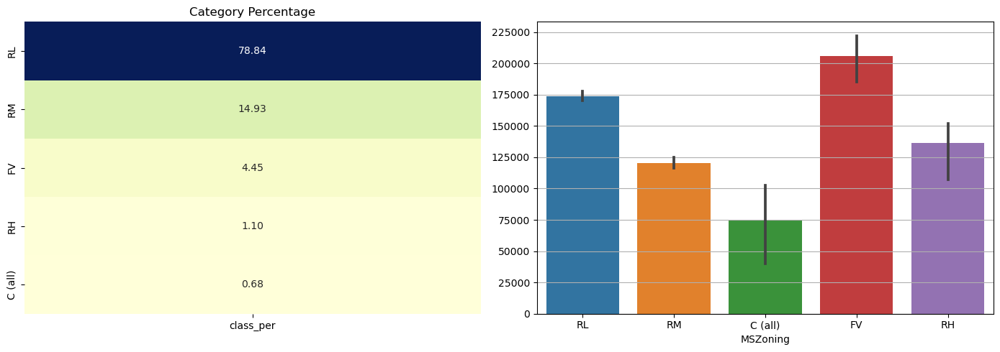

Null values in column are: 0


In [21]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
class_count = df['MSZoning'].value_counts(dropna= False)
class_per = round(df['MSZoning'].value_counts() / df['MSZoning'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MSZoning',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')
plt.ylabel("")

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MSZoning'].isnull().sum()}")

#### MSZoning Conclusions:
- 78.84% of houses are built on RL(Residential Low Density) zone and other 15% on RM (Residential Medium Density) zone.
- Houses built on FV (Floating Village Residential) zone have high median sale price

### 2. Street
- Type of road access to the property:- Pave: Paved road- Grvl: Gravel road

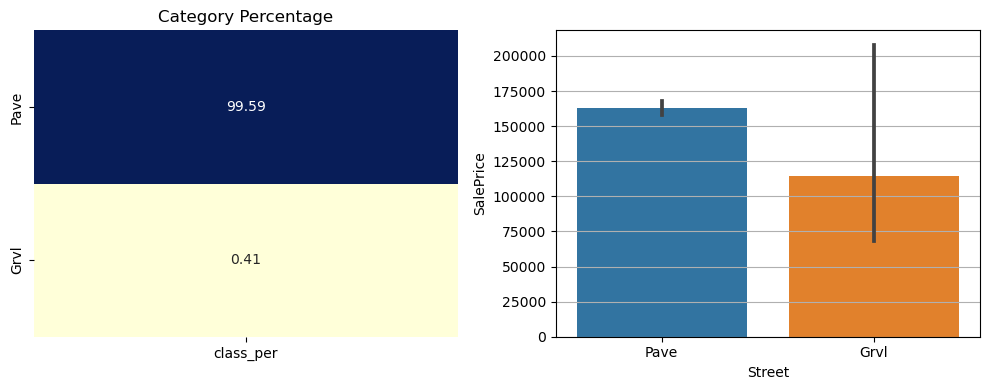

Null values in column are: 0


In [22]:
plt.figure(figsize=(10,4))

plt.subplot(1, 2, 1)
class_count = df['Street'].value_counts(dropna= False)
class_per = round(df['Street'].value_counts() / df['Street'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Street',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Street'].isnull().sum()}")

#### Street Conclusions:
- 99.59% of houses have paved Type of road access to the property and those houses have high median sale price

### 3. Alley
- Type of alley access to the property:
- NO: No alley access >>> Grvl: Gravel alley access >>> Pave: Paved alley access

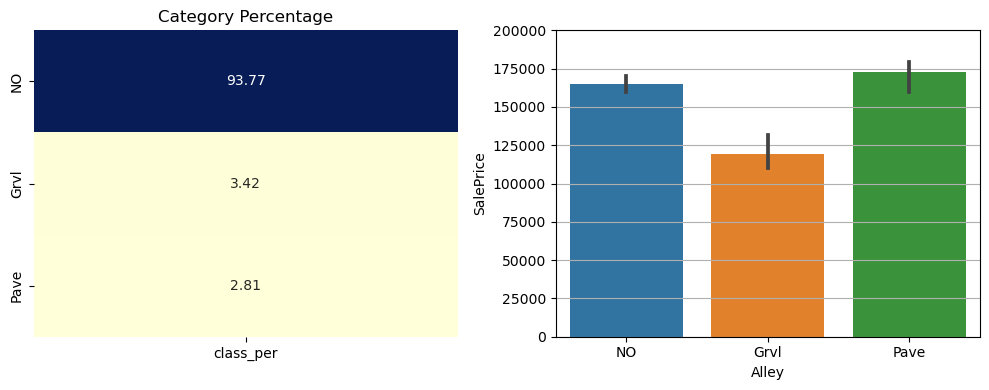

Null values in column are: 0


In [23]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Alley'].value_counts()
class_per = round(df['Alley'].value_counts() / df['Alley'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Alley',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Alley'].isnull().sum()}")

#### Alley Conclusions:
- 93.77% of houses have No alley access to the property
- Houses having Paved alley access have high median sale price

### 4. Utilities
- Type of utilities available for the property::
- AllPub: All public utilities available (water, electricity, gas, and sewer)
- NoSeWa: No public sewer available (water and electricity are available)

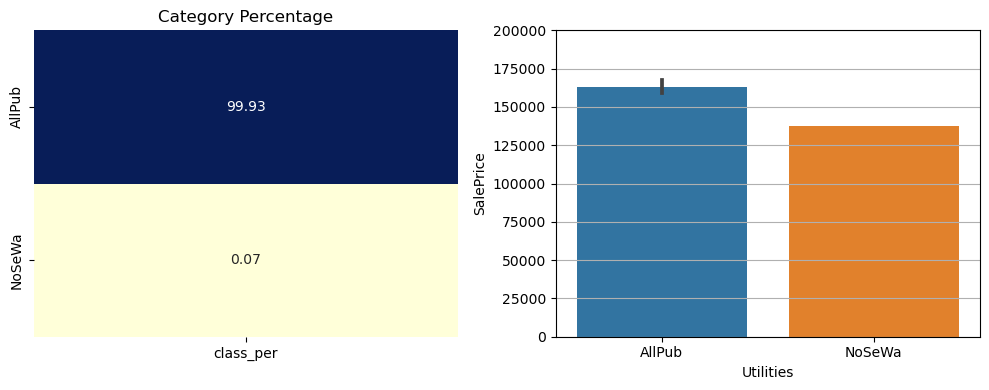

Null values in column are: 0


In [24]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Utilities'].value_counts()
class_per = round(df['Utilities'].value_counts() / df['Utilities'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')


plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Utilities',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,220000,25000) ,labels=np.arange(0,220000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Utilities'].isnull().sum()}")

#### Utilities Conclusions:
- 99.93% of houses are having AllPub: All public utilities available (water, electricity, gas, and sewer)
- Houses with All public utilities available (water, electricity, gas, and sewer) have high median sale price

### 5 LotShape
- General shape of the property:
- Reg: Regular shape>>> IR1: Slightly irregular shape>>> IR2: Moderately irregular shape>>> IR3: Irregular shape

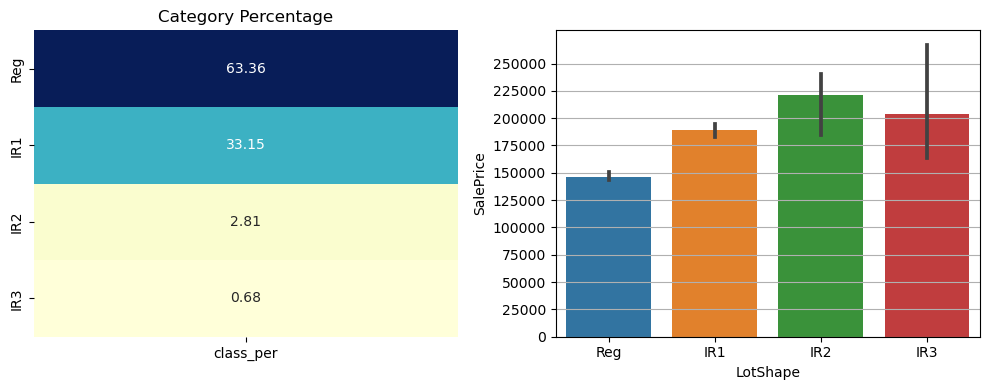

Null values in column are: 0


In [25]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['LotShape'].value_counts()
class_per = round(df['LotShape'].value_counts() / df['LotShape'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='LotShape',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,260000,25000) ,labels=np.arange(0,260000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['LotShape'].isnull().sum()}")

#### LotShape Conclusions:
- 63.36% of houses have regular shape
- Houses that were built with IR2: Moderately irregular shape have high median sale price

### 6. LandContour
- Flatness of the property.
- Lvl: Level>>> Bnk: Banked - Quick and significant rise from street grade to property>>> Low: Depression - Tends to be in a hollow or concave area>>> HLS: Hillside - Significant slope from the front to the back

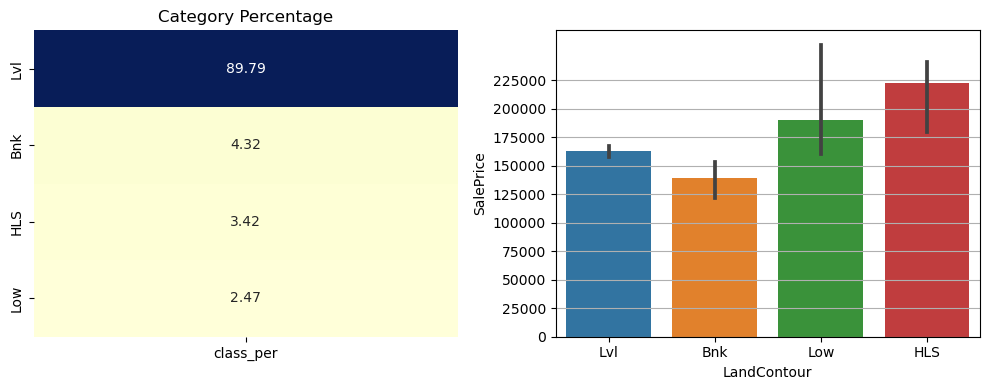

Null values in column are: 0


In [26]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['LandContour'].value_counts()
class_per = round(df['LandContour'].value_counts() / df['LandContour'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='LandContour',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['LandContour'].isnull().sum()}")

#### LandContour Conclusions:
- 89.97% of houses are built on levelled LandContour
- Houses with HLS: Hillside - Significant slope from the front to the back have high median sale price

### 7 LotConfig
-  Lot configuration>>
- Inside: Inside lot- FR2: Frontage on two sides of the property- Corner: Corner lot- CulDSac: Cul-de-sac lot- FR3: Frontage on three sides of the property

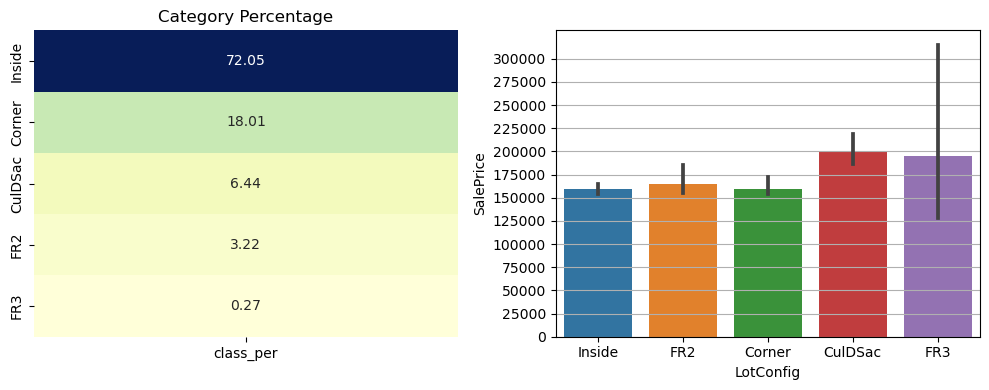

Null values in column are: 0


In [27]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['LotConfig'].value_counts()
class_per = round(df['LotConfig'].value_counts() / df['LotConfig'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='LotConfig',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['LotConfig'].isnull().sum()}")

#### LotConfig Conclusions:
- 72.05% of houses are built on inside lot and 18% on corner
- The houses with CulDSac: Cul-de-sac lot configuration have high median sale price

### 8. LandSlope
- Slope of the property:
- Gtl: Gentle slope>>> Mod: Moderate slope>>> Sev: Severe slope

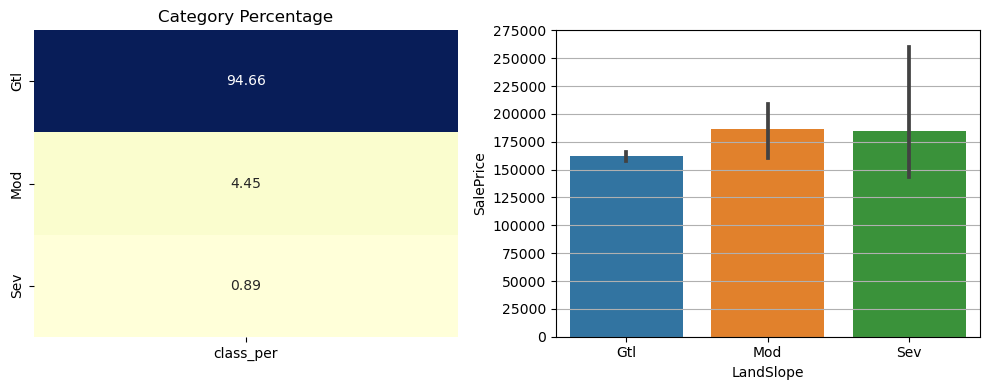

Null values in column are: 0


In [28]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['LandSlope'].value_counts()
class_per = round(df['LandSlope'].value_counts() / df['LandSlope'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='LandSlope',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,300000,25000) ,labels=np.arange(0,300000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['LandSlope'].isnull().sum()}")

#### LandSlope Conclusions:
- 94.66% of houses are built on gentle slope type of land slope
- House built on Mod: Moderate slope have high median sale price

### 9. Neighborhood
- Physical locations within Ames city limits.

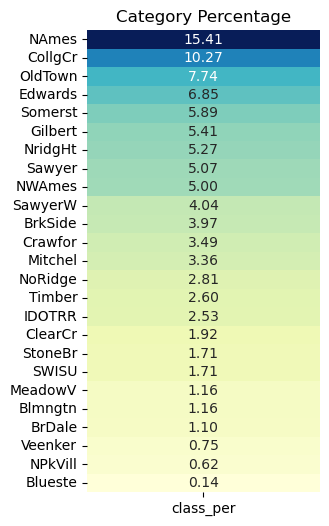

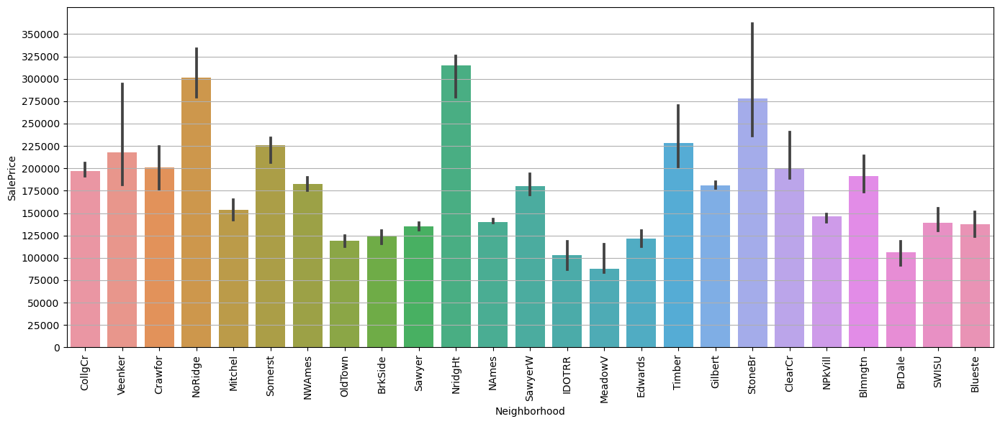

Null values in column are: 0


In [29]:
plt.figure(figsize=(3,6))

class_count = df['Neighborhood'].value_counts()
class_per = round(df['Neighborhood'].value_counts() / df['Neighborhood'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.figure(figsize=(14,6))
sns.barplot(data=df,x='Neighborhood',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,375000,25000) ,labels=np.arange(0,375000,25000))
plt.grid(axis='y')
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Neighborhood'].isnull().sum()}")

#### Neighborhood Conclusions:
- 15.54% of houses are near to NAmes neighborhood
- Houses in NridgHT neighborhood have high median sale price

### 10. Condition1
- Proximity to main road or railroad (1ST condition).
- Norm: Normal proximity>> Feedr: Adjacent to feeder street>> PosN: Near positive off-site feature (park, greenbelt, etc.)>> Artery: Adjacent to arterial street>> RRAe: Adjacent to railroad>> RRNn: Within 200 feet of a railroad>> RRAn: Adjacent to railroad and a normal road>> PosA: Near positive off-site feature (park, greenbelt, etc.)>> RRNe: Within 200 feet of a railroad and an east-west road

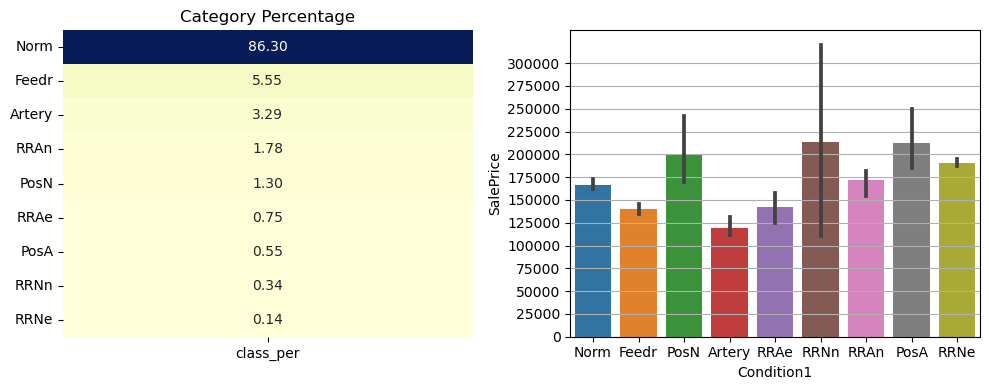

Null values in column are: 0


In [30]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Condition1'].value_counts()
class_per = round(df['Condition1'].value_counts() / df['Condition1'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')


plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Condition1',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Condition1'].isnull().sum()}")

#### Condition1 Conclusions:
- 86.30% of houses are built normally Proximity to the main road or railroad 
- Houses built within  RRNn: Within 200 feet of a railroad have high median sale price

### 11. Condition2
 Proximity to main road or railroad (2nd condition).
   - Norm: Normal proximity- Feedr: Adjacent to feeder street- PosN: Near positive off
   -site feature (park, greenbelt, etc.)- Artery: Adjacent to arterial street
   - RRAe: Adjacent to railroad- RRNn: Within 200 feet of a railroad- RRAn: Adjacent to railroad and a normal road
   - PosA: Near positive off-site feature (park, greenbelt, etc.)- RRNe: Within 200 feet of a railroad and an east-west road

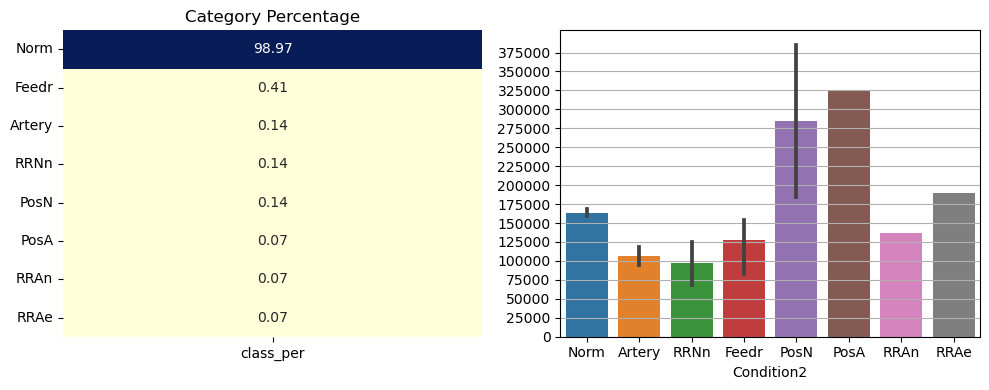

Null values in column are: 0


In [31]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Condition2'].value_counts()
class_per = round(df['Condition2'].value_counts() / df['Condition2'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Condition2',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,400000,25000) ,labels=np.arange(0,400000,25000))
plt.ylabel("")
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Condition2'].isnull().sum()}")

#### Condition2 Conclusions:
- 98.97% of houses are built Proximity to the main road or railroad.
- Houses bulilt within PosA: Near positive off-site feature (park, greenbelt, etc.) have high median sale price

### 12. BldgType
Type of dwelling.
   - 1Fam: Single-family detached- 2fmCon: Two-family conversion; originally built as one-family dwelling
   - Duplex: Duplex- TwnhsE: Townhouse End Unit- Twnhs: Townhouse Inside Unit

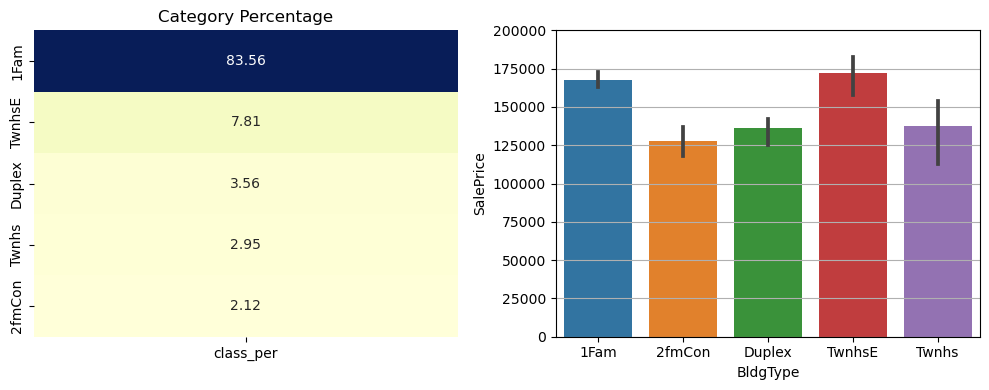

Null values in column are: 0


In [32]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BldgType'].value_counts()
class_per = round(df['BldgType'].value_counts() / df['BldgType'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BldgType',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BldgType'].isnull().sum()}")

#### BldgType Conclusions:
- 83.56% of houses are built Single-family detached (1 family)
- Houses with build type TwnhsE: Townhouse End Unit have high median sale price

### 13. HouseStyle
 Style of dwelling.
   - 2Story: Two-story- 1Story: One-story- 1.5Fin: One and a half story: 2nd level finished
   - 1.5Unf: One and a half story: 2nd level unfinished- SFoyer: Split Foyer- SLvl: Split Level
   - 2.5Unf: Two and a half story: 2nd level unfinished- 2.5Fin: Two and a half story: 2nd level finished

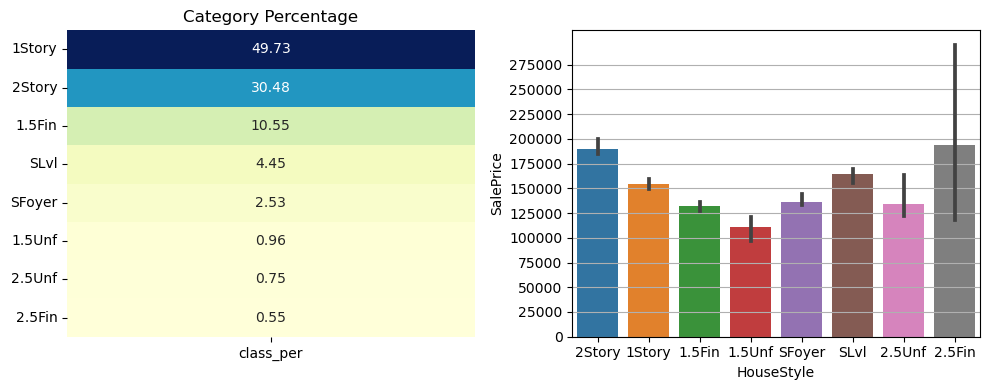

Null values in column are: 0


In [33]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['HouseStyle'].value_counts()
class_per = round(df['HouseStyle'].value_counts() / df['HouseStyle'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='HouseStyle',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,300000,25000) ,labels=np.arange(0,300000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['HouseStyle'].isnull().sum()}")

#### HouseStyle Conclusions:
- 49.73% of houses are 1 story and 30.48% of houses are 2 storied houses
- No null values

### 14. RoofStyle
Type of roof on the property.
   - Gable: Gable roof- Hip: Hip roof- Gambrel: Gambrel (barn-style) roof- Mansard: Mansard roof- Flat: Flat roof- Shed: Shed roof

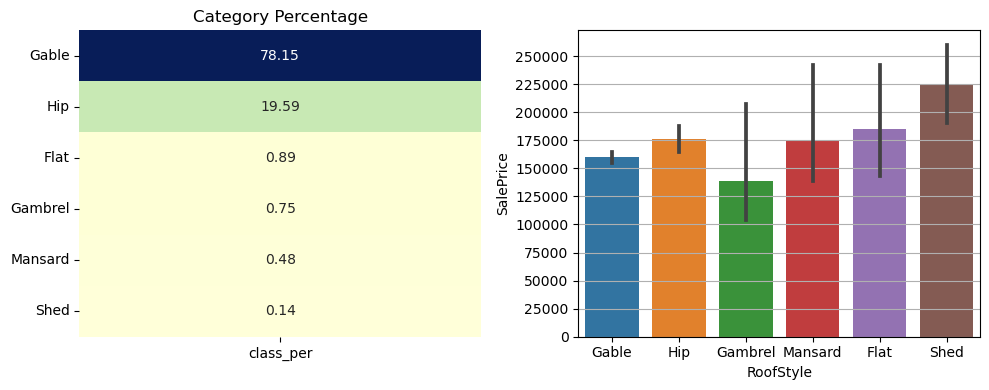

Null values in column are: 0


In [34]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['RoofStyle'].value_counts()
class_per = round(df['RoofStyle'].value_counts() / df['RoofStyle'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='RoofStyle',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['RoofStyle'].isnull().sum()}")

#### RoofStyle Conclusions:
- 78.15% of houses have the gable type of roof on the house .
- Houses with shed roof type have high median price

### 15. RoofMatl
Roof material.
- CompShg: Standard (Composite) Shingle- WdShngl: Wood Shingles- Metal: Metal roof- WdShake: Wood Shake- Membran: Membrane roof- Tar&Grv: Gravel & Tar roof- Roll: Roll roof- ClyTile: Clay or Tile roof


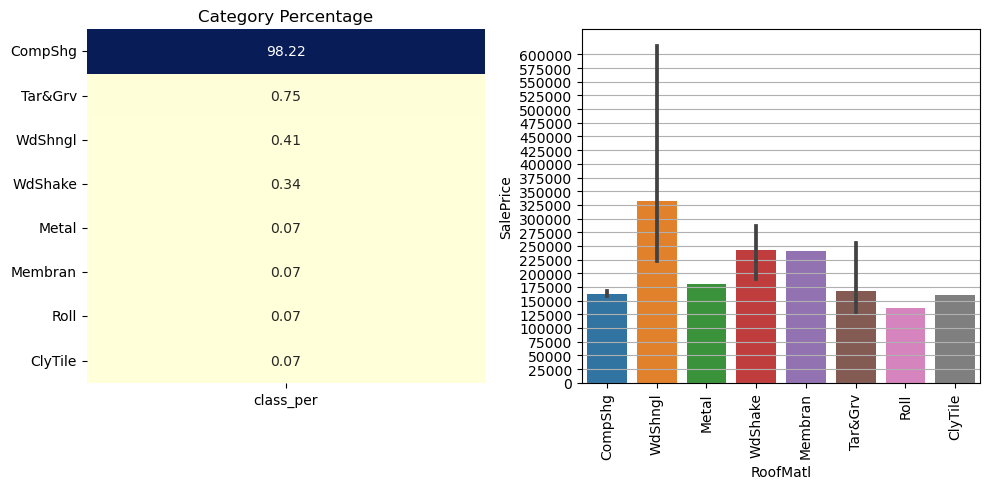

Null values in column are: 0


In [35]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['RoofMatl'].value_counts()
class_per = round(df['RoofMatl'].value_counts() / df['RoofMatl'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='RoofMatl',y='SalePrice',estimator='median')
plt.xticks(rotation='vertical')

plt.yticks(ticks=np.arange(0,625000,25000) ,labels=np.arange(0,625000,25000))
plt.grid(axis='y')
plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['RoofMatl'].isnull().sum()}")

#### RoofMatl Conclusions:
- 98.22% of houses are built using Standard (Composite) Shingle
- Houses built with WdShngl: Wood Shingles have high median sale price

### 16. Exterior1st
The secondary exterior covering on the house 
   - VinylSd: Vinyl siding- MetalSd: Metal siding- Wd Sdng: Wood siding- HdBoard: Hardboard siding
   - BrkFace: Brick face- WdShing: Wood shingles- CemntBd: Cement board siding- Plywood: Plywood siding
   - AsbShng: Asbestos shingles- Stucco: Stucco- BrkComm: Brick common- AsphShn: Asphalt shingles
   - Stone: Stone- ImStucc: Imitation Stucco- CBlock: Cinder Block


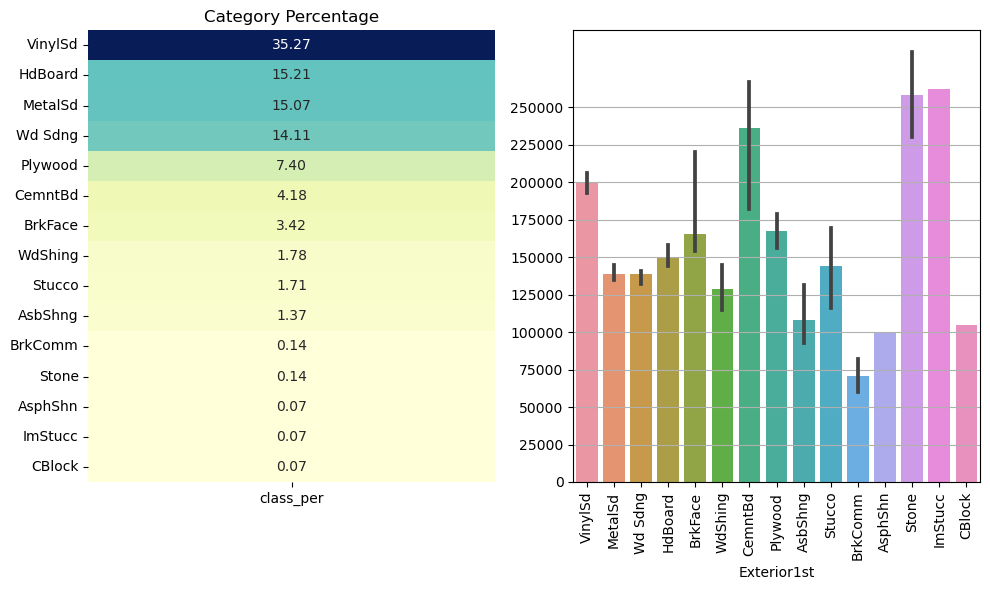

Null values in column are: 0


In [36]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
class_count = df['Exterior1st'].value_counts()
class_per = round(df['Exterior1st'].value_counts() / df['Exterior1st'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Exterior1st',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')
plt.ylabel("")
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Exterior1st'].isnull().sum()}")

#### Exterior1st Conclusions:
- 35.27 % of houses are built with the exterior covering of the house made of vinyl siding
- Houses with exterior of imitation stucco have high median sale price

### 17. Exterior2nd
The secondary exterior covering on the house (if more than one material).
   - VinylSd: Vinyl siding- MetalSd: Metal siding- Wd Sdng: Wood siding- HdBoard: Hardboard siding
   - BrkFace: Brick face- WdShing: Wood shingles- CemntBd: Cement board siding- Plywood: Plywood siding
   - AsbShng: Asbestos shingles- Stucco: Stucco- BrkComm: Brick common- AsphShn: Asphalt shingles
   - Stone: Stone- ImStucc: Imitation Stucco- CBlock: Cinder Block

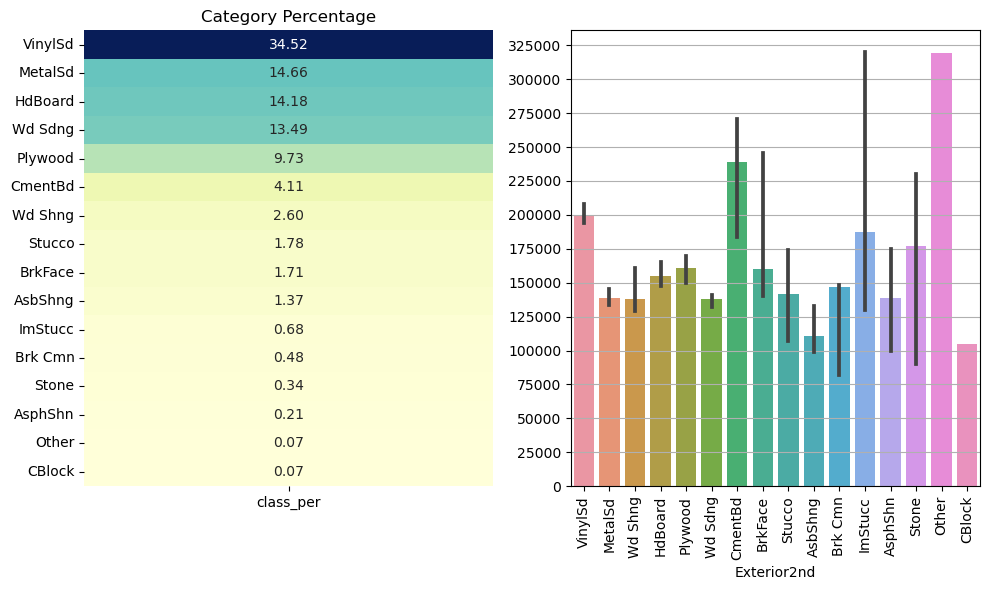

Null values in column are: 0


In [37]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
class_count = df['Exterior2nd'].value_counts()
class_per = round(df['Exterior2nd'].value_counts() / df['Exterior2nd'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Exterior2nd',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,350000,25000) ,labels=np.arange(0,350000,25000))
plt.grid(axis='y')
plt.ylabel("")
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Exterior2nd'].isnull().sum()}")

#### Exterior2nd Conclusions:
- 34.52 % of houses are built with the exterior covering of the house made of vinyl siding
- Houses built with exterior of other type have high median sale price

### 18. MasVnrType
Masonry veneer type.
   - BrkFace: Brick face veneer- None: No masonry veneer- Stone: Stone veneer- BrkCmn: Brick common

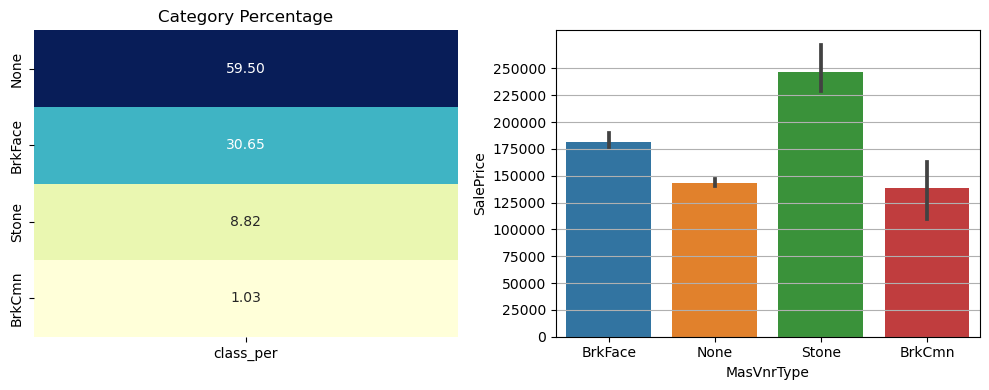

Null values in column are: 8


In [38]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['MasVnrType'].value_counts()
class_per = round(df['MasVnrType'].value_counts() / df['MasVnrType'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')


plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MasVnrType',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MasVnrType'].isnull().sum()}")

#### MasVnrArea Conclusions:
- There are 8 null values replace them with None category
- 59.50% of houses have None: No masonry veneer- -  type of masonry veneer on the house
- House with Stone: Stone veneer have high median sale price

### 19. ExterQual
Exterior material quality.
   - Ex: Excellent - Gd: Good - TA: Average/Typical - Fa: Fair

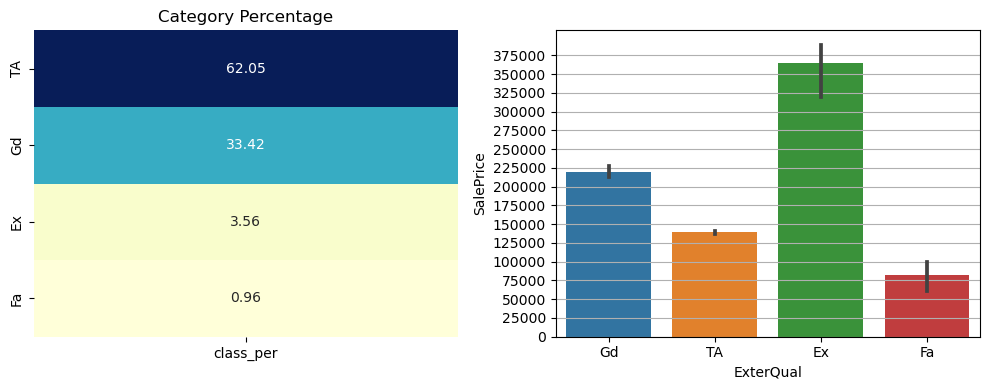

Null values in column are: 0


In [39]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['ExterQual'].value_counts()
class_per = round(df['ExterQual'].value_counts() / df['ExterQual'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='ExterQual',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,400000,25000) ,labels=np.arange(0,400000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['ExterQual'].isnull().sum()}")

#### MSZoning Conclusions:
- 62.05% of houses were built using TA (Average) quality  exterior material.
- Houses built with Excellent exterior material have high median sale price

### 20. ExterCond
Present condition of the material on the exterior.
   - Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor

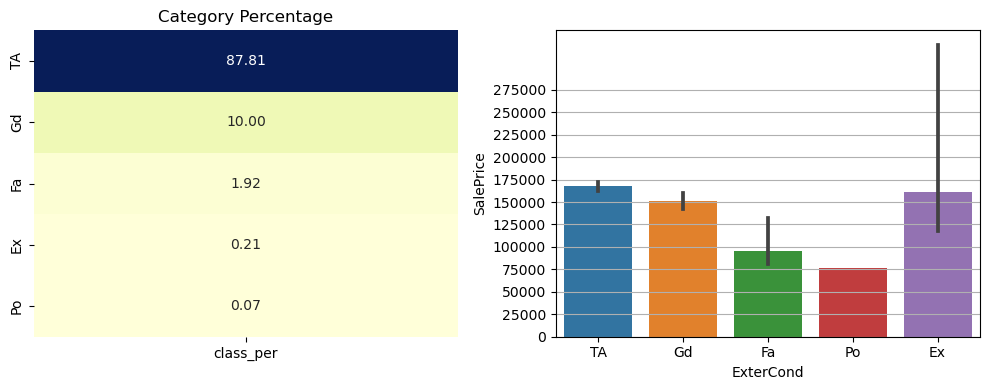

Null values in column are: 0


In [40]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['ExterCond'].value_counts()
class_per = round(df['ExterCond'].value_counts() / df['ExterCond'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='ExterCond',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,300000,25000) ,labels=np.arange(0,300000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['ExterCond'].isnull().sum()}")

#### ExterCond Conclusions:
- 87.81% of houses at present have TA (Average) exterior material.
- Houses with TA (Average) exterior material at present have high median sale price

### 21. Foundation
 Type of foundation.
- PConc: Poured Concrete - CBlock: Cinder Block - BrkTil: Brick & Tile - Wood: Wood - Slab: Slab - Stone: Stone

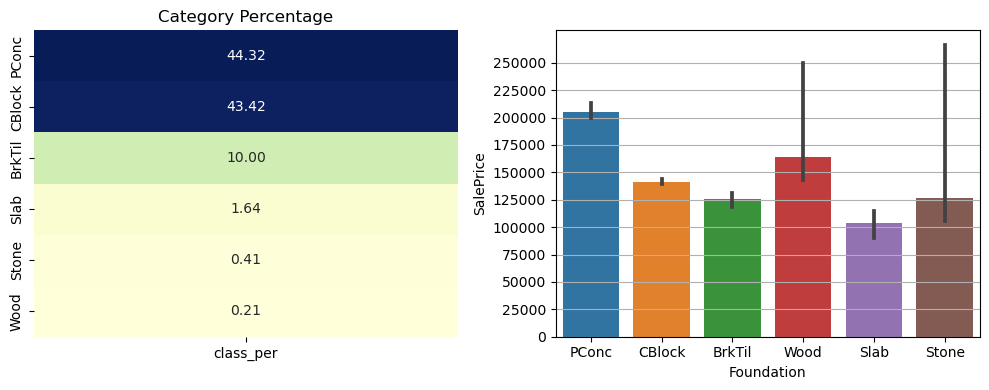

Null values in column are: 0


In [41]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Foundation'].value_counts()
class_per = round(df['Foundation'].value_counts() / df['Foundation'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Foundation',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Foundation'].isnull().sum()}")

#### Foundation Conclusions:
- 44.32% of houses are having PConc: Poured Concrete type of foundation of the house
- Houses with PConc: Poured Concrete foundation have high median sale price

### 22. BsmtQual
Height of the basement.
   - Ex: Excellent (100+ inches)- Gd: Good (90-99 inches)- TA: Average/Typical (80-89 inches)- Fa: Fair (70-79 inches)- Po: Poor (<70 inches)- NB: No Basement

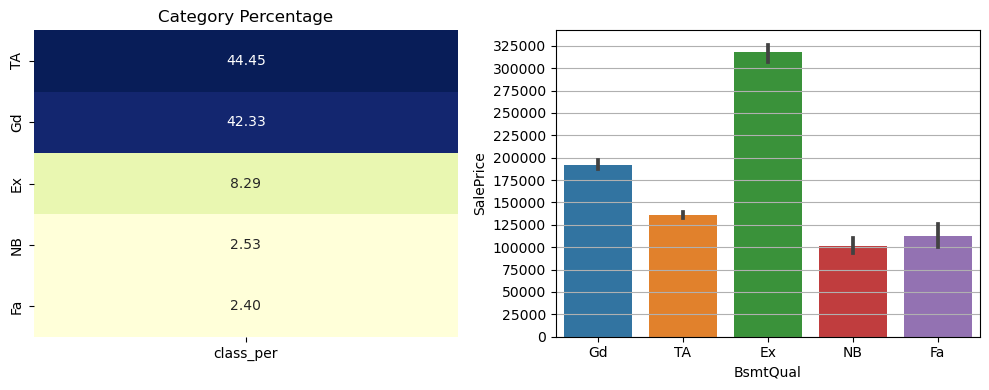

Null values in column are: 0


In [42]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtQual'].value_counts()
class_per = round(df['BsmtQual'].value_counts() / df['BsmtQual'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1,2, 2)
sns.barplot(data=df,x='BsmtQual',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,350000,25000) ,labels=np.arange(0,350000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtQual'].isnull().sum()}")

#### BsmtQual Conclusions:
- 44.45% of houses are having TA: Average/Typical (80-89 inches) quality basement 
- Houses with TA: Average/Typical (80-89 inches) quality basement have high median sale price

### 23. BsmtCond
General condition of the basement.
- Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor- NA: No Basement

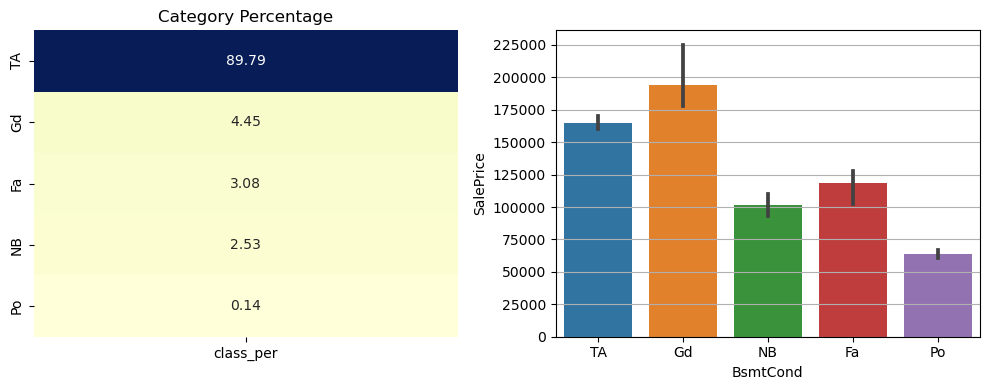

Null values in column are: 0


In [43]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtCond'].value_counts()
class_per = round(df['BsmtCond'].value_counts() / df['BsmtCond'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtCond',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtCond'].isnull().sum()}")

#### BsmtCond Conclusions:
- 89.79% of houses are having TA (Average) basement condition.
- Houses with GD (Good) basement condition have high median sale price

### 24. BsmtExposure
Walkout or garden level basement wall exposure.
- Gd: Good exposure- Av: Average exposure (split levels or foyers typically)- Mn: Minimal exposure- No: No exposure- NB: No Basement

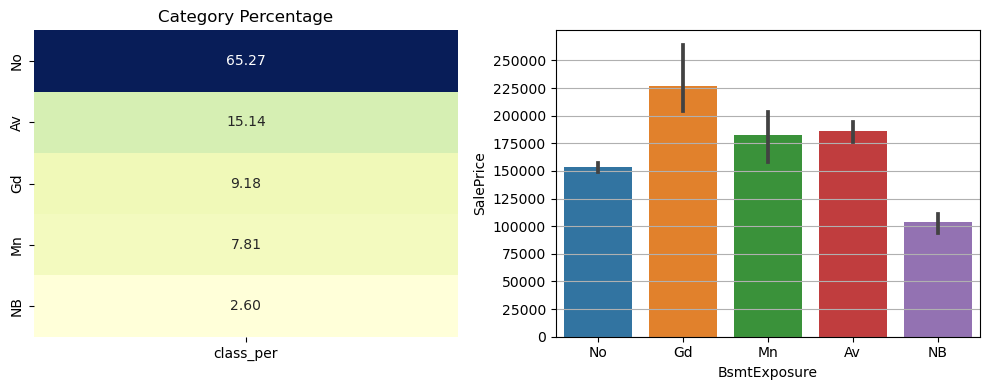

Null values in column are: 0


In [44]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtExposure'].value_counts()
class_per = round(df['BsmtExposure'].value_counts() / df['BsmtExposure'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtExposure',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtExposure'].isnull().sum()}")

#### BsmtExposure Conclusions:
- 65.27% of houses basement are having no Walkout or garden level basement wall exposure.
- Houese with Gd: Good exposure to Walkout or garden level basement have high median sale price

### 25. BsmtFinType1
 Quality of basement finished area.
   - GLQ: Good Living Quarters  - ALQ: Average Living Quarters  - BLQ: Below Average Living Quarters

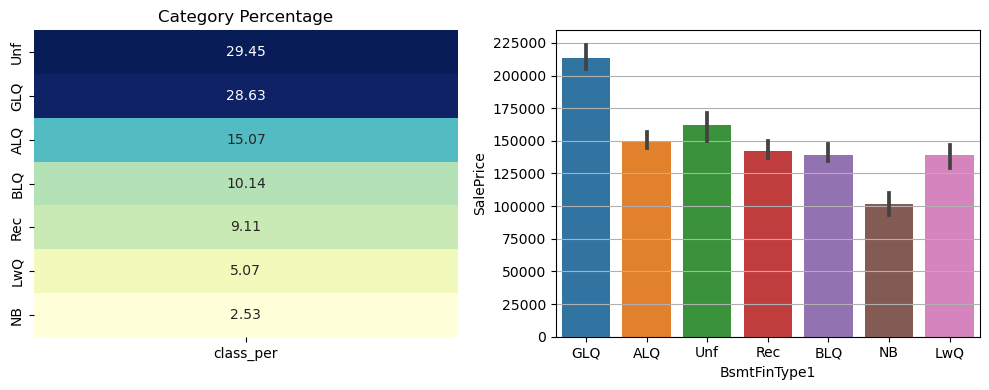

Null values in column are: 0


In [45]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtFinType1'].value_counts()
class_per = round(df['BsmtFinType1'].value_counts() / df['BsmtFinType1'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtFinType1',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtFinType1'].isnull().sum()}")

#### BsmtFinType1 Conclusions:
- 29.45% of houses have  ALQ: Average Living Quarters quality of the basement finished area.
- Houses with  GLQ: Good Living Quarters have high median sale price

### 26. BsmtFinType2
Quality of second finished area (if present).
- GLQ: Good Living Quarters- ALQ: Average Living Quarters- BLQ: Below Average Living Quarters- Rec: Average Rec Room- LwQ: Low Quality- Unf: Unfinished- NA: No Basement

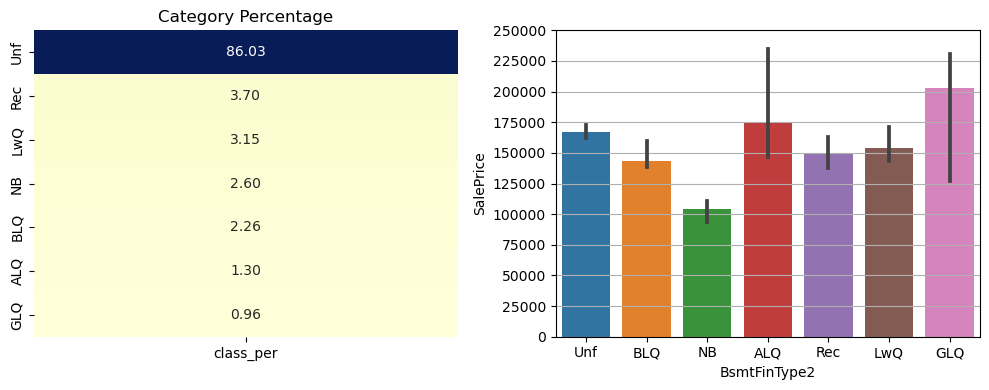

Null values in column are: 0


In [46]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtFinType2'].value_counts()
class_per = round(df['BsmtFinType2'].value_counts() / df['BsmtFinType2'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtFinType2',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtFinType2'].isnull().sum()}")

#### BsmtFinType2 Conclusions:
- 86.03% of houses have UNF (Unfinished) quality of the second finished area in the basement (if present).
- Houese with GLQ (Good Living Quarters) quality of the second finished area in the basement HAVE HIGH MEDIAN SALE PRICE

### 27. Heating
Type of heating.
- GasA: Gas forced warm air furnace- GasW: Gas hot water or steam heat- Grav: Gravity furnace- Wall: Wall furnace- OthW: Hot water or steam heat other than gas- Floor: Floor furnace

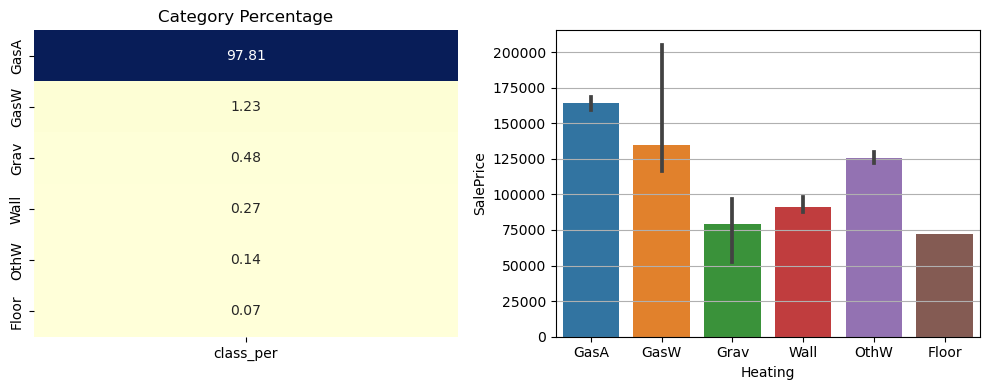

Null values in column are: 0


In [47]:
plt.figure(figsize=(10,4))

plt.subplot(1, 2, 1)
class_count = df['Heating'].value_counts()
class_per = round(df['Heating'].value_counts() / df['Heating'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Heating',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Heating'].isnull().sum()}")

#### Heating Conclusions:
- 97.81% of houses have GasA: Gas forced warm air furnace type of heating system in the house.
- Houses with GasA: Gas forced warm air furnace have high median sale price

### 28. HeatingQC
Heating quality and condition.
- Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor

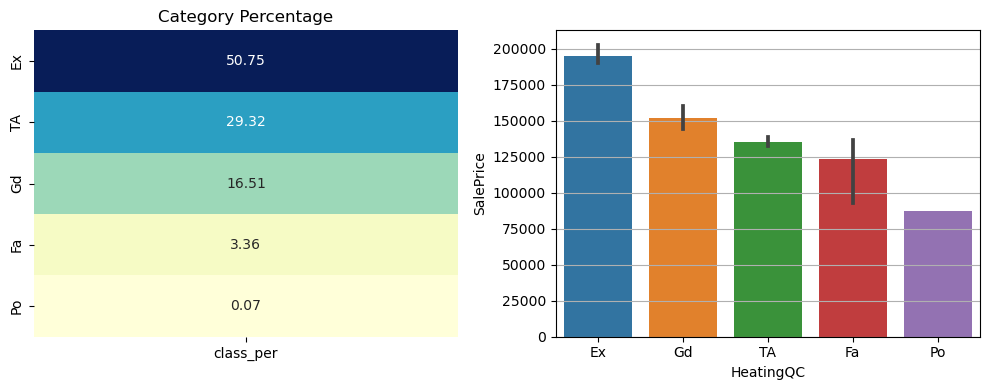

Null values in column are: 0


In [48]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['HeatingQC'].value_counts()
class_per = round(df['HeatingQC'].value_counts() / df['HeatingQC'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='HeatingQC',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['HeatingQC'].isnull().sum()}")

#### HeatingQC Conclusions:
- 50.75% of houses have Ex: Excellent Heating quality and condition
- Houses with Excellent heating quality nad condition have high median sale price

### 29. CentralAir
Central air conditioning.
- Y: Yes- N: No

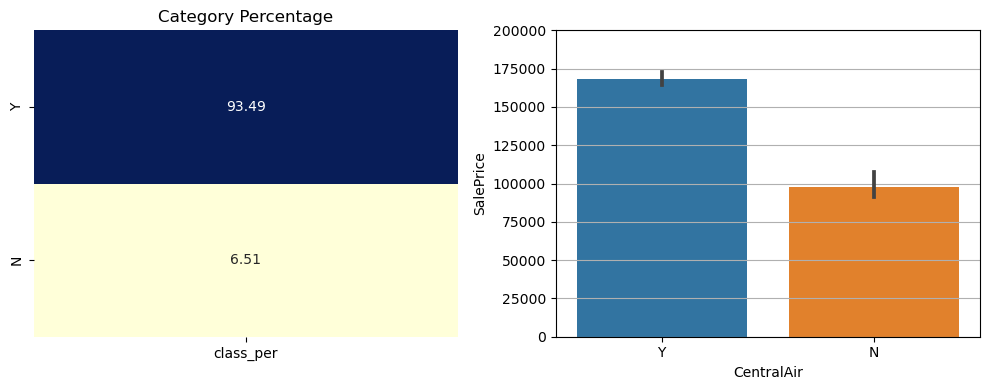

Null values in column are: 0


In [49]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['CentralAir'].value_counts()
class_per = round(df['CentralAir'].value_counts() / df['CentralAir'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='CentralAir',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['CentralAir'].isnull().sum()}")

#### CentralAir Conclusions:
- 93.49% of houses have  central air conditioning
- Houses with central air conditioning  have high median sale price

### 30. Electrical
Electrical system.
- SBrkr: Standard Circuit Breakers & Romex- FuseF: Fuse Box over 60 AMP and all Romex wiring (Average)
- FuseA: Fuse Box 60 AMP and all Romex wiring (Above Average)- FuseP: Fuse Box 60 AMP and less & mixed wiring (Pretty Low)- Mix: Mixed

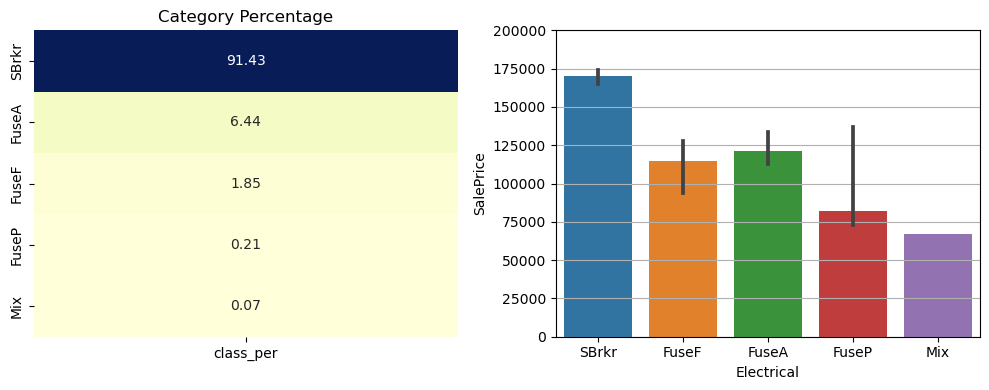

Null values in column are: 1


In [50]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Electrical'].value_counts()
class_per = round(df['Electrical'].value_counts() / df['Electrical'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')


plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Electrical',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Electrical'].isnull().sum()}")

#### Electrical Conclusions:
- There is 1 null value, replace it with mode vlaue SBrkr
- 91.43% of houses have SBrkr: Standard Circuit Breakers & Romex
- Houses with SBrkr: Standard Circuit Breakers & Romex have high median sale price 

### 31. KitchenQual
Kitchen quality.
- Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor

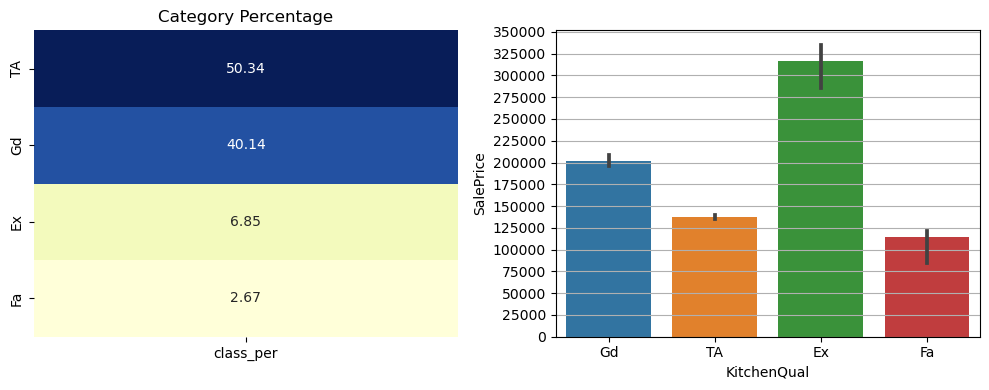

Null values in column are: 0


In [51]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['KitchenQual'].value_counts()
class_per = round(df['KitchenQual'].value_counts() / df['KitchenQual'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='KitchenQual',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,375000,25000) ,labels=np.arange(0,375000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['KitchenQual'].isnull().sum()}")

#### KitchenQual Conclusions:
- 50.34% of houses have TA (Avearge) quality of the kitchen.
- Houses with EX (Excellent) quality of kitchen have high median sale price

### 32. Functional
Home functionality rating.
   - Typ: Typical functionality- Min1: Minor deductions 1- Min2: Minor deductions 2
   - Mod: Moderate deductions- Maj1: Major deductions 1- Maj2: Major deductions 2- Sev: Severely damaged- Sal: Salvage only

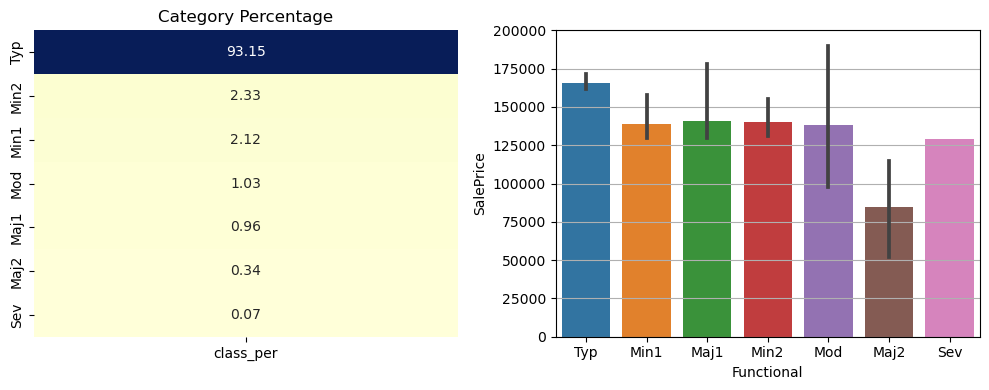

Null values in column are: 0


In [52]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Functional'].value_counts()
class_per = round(df['Functional'].value_counts() / df['Functional'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Functional',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Functional'].isnull().sum()}")

#### Functional Conclusions:
- 93.15% of houses are given Typ: Typical functionality  rating that assesses the overall functionality of the house.
- Houses with Typ: Typical functionality have high median sale price

### 33. Fireplaces
- No of Fireplace.

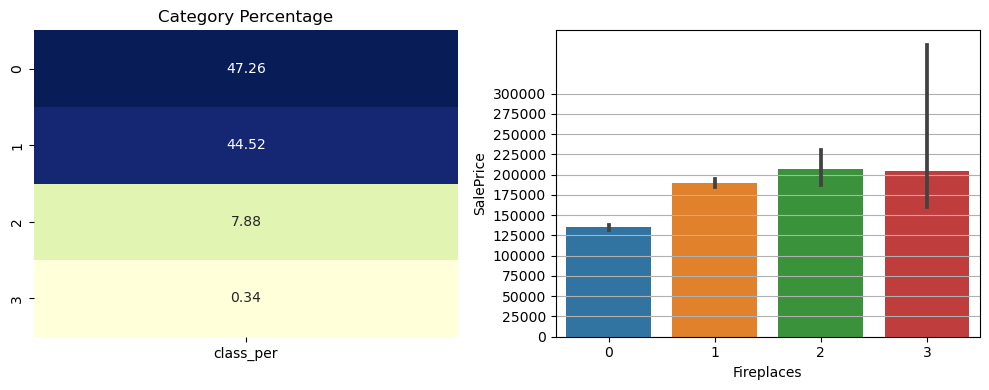

Null values in column are: 0


In [53]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Fireplaces'].value_counts()
class_per = round(df['Fireplaces'].value_counts() / df['Fireplaces'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Fireplaces',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Fireplaces'].isnull().sum()}")

#### MSZoning Conclusions:
- 47.26% of houses have 0 fireplaces in the house.
- Houses with 2 fire places have high median sale price.

### 34. GarageType
Garage location.
   - Attchd: Attached to home- Detchd: Detached from home
   - BuiltIn: Built-In (Garage part of the house - typically has room above garage)- CarPort: Car Port
   - Basment: Basement Garage- 2Types: More than one type of garage- NA: No Garage

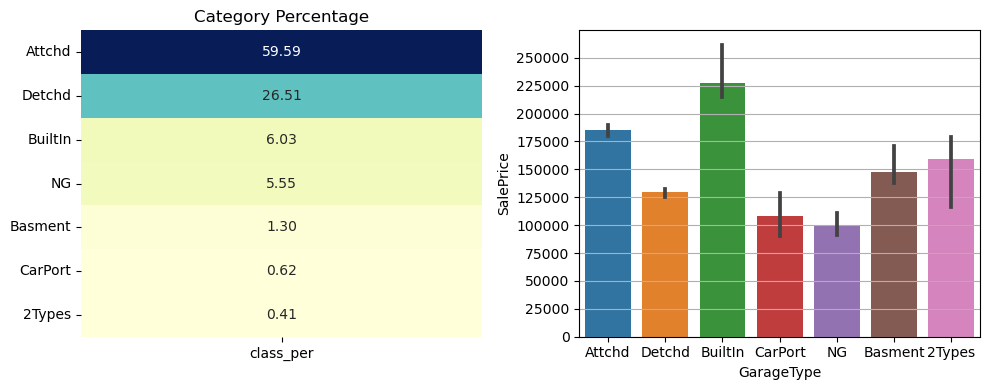

Null values in column are: 0


In [54]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['GarageType'].value_counts()
class_per = round(df['GarageType'].value_counts() / df['GarageType'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='GarageType',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,260000,25000) ,labels=np.arange(0,260000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['GarageType'].isnull().sum()}")

#### MSZoning Conclusions:
- 59.59% of houses have Garage Attchd: Attached to home.
- Houses with BuiltIn: Built-In (Garage part of the house) have high median sale price

### 35. GarageFinish
 Interior finish of the garage.
   - Fin: Finished- RFn: Rough Finished- Unf: Unfinished- NA: No Garage

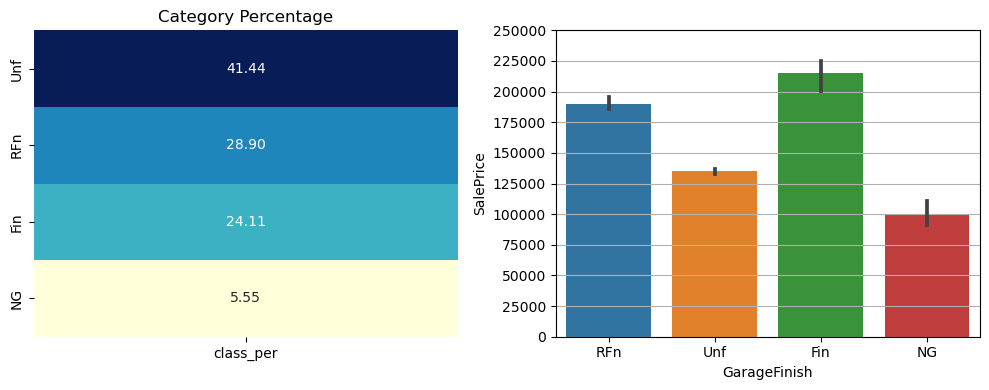

Null values in column are: 0


In [55]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['GarageFinish'].value_counts()
class_per = round(df['GarageFinish'].value_counts() / df['GarageFinish'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='GarageFinish',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['GarageFinish'].isnull().sum()}")

#### GarageFinish Conclusions:
- 41.44% of houses have Unf (Unfinished) interior finish of the garage.
- Houese with FIN(Finished)  interior finish of the garage have high median sale price

### 36. GarageQual
Garage quality.
   - Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor- NA: No Garage

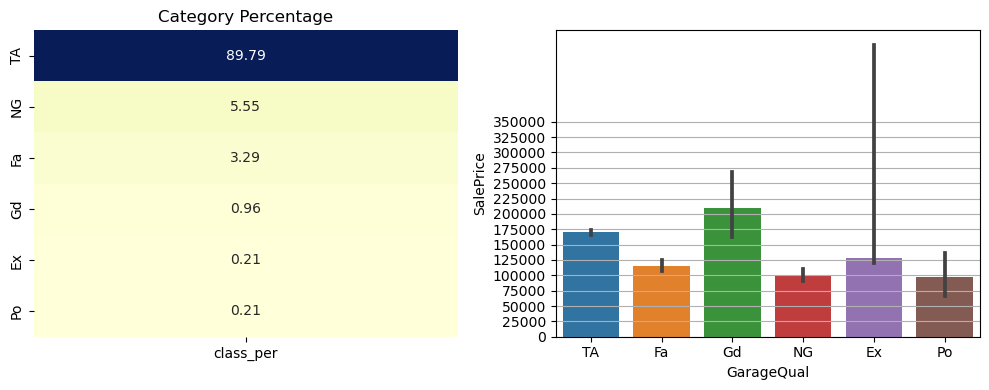

Null values in column are: 0


In [56]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['GarageQual'].value_counts()
class_per = round(df['GarageQual'].value_counts() / df['GarageQual'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='GarageQual',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,375000,25000) ,labels=np.arange(0,375000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['GarageQual'].isnull().sum()}")

#### GarageQual Conclusions:
- 89.79% of houses have TA (0Average) quality garage
- Houese with GD (Good) quality garage have high median sale price

### 37. GarageCond
 Garage condition.
- Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- Po: Poor- NA: No Garage

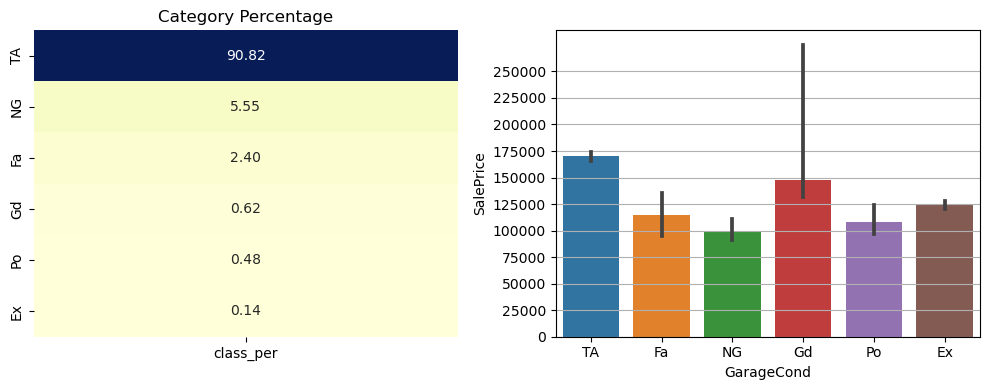

Null values in column are: 0


In [57]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['GarageCond'].value_counts()
class_per = round(df['GarageCond'].value_counts() / df['GarageCond'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='GarageCond',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['GarageCond'].isnull().sum()}")

#### GarageCond Conclusions:
- 90.82% of houses have TA (Average) quality Garage condition.
- Houses with GD (Good) garage quality condition have high median sale price

### 38. PavedDrive
 Paved driveway.
- Y: Yes- N: No- P: Partial Paved

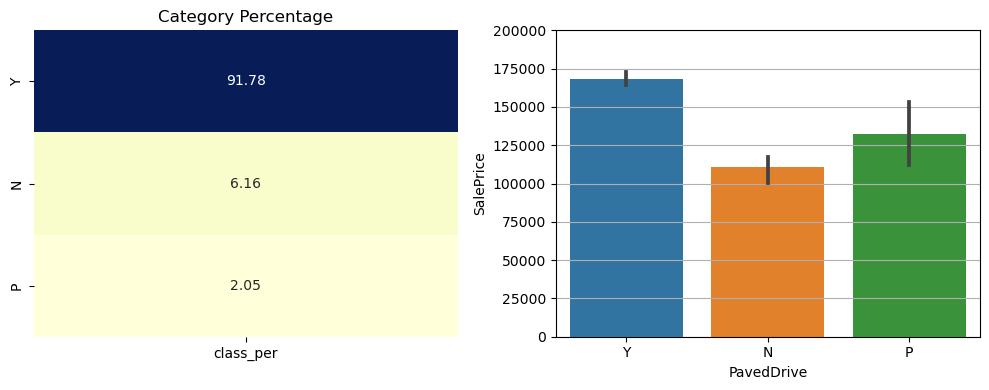

Null values in column are: 0


In [58]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['PavedDrive'].value_counts()
class_per = round(df['PavedDrive'].value_counts() / df['PavedDrive'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='PavedDrive',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['PavedDrive'].isnull().sum()}")

#### PavedDrive Conclusions:
- 91.78% of houses have partial paved driveway
- Houses with paved drive way have high median sale price

### 39. PoolQC
Pool quality.
- Ex: Excellent- Gd: Good- TA: Average/Typical- Fa: Fair- NP: No Pool

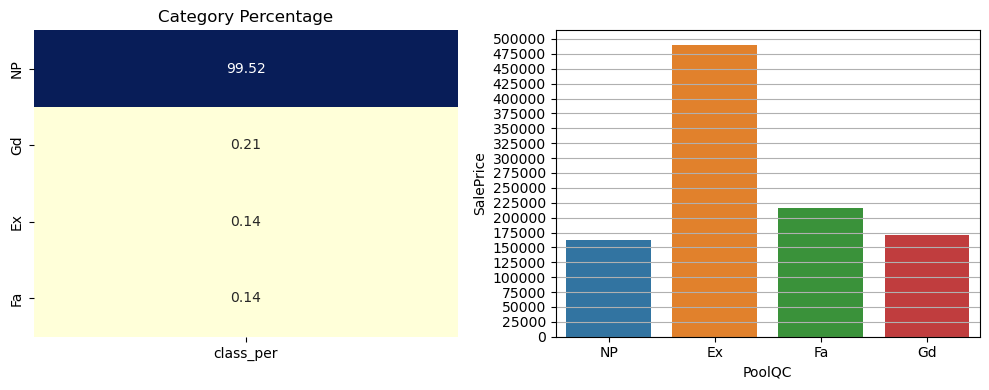

Null values in column are: 0


In [59]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['PoolQC'].value_counts()
class_per = round(df['PoolQC'].value_counts() / df['PoolQC'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='PoolQC',y='SalePrice',estimator='median',errorbar=None)
plt.yticks(ticks=np.arange(0,525000,25000) ,labels=np.arange(0,525000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['PoolQC'].isnull().sum()}")

#### PoolQC Conclusions:
- 99.52% of houses  have NP (No pool).
- Houses with EX (Excelelnt) pool quality have high median sale price

### 40. Fence
Fence quality.
   - GdPrv: Good Privacy- MnPrv: Minimum Privacy- GdWo: Good Wood- MnWw: Minimum Wood/Wire- NF: No Fence

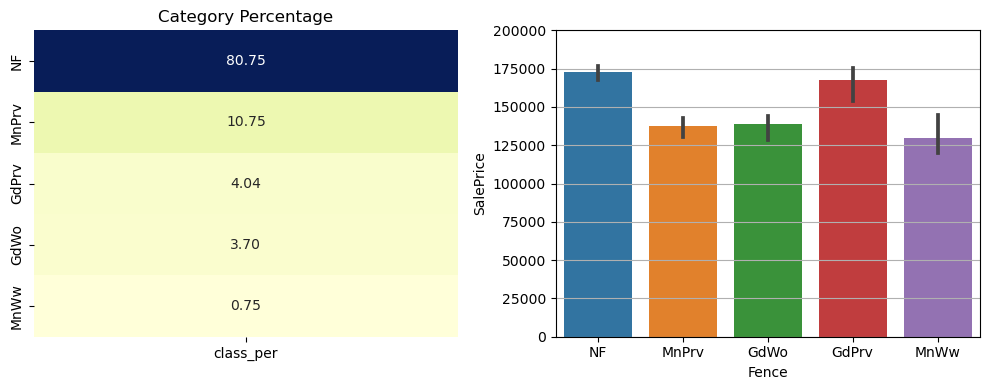

Null values in column are: 0


In [60]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Fence'].value_counts()
class_per = round(df['Fence'].value_counts() / df['Fence'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Fence',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Fence'].isnull().sum()}")

#### Fence Conclusions:
- 80.75% of houses have NF: No Fence
- Houses with NF: No Fence have high median sale price

### 41. MiscFeature
Miscellaneous feature not covered in other categories.
- Shed: Shed (over 100 SF)- Gar2: 2nd Garage (if not described in garage section)- Othr: Other- TenC: Tennis Court- NO: None

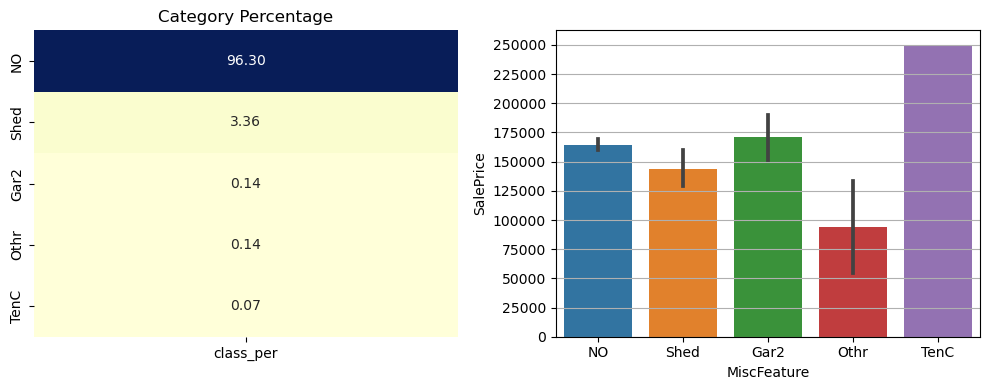

Null values in column are: 0


In [61]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['MiscFeature'].value_counts()
class_per = round(df['MiscFeature'].value_counts() / df['MiscFeature'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MiscFeature',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MiscFeature'].isnull().sum()}")

#### MiscFeature Conclusions:
- 96.30% of houses have NO: None Miscellaneous feature not covered in other categories.
- Houses with TenC: Tennis Court have high median sale price

### 42. SaleType
Type of sale.
   - WD: Warranty Deed - Conventional- CWD: Warranty Deed - Cash- VWD: Warranty Deed - VA Loan
   - New: Home just constructed and sold- COD: Court Officer Deed/Estate
   - Con: Contract 15% Down payment regular terms- ConLw: Contract Low Down payment and low interest
   - ConLI: Contract Low Interest- ConLD: Contract Low Down- Oth: Other

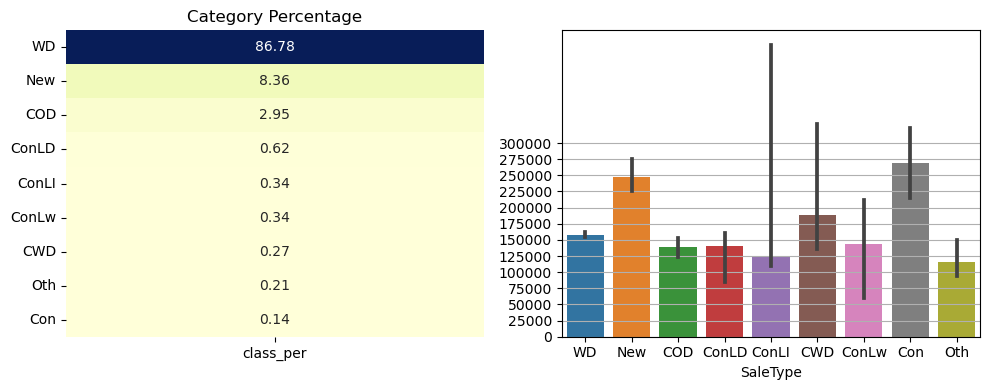

Null values in column are: 0


In [62]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['SaleType'].value_counts()
class_per = round(df['SaleType'].value_counts() / df['SaleType'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='SaleType',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')
plt.ylabel("")

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['SaleType'].isnull().sum()}")

#### SaleType Conclusions:
- 86.78% of houses have warranty deed type of sale
- Houses with Con: Contract 15% Down payment regular terms of sale type have high median sale price

### 43. SaleCondition
Condition of sale.
   - Normal: Normal Sale- Abnorml: Abnormal Sale - trade, foreclosure, short sale
   - AdjLand: Adjoining Land Purchase- Alloca: Allocation - two linked properties with separate deeds, typically condo with a garage unit
   - Family: Sale between family members- Partial: Home was not completed when last assessed (associated with New Homes)

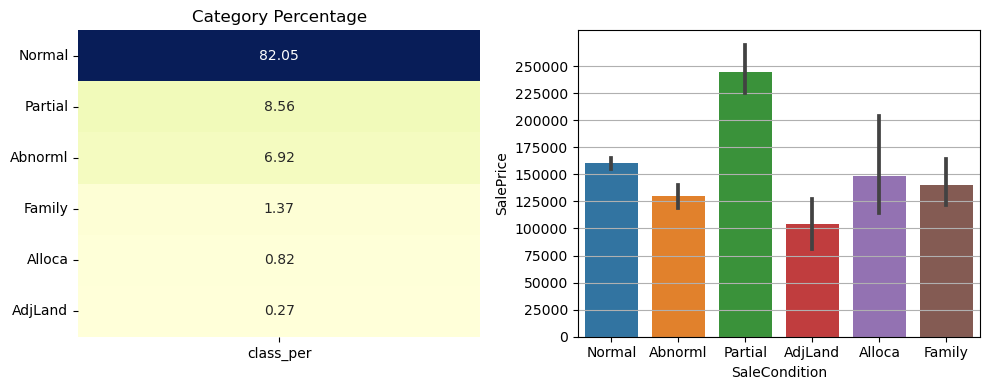

Null values in column are: 0


In [63]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['SaleCondition'].value_counts()
class_per = round(df['SaleCondition'].value_counts() / df['SaleCondition'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='SaleCondition',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['SaleCondition'].isnull().sum()}")

#### SaleCondition Conclusions:
- 82.05% of houses have normal  condition of the sale
- Houses with Partial: Home was not completed when last assessed (associated with New Homes) have high median sale price

### 44. MSSubClass
The building class.
   - 20: 1-STORY 1946 & NEWER ALL STYLES- 30: 1-STORY 1945 & OLDER- 40: 1-STORY W/FINISHED ATTIC ALL AGES
   - 45: 1-1/2 STORY - UNFINISHED ALL AGES- 50: 1-1/2 STORY FINISHED ALL AGES
   - 60: 2-STORY 1946 & NEWER- 70: 2-STORY 1945 & OLDER- 75: 2-1/2 STORY ALL AGES
   - 80: SPLIT OR MULTI-LEVEL- 85: SPLIT FOYER- 90: DUPLEX - ALL STYLES AND AGES- 120: 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
   - 150: 1-1/2 STORY PUD - ALL AGES- 160: 2-STORY PUD - 1946 & NEWER- 180: PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
   - 190: 2 FAMILY CONVERSION - ALL STYLES AND AGES

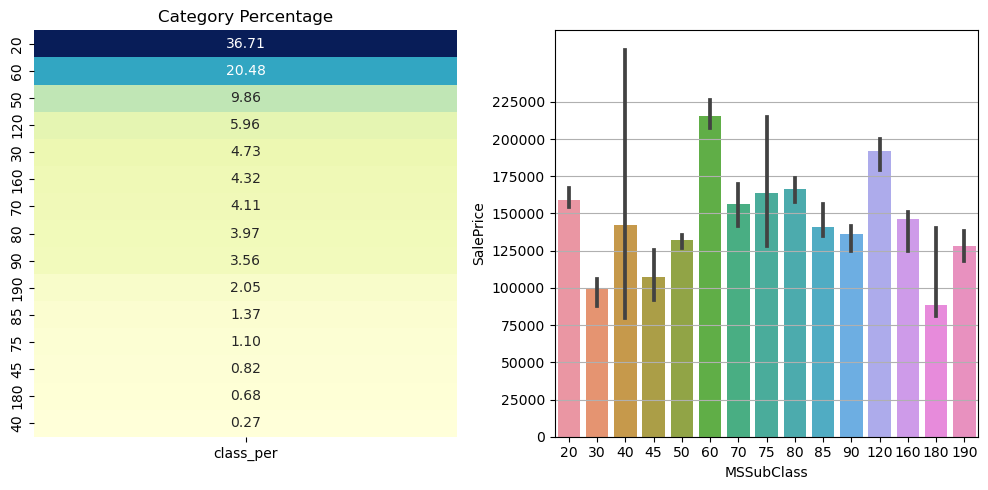

Null values in column are: 0


In [64]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['MSSubClass'].value_counts()
class_per = round(df['MSSubClass'].value_counts() / df['MSSubClass'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MSSubClass',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MSSubClass'].isnull().sum()}")

### MSSubClass conclusions:
- 36.71% of houses have 20: 1-STORY 1946 & NEWER ALL STYLES as buiilding class
- Houses with 60: 2-STORY 1946 & NEWER buildng clas have high median sale price

### 45. OverallQual
Overall material and finish quality of the house.
   - 10: Very Excellent- 9: Excellent- 8: Very Good- 7: Good- 6: Above Average- 5: Average
   - 4: Below Average- 3: Fair- 2: Poor- 1: Very Poor

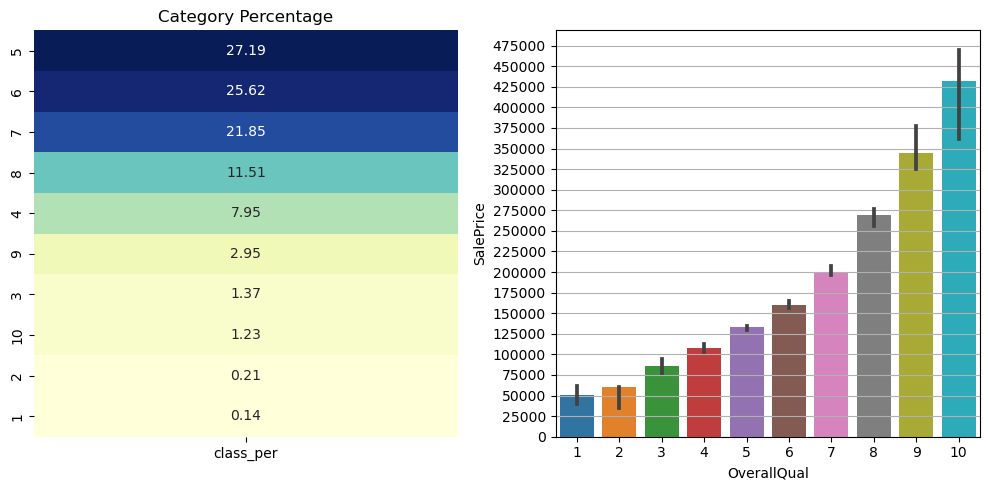

Null values in column are: 0


In [65]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['OverallQual'].value_counts()
class_per = round(df['OverallQual'].value_counts() / df['OverallQual'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='OverallQual',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,500000,25000) ,labels=np.arange(0,500000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['OverallQual'].isnull().sum()}")

#### OverallQual Conclusions:
- 27.19% of houses have 5 ratings, 25.62% have 6 ratings, and 21.85% have 7 ratings.Overall material and finish quality of the house, rated on a scale from 1 to 10.
- Houses with 10 ratings for Overall material and finish quality of the house have high median sale price

### 46. OverallCond
Overall condition rating of the house.
   - 10: Very Excellent- 9: Excellent- 8: Very Good- 7: Good- 6: Above Average- 5: Average- 4: Below Average- 3: Fai
   - 2: Poor- 1: Very Poor

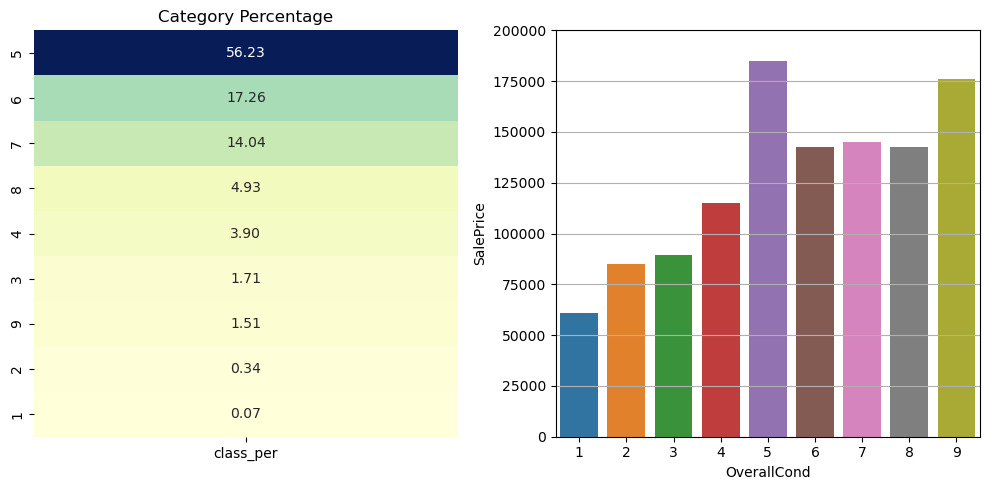

Null values in column are: 0


In [66]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['OverallCond'].value_counts()
class_per = round(df['OverallCond'].value_counts() / df['OverallCond'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='OverallCond',y='SalePrice',estimator='median',errorbar=None)
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['OverallCond'].isnull().sum()}")

#### OverallCond Conclusions:
- 56.23% of houses have 5 ratings for Overall condition rating of the house.
- Houses with 5 ratings for Overall condition rating of the house have high median sale price

### 47. LowQualFinSF
Low quality finished square feet (all floors).
   - Numeric value representing the area in square feet.

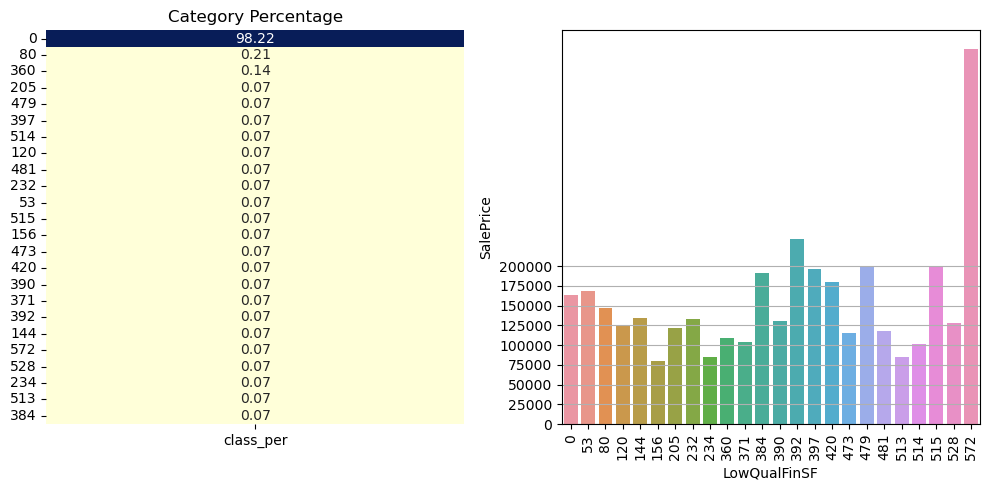

Null values in column are: 0


In [67]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['LowQualFinSF'].value_counts()
class_per = round(df['LowQualFinSF'].value_counts() / df['LowQualFinSF'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='LowQualFinSF',y='SalePrice',estimator='median',errorbar=None)
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['LowQualFinSF'].isnull().sum()}")

#### LowQualFinSF Conclusions:
- 98.22% of houses have Low quality finished square feet (all floors).
- Houses with 572 square feet have high median sale price

### 48. BsmtFullBath
 Basement full bathrooms.
   - Numeric value indicating the number of full bathrooms in the basement.

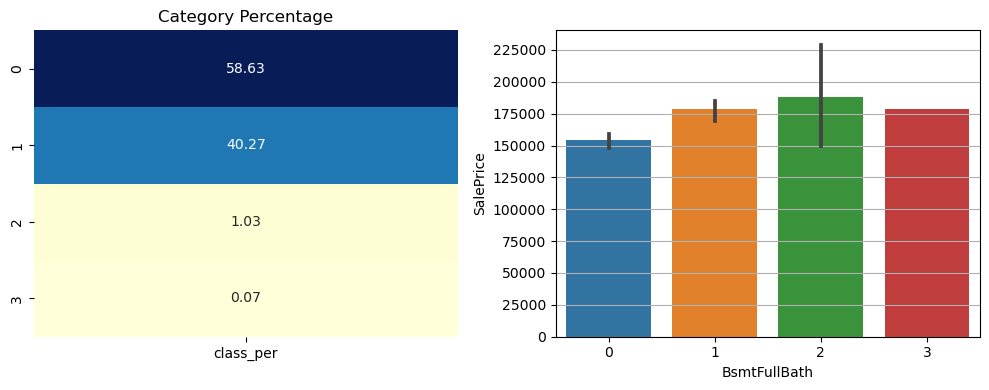

Null values in column are: 0


In [68]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtFullBath'].value_counts()
class_per = round(df['BsmtFullBath'].value_counts() / df['BsmtFullBath'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtFullBath',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,250000,25000) ,labels=np.arange(0,250000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtFullBath'].isnull().sum()}")

#### BsmtFullBath Conclusions:
- 58.63% of houses have 0 basement full bathrooms. 40.27% have 1
- Houses with 2 basement full bath rooms have high median sale price

### 49. BsmtHalfBath
Basement half bathrooms.
   - Numeric value indicating the number of half bathrooms in the basement.

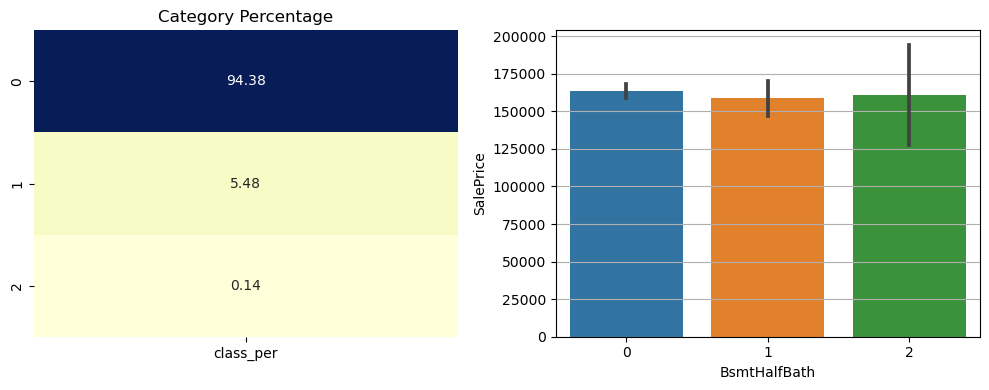

Null values in column are: 0


In [69]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['BsmtHalfBath'].value_counts()
class_per = round(df['BsmtHalfBath'].value_counts() / df['BsmtHalfBath'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BsmtHalfBath',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BsmtHalfBath'].isnull().sum()}")

#### BsmtHalfBath Conclusions:
- 94.38% of houses have 0  number of basement half bathrooms.
- Houses with 0 basement half bathrooms have high median sale price

### 50. FullBath
Full bathrooms above grade (excluding basement).
   - Numeric value indicating the number of full bathrooms above ground level.

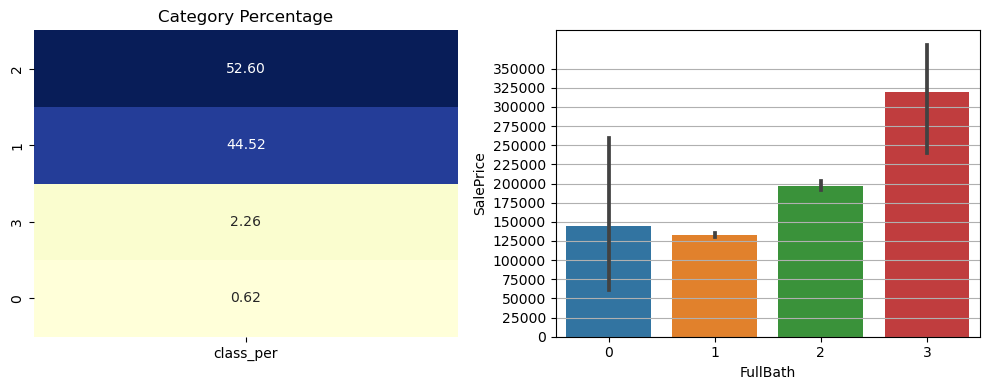

Null values in column are: 0


In [70]:
plt.figure(figsize=(10,4))

plt.subplot(1, 2, 1)
class_count = df['FullBath'].value_counts()
class_per = round(df['FullBath'].value_counts() / df['FullBath'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='FullBath',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,375000,25000) ,labels=np.arange(0,375000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['FullBath'].isnull().sum()}")

#### FullBath Conclusions:
- 52.60% of houses have 2 number of full bathrooms above ground level. and 44.52% have 1 number of full bathrooms above ground level.
- Houses with 3 full bathrooms above ground level have high median sale price

### 51. HalfBath
Half bathrooms above grade (excluding basement).
   - Numeric value indicating the number of half bathrooms above ground level.

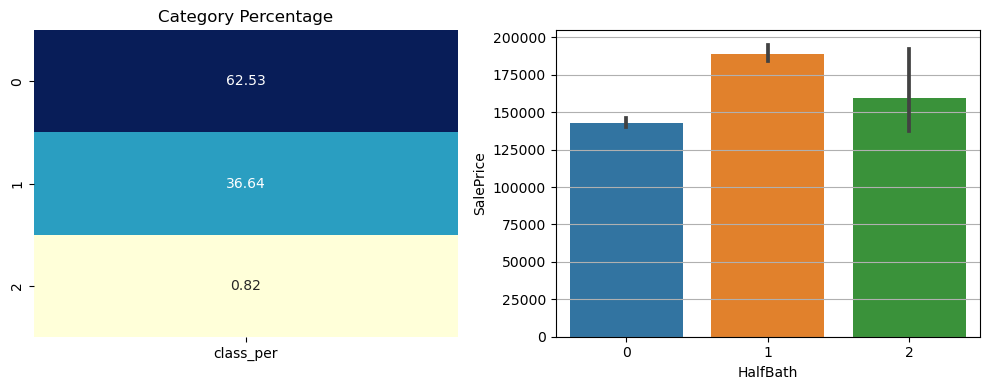

Null values in column are: 0


In [71]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['HalfBath'].value_counts()
class_per = round(df['HalfBath'].value_counts() / df['HalfBath'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='HalfBath',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['HalfBath'].isnull().sum()}")

#### HalfBath Conclusions:
- 62.53% of houses have 0 number of half bathrooms above ground level and 36.64% have 1 number of half bathrooms above ground level
- Houses with 1 number of half bathrooms above ground level have high median sale price

### 52. BedroomAbvGr
Bedrooms above grade (does NOT include basement bedrooms).
   - Numeric value indicating the number of bedrooms above ground level.


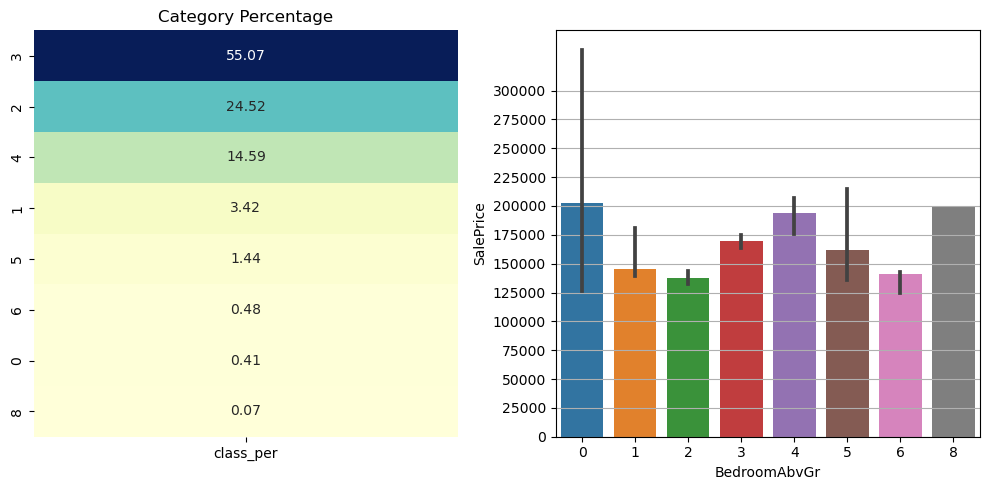

Null values in column are: 0


In [72]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
class_count = df['BedroomAbvGr'].value_counts()
class_per = round(df['BedroomAbvGr'].value_counts() / df['BedroomAbvGr'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='BedroomAbvGr',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['BedroomAbvGr'].isnull().sum()}")

#### BedroomAbvGr Conclusions:
- 55.07% of houses have 3 number of bedrooms above ground level.
- Houses with 0 number of bedrooms above ground level have high median sale price

### 53. KitchenAbvGr
Kitchens above grade.
   - Numeric value indicating the number of kitchens above ground level.

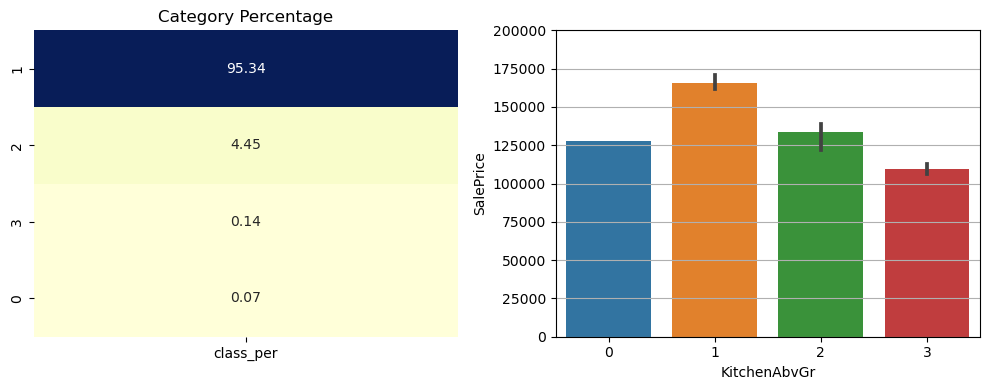

Null values in column are: 0


In [73]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['KitchenAbvGr'].value_counts()
class_per = round(df['KitchenAbvGr'].value_counts() / df['KitchenAbvGr'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='KitchenAbvGr',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['KitchenAbvGr'].isnull().sum()}")

#### KitchenAbvGr Conclusions:
- 95.34% of houses have 1  number of kitchens above ground level
- Houses with 1 number of kitchens above ground level have high median sal eprice

### 54. TotRmsAbvGrd
Total rooms above grade (does not include bathrooms).
   - Numeric value indicating the total number of rooms (excluding bathrooms) above ground level.

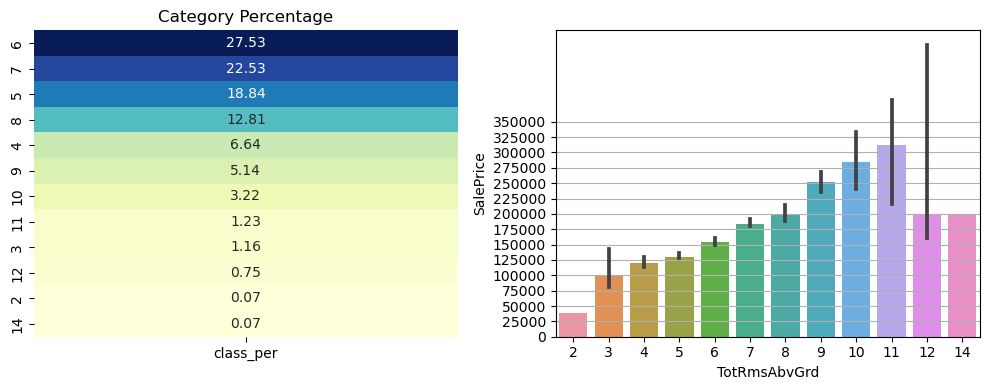

Null values in column are: 0


In [74]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['TotRmsAbvGrd'].value_counts()
class_per = round(df['TotRmsAbvGrd'].value_counts() / df['TotRmsAbvGrd'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='TotRmsAbvGrd',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,375000,25000) ,labels=np.arange(0,375000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['TotRmsAbvGrd'].isnull().sum()}")

#### TotRmsAbvGrd Conclusions:
- 27.53% of houses have 6  total number of rooms (excluding bathrooms) above ground level
- Houses with 11 total number of rooms (excluding bathrooms) above ground level have high median sale price

### 55. Fireplaces
Number of fireplaces.
   - Numeric value indicating the number of fireplaces in the house.

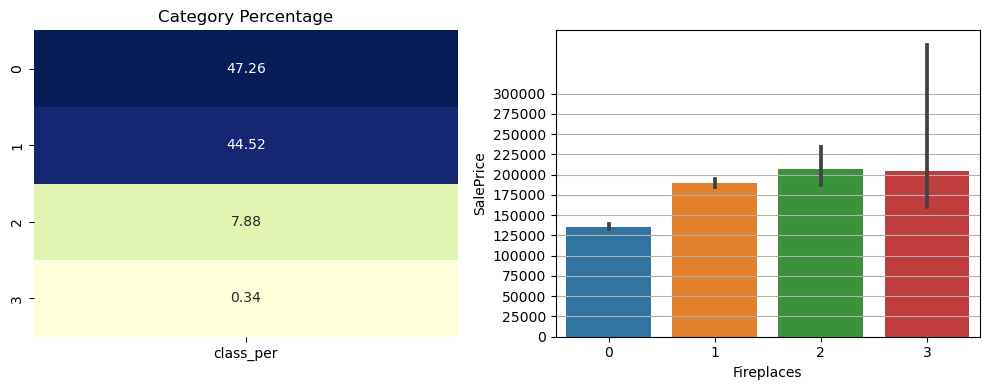

Null values in column are: 0


In [75]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['Fireplaces'].value_counts()
class_per = round(df['Fireplaces'].value_counts() / df['Fireplaces'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='Fireplaces',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,325000,25000) ,labels=np.arange(0,325000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['Fireplaces'].isnull().sum()}")

#### Fireplaces Conclusions:
- 47.26% of houses have  0  number of fire places
- Houses with 2 fire places have high median sale price

### 56. GarageCars
Size of garage in car capacity.
   - Numeric value indicating the number of cars the garage can accommodate.

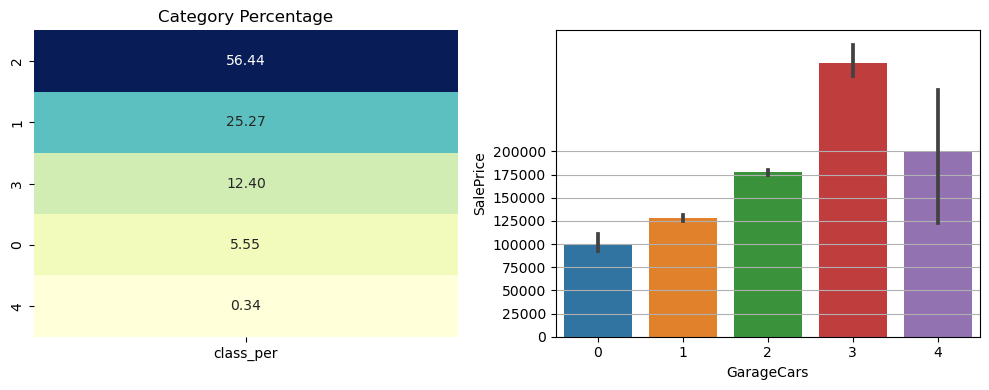

Null values in column are: 0


In [76]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_count = df['GarageCars'].value_counts()
class_per = round(df['GarageCars'].value_counts() / df['GarageCars'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='GarageCars',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['GarageCars'].isnull().sum()}")

#### GarageCars Conclusions:
- 56.44% of houses have garage that can accomodate 2 number of cars 
- 81.71% of houses have garage that can accomodate either 1 or 2 cars
- Garage that can accomodate 3 number of cars have high median sale price

### 57. 3SsnPorch
Three-season porch area in square feet.
Numeric value representing the area in square feet.

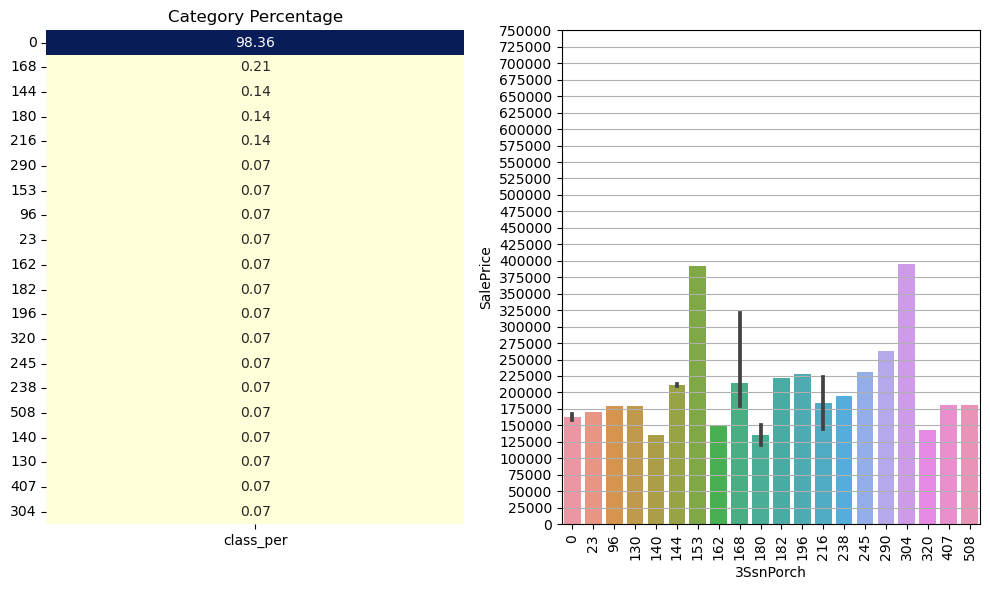

Null values in column are: 0


In [77]:
plt.figure(figsize=(10,6))

plt.subplot(1, 2, 1)
class_count = df['3SsnPorch'].value_counts()
class_per = round(df['3SsnPorch'].value_counts() / df['3SsnPorch'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1,2, 2)
sns.barplot(data=df,x='3SsnPorch',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,775000,25000) ,labels=np.arange(0,775000,25000))
plt.grid(axis='y')
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['3SsnPorch'].isnull().sum()}")

### 3SsnPorch conclusions:
- 98.36% houses have no porch (3SsnPorch) at all
- Houses with porch size of 304 square feet have high median sale price

### 58. PoolArea
Pool area in square feet.
Numeric value representing the area in square feet.

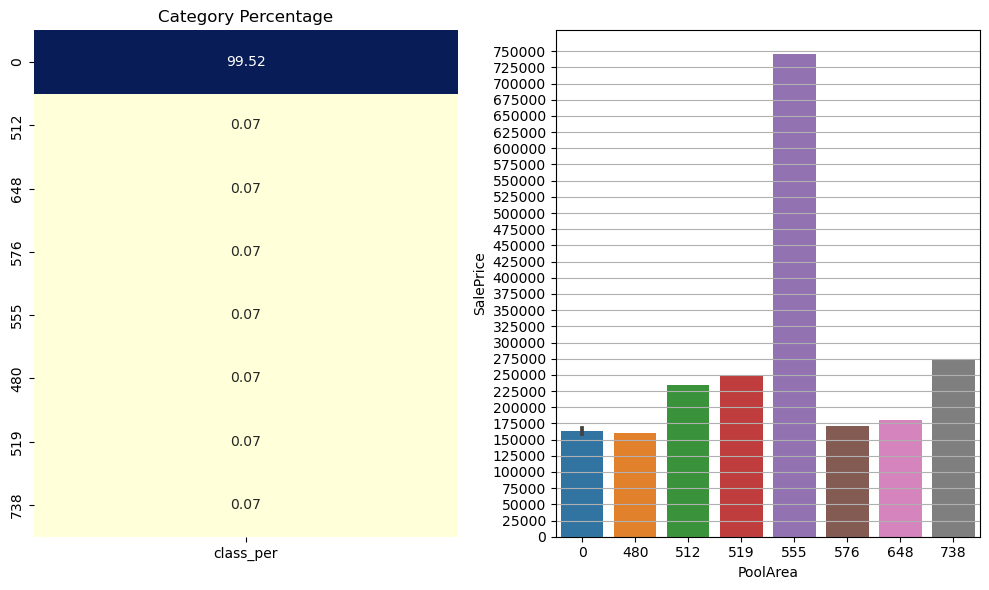

Null values in column are: 0


In [78]:
plt.figure(figsize=(10,6))

plt.subplot(1, 2, 1)
class_count = df['PoolArea'].value_counts()
class_per = round(df['PoolArea'].value_counts() / df['PoolArea'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1,2, 2)
sns.barplot(data=df,x='PoolArea',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,775000,25000) ,labels=np.arange(0,775000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['PoolArea'].isnull().sum()}")

#### PoolArea Conclusions:
- 99.52% of houses doesn't have pool area
- Houses with pool are aof 55 square feet have high median sale price

### 59. MiscVal
Miscellaneous feature value.
Numeric value representing the value of miscellaneous features.

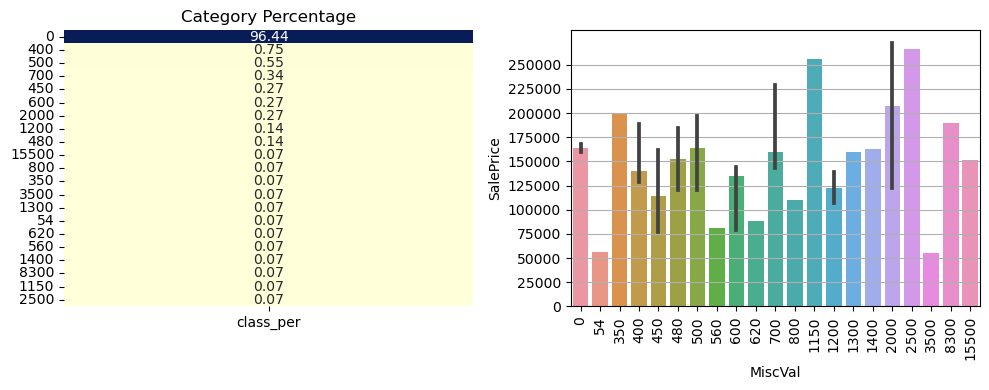

Null values in column are: 0


In [79]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_per = round(df['MiscVal'].value_counts() / df['MiscVal'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MiscVal',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')
plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MiscVal'].isnull().sum()}")

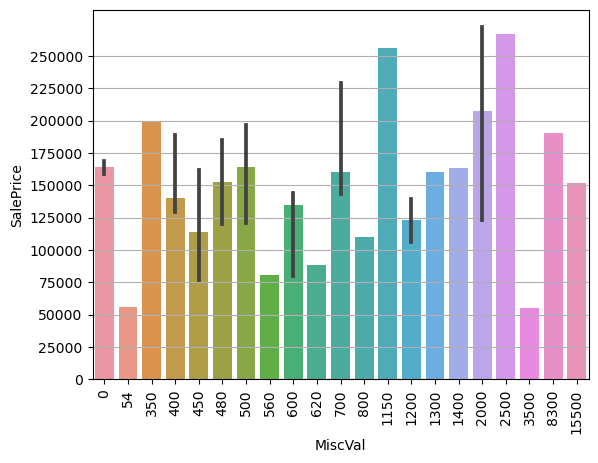

In [80]:
sns.barplot(data=df,x='MiscVal',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,275000,25000) ,labels=np.arange(0,275000,25000))
plt.grid(axis='y')
plt.xticks(rotation='vertical')
plt.show()

### 60. MoSold
Month sold (MM).
Numeric value indicating the month (1-12) when the house was sold.

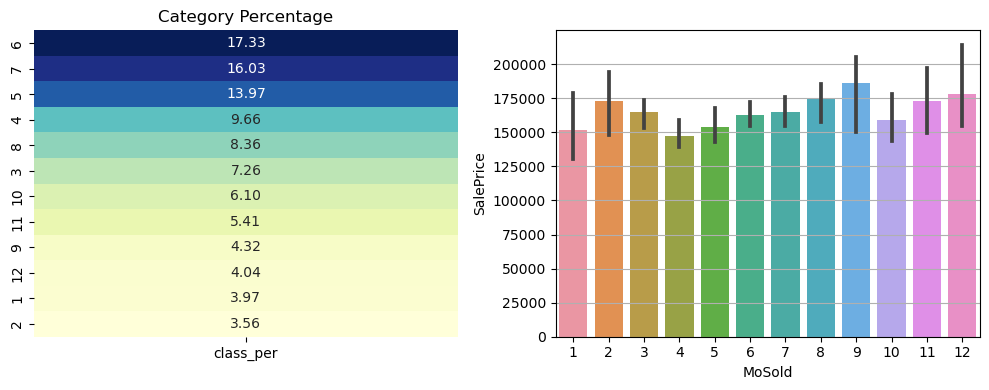

Null values in column are: 0


In [81]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_per = round(df['MoSold'].value_counts() / df['MoSold'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='MoSold',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['MoSold'].isnull().sum()}")

### MosSold conclusions:
- 56.99% of houses were sold in 3,4,5, and 6th month of year
- Houses sold in 9th month (October) have high median sale price

### 61. YrSold
Year sold (YYYY).
Numeric value indicating the year when the house was sold.

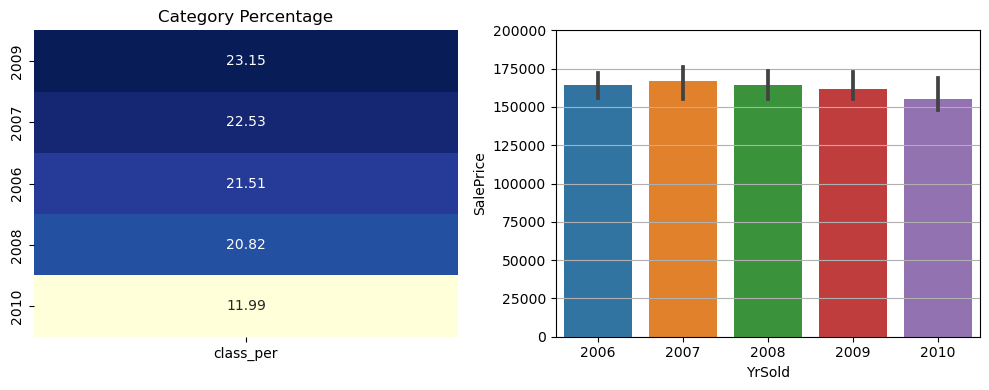

Null values in column are: 0


In [82]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
class_per = round(df['YrSold'].value_counts() / df['YrSold'].value_counts().sum() * 100, 2)
contingency_table = pd.DataFrame({'class_per': class_per})
sns.heatmap(contingency_table, annot=True , fmt='.2f', cmap='YlGnBu', cbar=False)
plt.title('Category Percentage')

plt.subplot(1, 2, 2)
sns.barplot(data=df,x='YrSold',y='SalePrice',estimator='median')
plt.yticks(ticks=np.arange(0,225000,25000) ,labels=np.arange(0,225000,25000))
plt.grid(axis='y')

plt.tight_layout()
plt.show()

print(f"Null values in column are: {df['YrSold'].isnull().sum()}")

#### YrSold Conclusions:
- 88.01% of houses were sold before year 2010
- Median price at which houses are sold seems to decrease year by year

## 62. Id
- This column represents a unique identifier for each record or observation in the dataset.

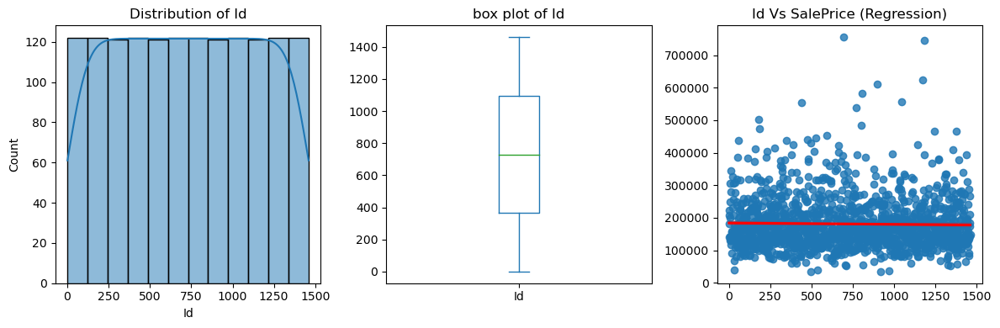

Null values in column are:    0
Skewness value is:    0.0
Correlation between Features: -0.021916719443431106


In [83]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='Id',ax=ax[0],kde=True)
df['Id'].plot(kind='box',ax=ax[1])
sns.regplot(x='Id', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('Distribution of Id')

ax[1].set_title('box plot of Id')
ax[1].set_xlabel('')

ax[2].set_title('Id Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['Id'].isnull().sum()}")
print(f"Skewness value is:    {df['Id'].skew()}")
correlation = df['Id'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### Id conclusions:
- There are no null values and feature is normally distibuted

## 63. LotFrontage
- It refers to the linear feet of street connected to the property. It represents the length of the frontage of the lot.

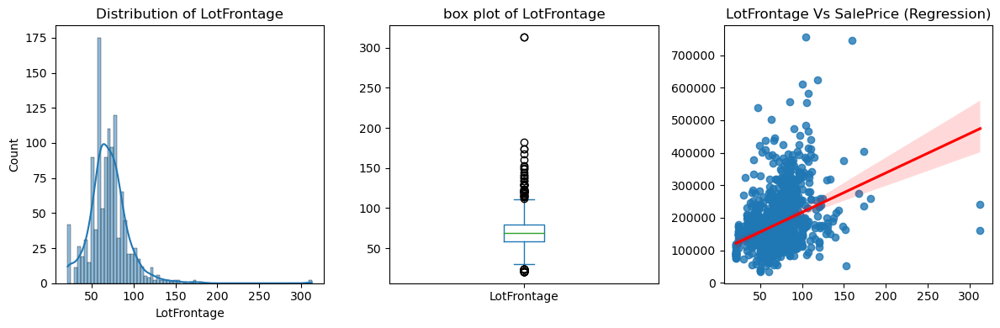

Null values in column are:    259
Skewness value is:    2.163569142324884
Correlation between Features: 0.35179909657067804


In [84]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='LotFrontage',ax=ax[0],kde=True)
df['LotFrontage'].plot(kind='box',ax=ax[1])
sns.regplot(x='LotFrontage', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})
# Set titles and labels
ax[0].set_title('Distribution of LotFrontage')
ax[1].set_title('box plot of LotFrontage')
ax[1].set_xlabel('')
ax[2].set_title('LotFrontage Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['LotFrontage'].isnull().sum()}")
print(f"Skewness value is:    {df['LotFrontage'].skew()}")
correlation = df['LotFrontage'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### LotFrontage conclusions:
- There are 259 null values replcae them with median because feature is positively skewed, and there are outliers
- As LotFrontage feet increases house price seems to increase

## 64. LotArea
- This column represents the total area of the lot in square feet. It provides information about the size of the property.

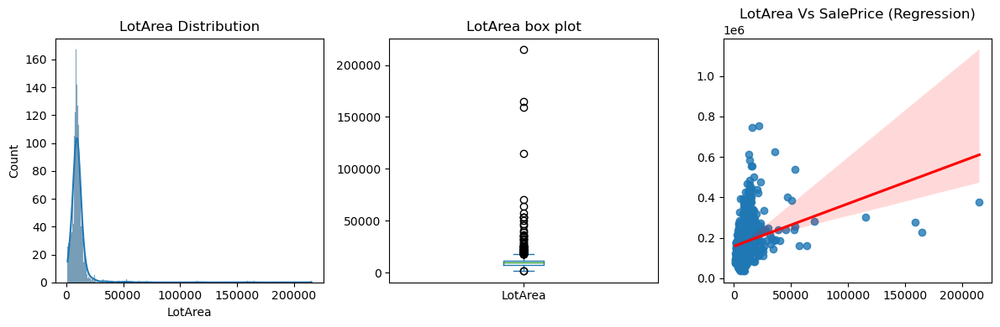

Null values in column are:    0
Skewness value is:    12.207687851233496
Correlation between Features: 0.26384335387140573


In [85]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='LotArea',ax=ax[0],kde=True)
df['LotArea'].plot(kind='box',ax=ax[1])
sns.regplot(x='LotArea', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('LotArea Distribution')

ax[1].set_title('LotArea box plot')
ax[1].set_xlabel('')

ax[2].set_title('LotArea Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['LotArea'].isnull().sum()}")
print(f"Skewness value is:    {df['LotArea'].skew()}")
correlation = df['LotArea'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### LotArea conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- Most houses have LotArea around 0 to 3000 square feet.

## 65. YearBuilt
- It denotes the year when the house was originally constructed. It indicates the age of the property.

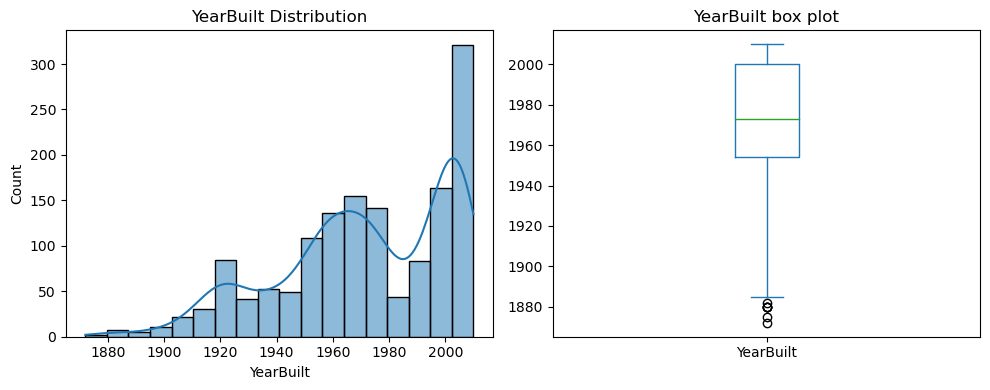

Null values in column are:    0
Skewness value is:    -0.613461172488183


In [86]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

sns.histplot(data=df, x='YearBuilt',ax=ax[0],kde=True)
df['YearBuilt'].plot(kind='box',ax=ax[1])

# Set titles and labels
ax[0].set_title('YearBuilt Distribution')

ax[1].set_title('YearBuilt box plot')
ax[1].set_xlabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['YearBuilt'].isnull().sum()}")
print(f"Skewness value is:    {df['YearBuilt'].skew()}")

In [87]:
# Subtract year sold col by year built col to get the age of house when it was sold
Age_of_house = df['YrSold'] - df['YearBuilt']

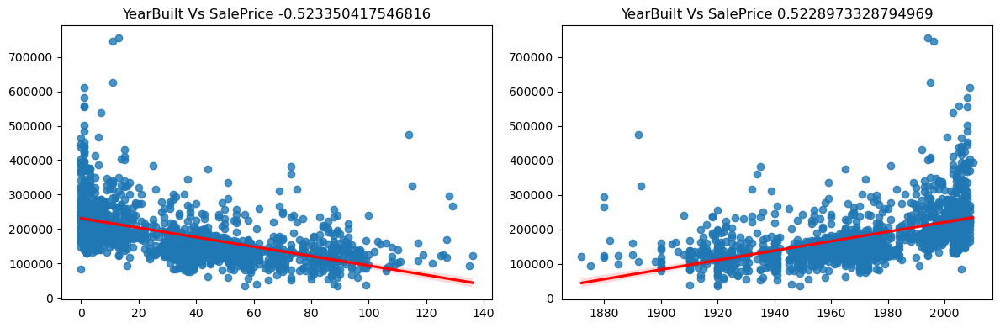

In [88]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4))

sns.regplot(x=Age_of_house, y='SalePrice', data=df, ax=ax[0], line_kws={'color': 'red'})
sns.regplot(x='YearBuilt', y='SalePrice', data=df, ax=ax[1], line_kws={'color': 'red'})

YrBui_corr_wi_sal = df['YearBuilt'].corr(df['SalePrice'])
age_corr_wi_sal = Age_of_house.corr(df['SalePrice'])

# Set titles and labels
ax[0].set_title(f"YearBuilt Vs SalePrice {age_corr_wi_sal}")
ax[0].set_xlabel('')
ax[0].set_ylabel('')

ax[1].set_title(f"YearBuilt Vs SalePrice {YrBui_corr_wi_sal}")
ax[1].set_xlabel('')
ax[1].set_ylabel('')

plt.tight_layout()
plt.show()

#### YearBuilt conclusions:
- There are 0 null values and feature is negatively skewed and there are outliers
- More recent the house is built more the sale price of it would be
- The house price decreases as the age of house increases, poeple want to buy newly built houses

## 66. YearRemodAdd
- This column represents the year when the house was remodeled or renovated. It provides information about the last time renovations were made to the property.

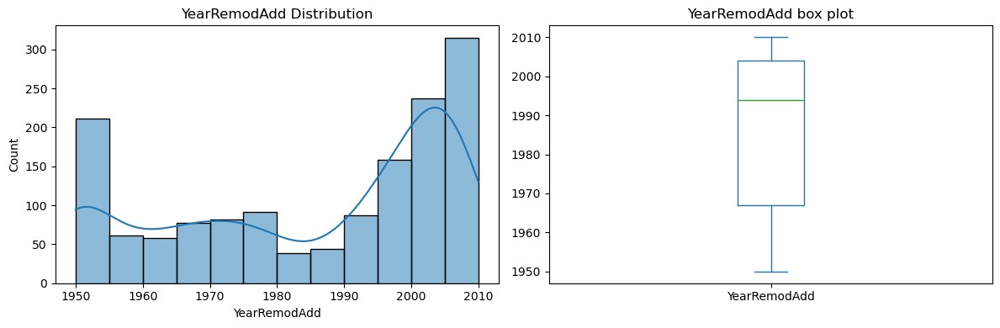

Null values in column are:    0
Skewness value is:    -0.5035620027004709


In [89]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4))

sns.histplot(data=df, x='YearRemodAdd',ax=ax[0],kde=True)
df['YearRemodAdd'].plot(kind='box',ax=ax[1])
# Set titles and labels
ax[0].set_title('YearRemodAdd Distribution')
ax[1].set_title('YearRemodAdd box plot')
ax[1].set_xlabel('')

plt.tight_layout()
plt.show()
print(f"Null values in column are:    {df['YearRemodAdd'].isnull().sum()}")
print(f"Skewness value is:    {df['YearRemodAdd'].skew()}")

In [90]:
# Subtract year sold col by year modified col to get the difference
# Difference is time went by after doing modification
Age_of_house_modify = df['YrSold'] - df['YearRemodAdd']

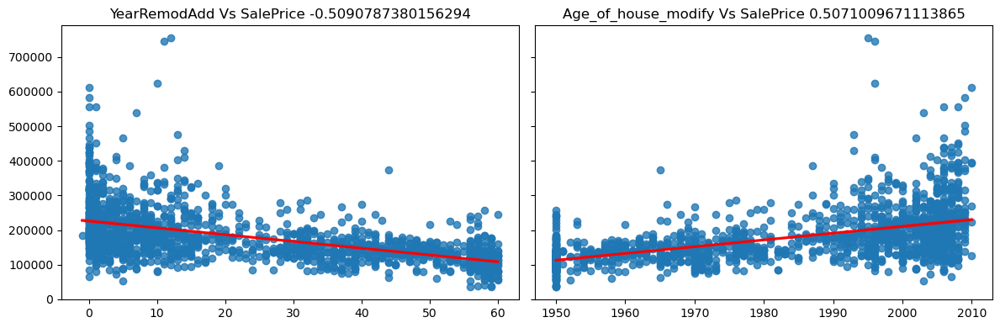

In [91]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4),sharey=True)
sns.regplot(x=Age_of_house_modify, y='SalePrice', data=df, ax=ax[0], line_kws={'color': 'red'})
sns.regplot(x='YearRemodAdd', y='SalePrice', data=df, ax=ax[1], line_kws={'color': 'red'})

YrMod_corr_wi_sal = df['YearRemodAdd'].corr(df['SalePrice'])
age_mod_corr_wi_sal = Age_of_house_modify.corr(df['SalePrice'])

# Set titles and labels
ax[0].set_title(f"YearRemodAdd Vs SalePrice {age_mod_corr_wi_sal}")
ax[0].set_xlabel('')
ax[0].set_ylabel('')
ax[1].set_title(f"Age_of_house_modify Vs SalePrice {YrMod_corr_wi_sal}")
ax[1].set_xlabel('')
ax[1].set_ylabel('')

plt.tight_layout()
plt.show()

#### YearRemodAdd conclusions:
- There are 0 null values and feature is negatively skewed and there are no outliers
- The recent the house is modified greater the house price would be, as modification age increases price seems to decrease

## 67. MasVnrArea
-  It represents the masonry veneer area in square feet. This feature indicates the amount of masonry work done on the exterior of the house.

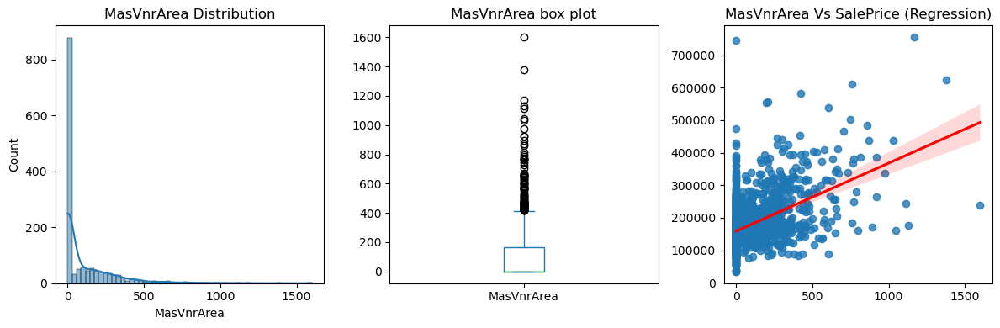

Null values in column are:    8
Skewness value is:    2.669084210182863
Correlation between Features: 0.47749304709571594


In [92]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))
sns.histplot(data=df, x='MasVnrArea',ax=ax[0],kde=True)
df['MasVnrArea'].plot(kind='box',ax=ax[1])
sns.regplot(x='MasVnrArea', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})
# Set titles and labels
ax[0].set_title('MasVnrArea Distribution')
ax[1].set_title('MasVnrArea box plot')
ax[1].set_xlabel('')
ax[2].set_title('MasVnrArea Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')
plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['MasVnrArea'].isnull().sum()}")
print(f"Skewness value is:    {df['MasVnrArea'].skew()}")
correlation = df['MasVnrArea'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### MasVnrArea conclusions:
- There are 8 null values replcae them with median because feature is positively skewed and there are outliers
- Most houses have around 0 to 500 square feet of masonayr work done on their exteriors

## 68. BsmtFinSF1
- This column denotes the type 1 finished square feet of the basement area. It provides information about the size of the finished basement area.

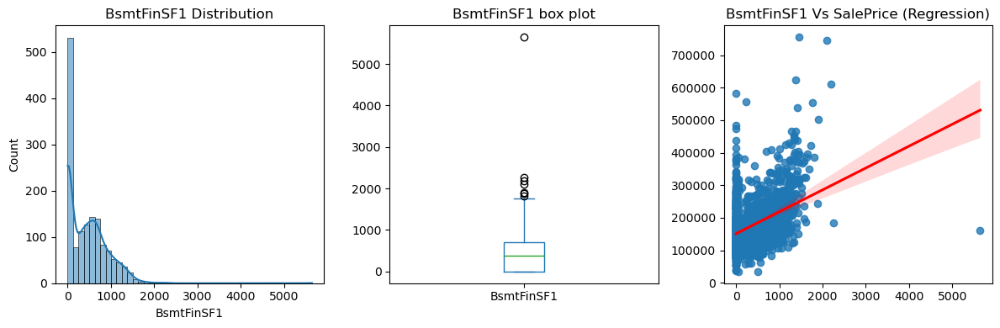

Null values in column are:    0
Skewness value is:    1.685503071910789
Correlation between Features: 0.38641980624215316


In [93]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='BsmtFinSF1',ax=ax[0],kde=True)
df['BsmtFinSF1'].plot(kind='box',ax=ax[1])
sns.regplot(x='BsmtFinSF1', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('BsmtFinSF1 Distribution')

ax[1].set_title('BsmtFinSF1 box plot')
ax[1].set_xlabel('')

ax[2].set_title('BsmtFinSF1 Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['BsmtFinSF1'].isnull().sum()}")
print(f"Skewness value is:    {df['BsmtFinSF1'].skew()}")
correlation = df['BsmtFinSF1'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### BsmtFinSF1 conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- Most houses have around 0 to 200 square feet of finished basement area
- Houses with 0 square feet of type 1 finished basment area have higher sale price, but after it as square feet area of finished area increases sale price seems to increase 

## 69. BsmtFinSF2
-  It represents the type 2 finished square feet of the basement area. This feature provides information about an additional finished basement area, if present.

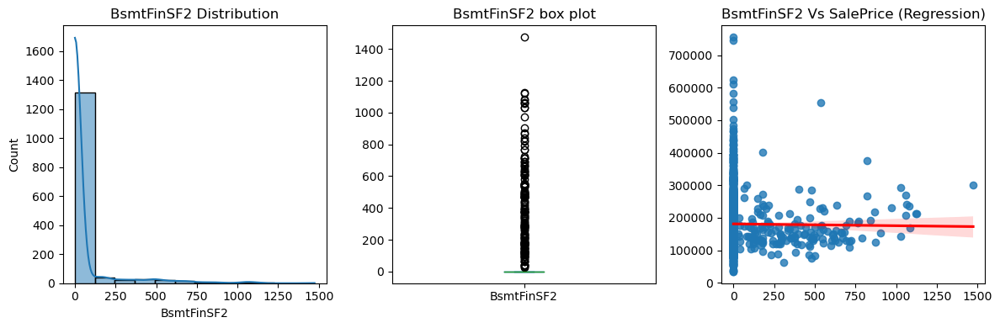

Null values in column are:    0
Skewness value is:    4.255261108933303
Correlation between Features: -0.011378121450215136


In [94]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='BsmtFinSF2',ax=ax[0],kde=True)
df['BsmtFinSF2'].plot(kind='box',ax=ax[1])
sns.regplot(x='BsmtFinSF2', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('BsmtFinSF2 Distribution')

ax[1].set_title('BsmtFinSF2 box plot')
ax[1].set_xlabel('')

ax[2].set_title('BsmtFinSF2 Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['BsmtFinSF2'].isnull().sum()}")
print(f"Skewness value is:    {df['BsmtFinSF2'].skew()}")
correlation = df['BsmtFinSF2'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### BsmtFinSF2 conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- Houses with 0 square feet of type 2 finished basment area have higher sale price, but after it as square feet area of finished area increases sale price seems to decrease 

## 70. BsmtUnfSF
- This column represents the unfinished square feet of the basement area. It provides information about the size of the unfinished basement area.

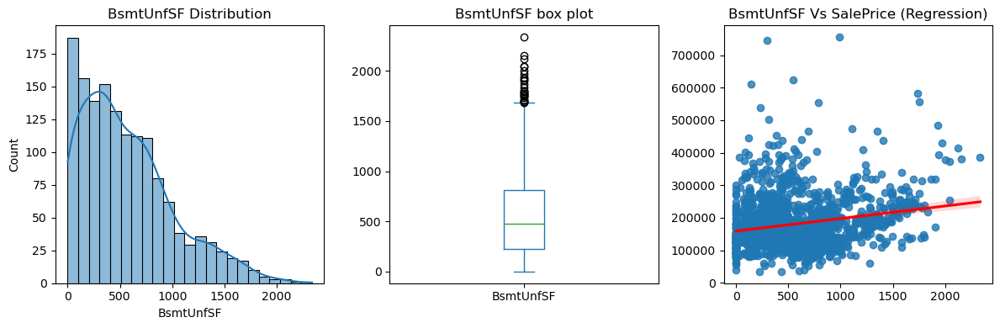

Null values in column are:    0
Skewness value is:    0.9202684528039037
Correlation between Features: 0.21447910554696892


In [95]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='BsmtUnfSF',ax=ax[0],kde=True)
df['BsmtUnfSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='BsmtUnfSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('BsmtUnfSF Distribution')

ax[1].set_title('BsmtUnfSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('BsmtUnfSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['BsmtUnfSF'].isnull().sum()}")
print(f"Skewness value is:    {df['BsmtUnfSF'].skew()}")
correlation = df['BsmtUnfSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### BsmtUnfSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- As the total square feet area of unfinished basement area of house increases sale price also increases by small degree

## 71. TotalBsmtSF
 - It denotes the total area of the basement in square feet. This feature combines the finished and unfinished areas of the basement.

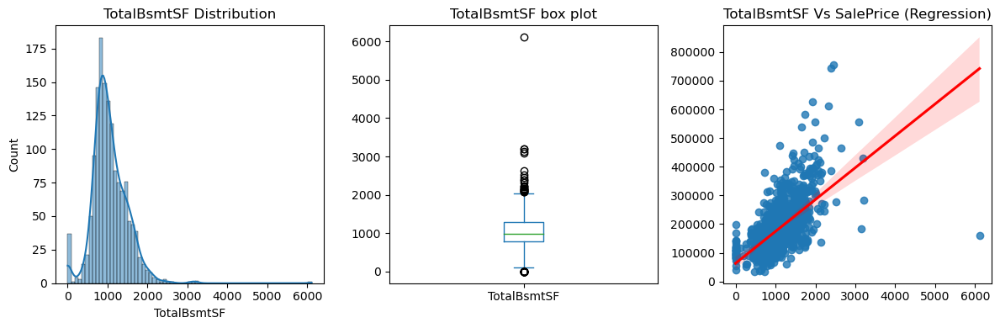

Null values in column are:    0
Skewness value is:    1.5242545490627664
Correlation between Features: 0.6135805515591954


In [96]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='TotalBsmtSF',ax=ax[0],kde=True)
df['TotalBsmtSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='TotalBsmtSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('TotalBsmtSF Distribution')

ax[1].set_title('TotalBsmtSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('TotalBsmtSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['TotalBsmtSF'].isnull().sum()}")
print(f"Skewness value is:    {df['TotalBsmtSF'].skew()}")
correlation = df['TotalBsmtSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### TotalBsmtSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- As the total squre feet area of basement of house increases sale price also increases

## 72. 1stFlrSF
-  This column represents the total area of the first floor in square feet.

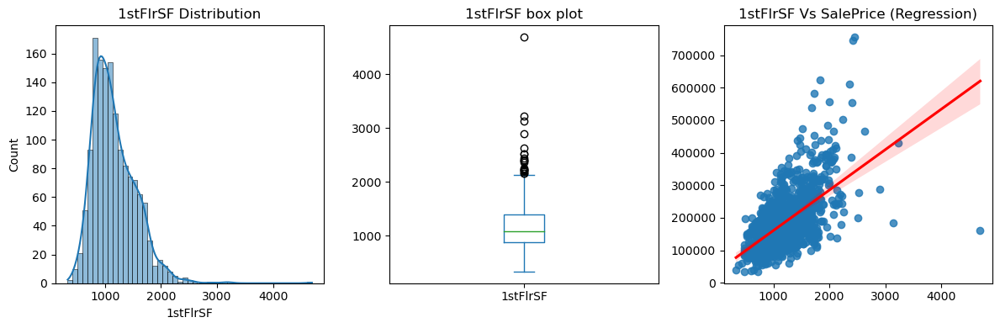

Null values in column are:    0
Skewness value is:    1.3767566220336365
Correlation between Features: 0.6058521846919148


In [97]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='1stFlrSF',ax=ax[0],kde=True)
df['1stFlrSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='1stFlrSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('1stFlrSF Distribution')

ax[1].set_title('1stFlrSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('1stFlrSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['1stFlrSF'].isnull().sum()}")
print(f"Skewness value is:    {df['1stFlrSF'].skew()}")
correlation = df['1stFlrSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### 1stFlrSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- As the total squre feet area of 1st floor of house increases sale price also increases

## 73. 2ndFlrSF
-  It denotes the total area of the second floor in square feet.

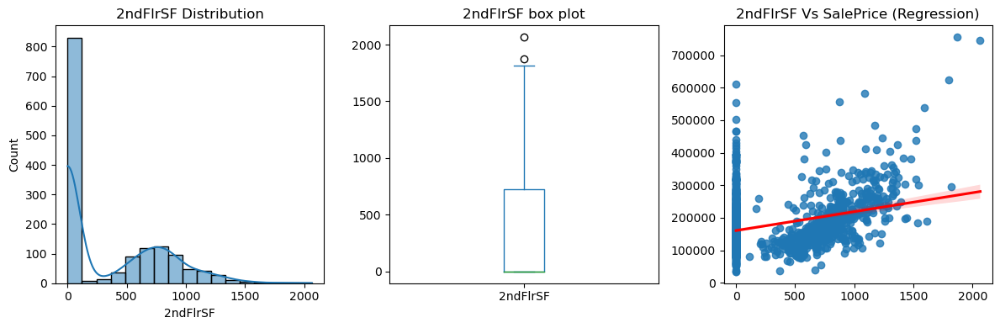

Null values in column are:    0
Skewness value is:    0.8130298163023265
Correlation between Features: 0.31933380283206764


In [98]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='2ndFlrSF',ax=ax[0],kde=True)
df['2ndFlrSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='2ndFlrSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('2ndFlrSF Distribution')

ax[1].set_title('2ndFlrSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('2ndFlrSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['2ndFlrSF'].isnull().sum()}")
print(f"Skewness value is:    {df['2ndFlrSF'].skew()}")
correlation = df['2ndFlrSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### 2ndFlrSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- After 0 square feet area, as the total square feet area of 2nd floor of house increases sale price also increases

## 74. GrLivArea
- This column represents the total area of the above-grade (ground) living space in square feet.

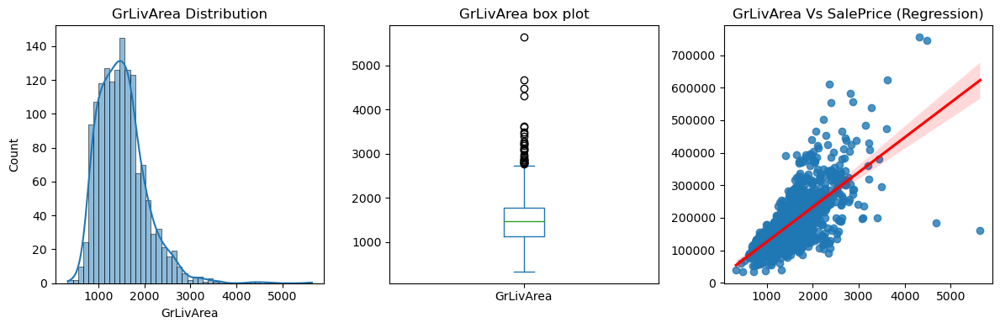

Null values in column are:    0
Skewness value is:    1.3665603560164552
Correlation between Features: 0.7086244776126522


In [99]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='GrLivArea',ax=ax[0],kde=True)
df['GrLivArea'].plot(kind='box',ax=ax[1])
sns.regplot(x='GrLivArea', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('GrLivArea Distribution')

ax[1].set_title('GrLivArea box plot')
ax[1].set_xlabel('')

ax[2].set_title('GrLivArea Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['GrLivArea'].isnull().sum()}")
print(f"Skewness value is:    {df['GrLivArea'].skew()}")
correlation = df['GrLivArea'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### GrLivArea conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- As  total square feet area of living space of house increases sale price also increases by large degree

## 75. GarageYrBlt
-  It represents the year when the garage was built. It indicates the age of the garage.

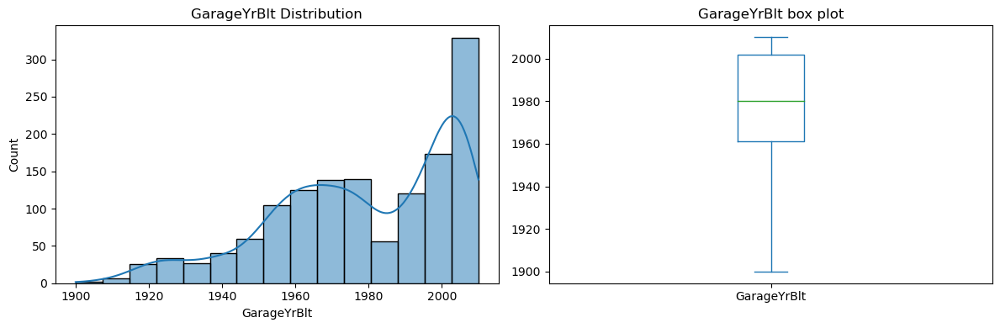

Null values in column are:    81
Skewness value is:    -0.6494146238714679


In [100]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4))

sns.histplot(data=df, x='GarageYrBlt',ax=ax[0],kde=True)
df['GarageYrBlt'].plot(kind='box',ax=ax[1])
# Set titles and labels
ax[0].set_title('GarageYrBlt Distribution')
ax[1].set_title('GarageYrBlt box plot')
ax[1].set_xlabel('')
plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['GarageYrBlt'].isnull().sum()}")
print(f"Skewness value is:    {df['GarageYrBlt'].skew()}")

In [101]:
Age_of_garage_bui = df["YrSold"] - df["GarageYrBlt"]

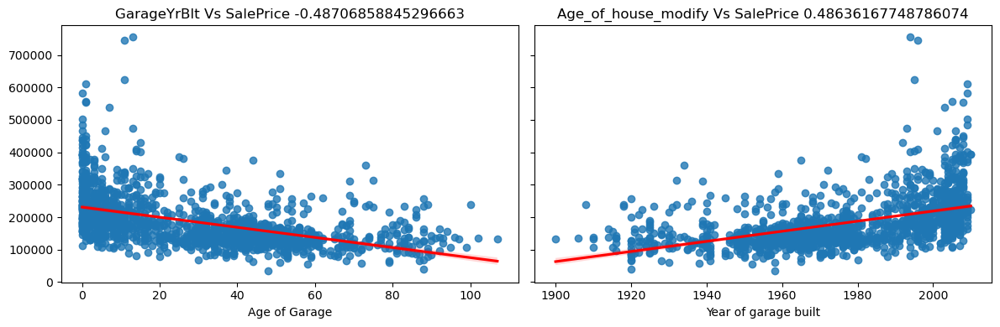

In [102]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4),sharey=True)
sns.regplot(x=Age_of_garage_bui, y='SalePrice', data=df, ax=ax[0], line_kws={'color': 'red'})
sns.regplot(x='GarageYrBlt', y='SalePrice', data=df, ax=ax[1], line_kws={'color': 'red'})

GarYr_corr_wi_sal = df['GarageYrBlt'].corr(df['SalePrice'])
Gar_age_corr_wi_sal = Age_of_garage_bui.corr(df['SalePrice'])

# Set titles and labels
ax[0].set_title(f"GarageYrBlt Vs SalePrice {Gar_age_corr_wi_sal}")
ax[0].set_xlabel('Age of Garage')
ax[0].set_ylabel('')
ax[1].set_title(f"Age_of_house_modify Vs SalePrice {GarYr_corr_wi_sal}")
ax[1].set_xlabel('Year of garage built')
ax[1].set_ylabel('')

plt.tight_layout()
plt.show()

#### GarageYrBlt conclusions:
- There are 81 null values replcae them with median of data because feature is negatively skewed and there are no outliers
- As age of Garage increases house sale price seems to increase

## 76. GarageArea
- This column denotes the size of the garage in square feet. It provides information about the area available for parking or storage.

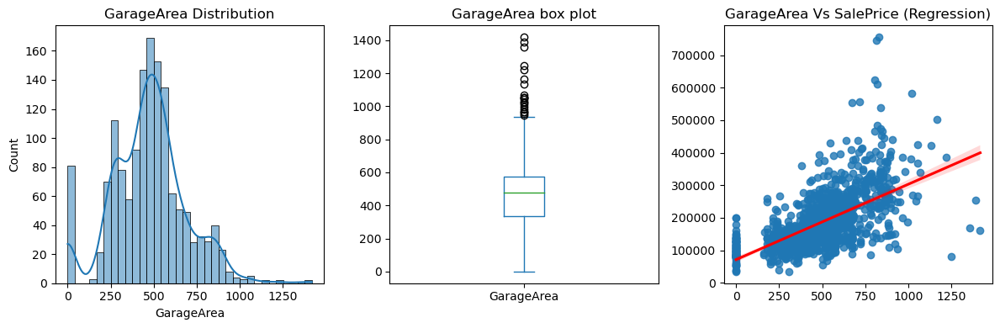

Null values in column are:    0
Skewness value is:    0.17998090674623907
Correlation between Features: 0.6234314389183617


In [103]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='GarageArea',ax=ax[0],kde=True)
df['GarageArea'].plot(kind='box',ax=ax[1])
sns.regplot(x='GarageArea', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('GarageArea Distribution')

ax[1].set_title('GarageArea box plot')
ax[1].set_xlabel('')

ax[2].set_title('GarageArea Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['GarageArea'].isnull().sum()}")
print(f"Skewness value is:    {df['GarageArea'].skew()}")
correlation = df['GarageArea'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### GarageArea conclusions:
- There are o null values and feature is approximately normal and there are outliers
- As garage area increases house sale price seems to increase

## 77. WoodDeckSF
-  It represents the area of wood deck in square feet. This feature provides information about the size of the outdoor wood deck.

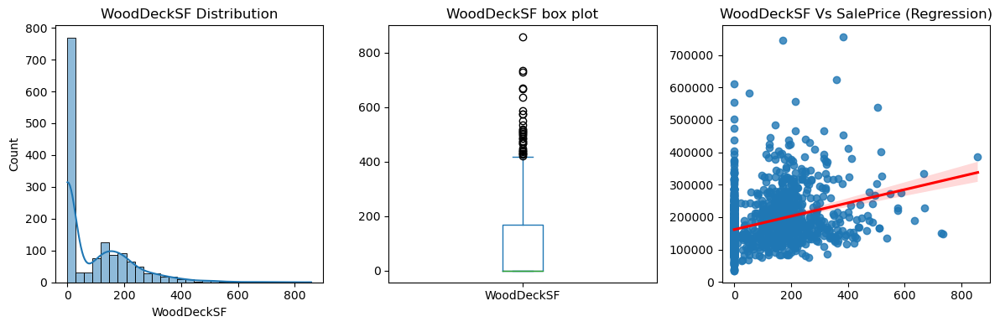

Null values in column are:    0
Skewness value is:    1.5413757571931312
Correlation between Features: 0.3244134445681295


In [104]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='WoodDeckSF',ax=ax[0],kde=True)
df['WoodDeckSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='WoodDeckSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('WoodDeckSF Distribution')

ax[1].set_title('WoodDeckSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('WoodDeckSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['WoodDeckSF'].isnull().sum()}")
print(f"Skewness value is:    {df['WoodDeckSF'].skew()}")
correlation = df['WoodDeckSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### WoodDeckSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- Houses with wooddesk area wround 180 to 500 squre feet have high sale price

## 78. OpenPorchSF
- This column represents the area of open porch in square feet. It provides information about the size of the outdoor open porch area.

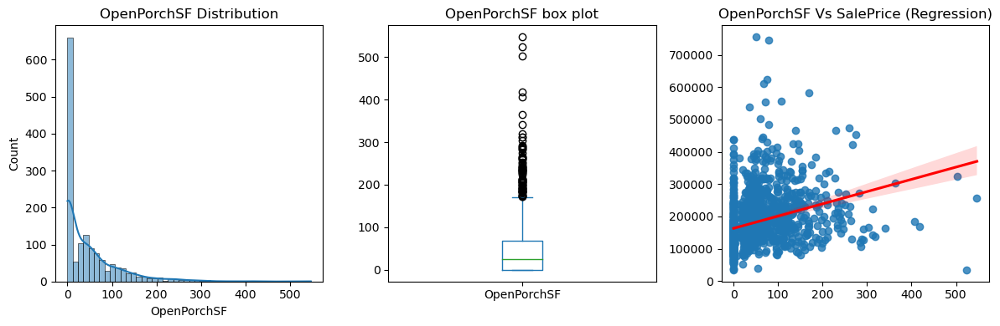

Null values in column are:    0
Skewness value is:    2.3643417403694404
Correlation between Features: 0.31585622711605543


In [105]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='OpenPorchSF',ax=ax[0],kde=True)
df['OpenPorchSF'].plot(kind='box',ax=ax[1])
sns.regplot(x='OpenPorchSF', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('OpenPorchSF Distribution')

ax[1].set_title('OpenPorchSF box plot')
ax[1].set_xlabel('')

ax[2].set_title('OpenPorchSF Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['OpenPorchSF'].isnull().sum()}")
print(f"Skewness value is:    {df['OpenPorchSF'].skew()}")
correlation = df['OpenPorchSF'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### OpenPorchSF conclusions:
- There are 0 null values and feature is positively skewed and there are outliers
- As area of open porch in square feet of house increases it's sale price increases

## 79. EnclosedPorch
-  It denotes the area of enclosed porch in square feet. This feature provides information about the size of the enclosed porch area.

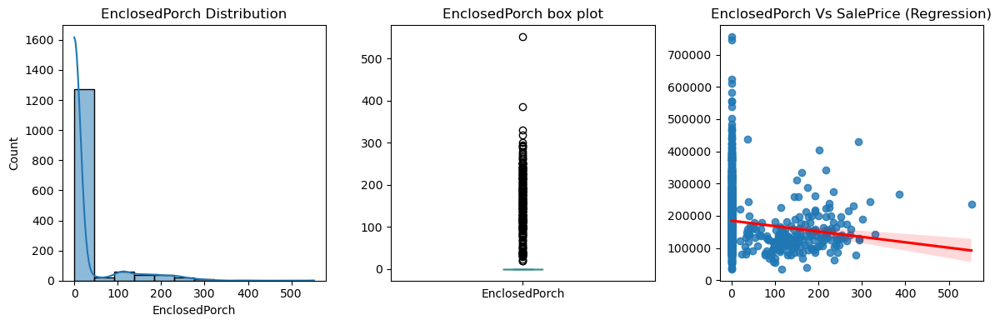

Null values in column are:    0
Skewness value is:    3.08987190371177
Correlation between Features: -0.1285779579259565


In [106]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='EnclosedPorch',ax=ax[0],kde=True)
df['EnclosedPorch'].plot(kind='box',ax=ax[1])
sns.regplot(x='EnclosedPorch', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('EnclosedPorch Distribution')

ax[1].set_title('EnclosedPorch box plot')
ax[1].set_xlabel('')

ax[2].set_title('EnclosedPorch Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['EnclosedPorch'].isnull().sum()}")
print(f"Skewness value is:    {df['EnclosedPorch'].skew()}")
correlation = df['EnclosedPorch'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### EnclosedPorch conclusions:
- There are 0 null values and feature is positively skewed and There are outliers
- As area of enclosed porch in square feet of house increases it's sale price decreases

## 80.ScreenPorch
- This column represents the area of screen porch in square feet. It provides information about the size of the screen porch area.

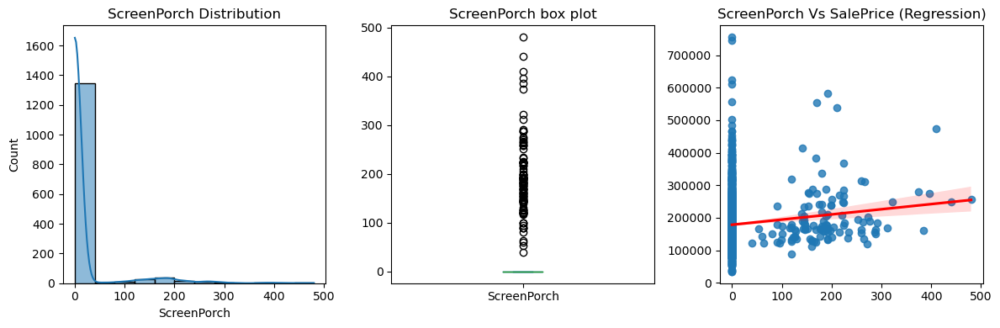

Null values in column are:    0
Skewness value is:    4.122213743143115
Correlation between Features: 0.1114465711429111


In [107]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='ScreenPorch',ax=ax[0],kde=True)
df['ScreenPorch'].plot(kind='box',ax=ax[1])
sns.regplot(x='ScreenPorch', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('ScreenPorch Distribution')

ax[1].set_title('ScreenPorch box plot')
ax[1].set_xlabel('')

ax[2].set_title('ScreenPorch Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['ScreenPorch'].isnull().sum()}")
print(f"Skewness value is:    {df['ScreenPorch'].skew()}")
correlation = df['ScreenPorch'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### ScreenPorch conclusions:
- There are 0 null values and feature is positively skewed. There are outliers
- Most houses have screen porch area of 0 square feet

## 81. SalePrice
-  It represents the sale price of the house in dollars. This is the target variable that we typically try to predict or analyze in a housing price dataset.

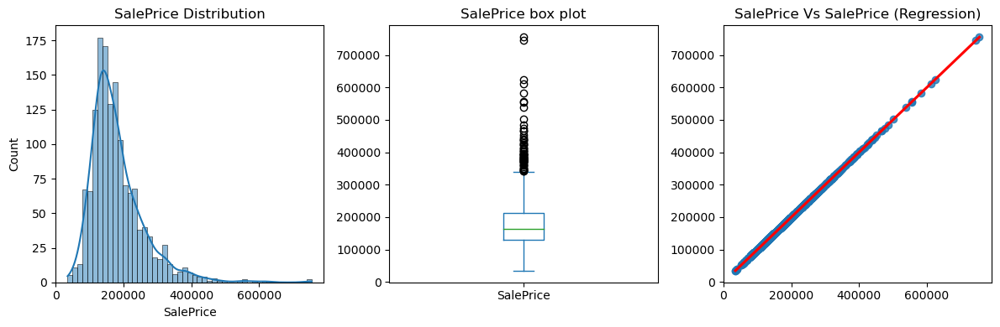

Null values in column are:    0
Skewness value is:    1.8828757597682129
Correlation between Features: 1.0


In [108]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))

sns.histplot(data=df, x='SalePrice',ax=ax[0],kde=True)
df['SalePrice'].plot(kind='box',ax=ax[1])
sns.regplot(x='SalePrice', y='SalePrice', data=df, ax=ax[2], line_kws={'color': 'red'})

# Set titles and labels
ax[0].set_title('SalePrice Distribution')

ax[1].set_title('SalePrice box plot')
ax[1].set_xlabel('')

ax[2].set_title('SalePrice Vs SalePrice (Regression)')
ax[2].set_xlabel('')
ax[2].set_ylabel('')

plt.tight_layout()
plt.show()

print(f"Null values in column are:    {df['SalePrice'].isnull().sum()}")
print(f"Skewness value is:    {df['SalePrice'].skew()}")
correlation = df['SalePrice'].corr(df['SalePrice'])
print("Correlation between Features:", correlation)

#### SalePrice conclusions:
- There are 0 null values and feature is positively skewed and there are outliers

# Data Analysis Report:

## Insights from Discrete and Categorical  features:

#### When it comes to real estate, certain properties tend to have higher median sale prices than others. The following are some common characteristics or factors that are often associated with houses that have high median sale prices:

1. Houses built on FV (Floating Village Residential) zone.
2. Houses having paved Type of road access to the property and Paved alley access.
3. Houses with all public utilities available (water, electricity, gas, and sewer).
4. Houses with HLS: Hillside - Significant slope.
5. Houses in NridgHT neighborhood and within RRNn: Within 200 feet of a railroad.
6. Houses built within PosA: Near positive off-site feature (park, greenbelt, etc.).
7. Houses with shed roof type.
8. Houses built with WdShngl: Wood Shingles.
9. Houses built with excellent exterior material.
10. Houses with TA (Average) exterior material at present.
11. Houses with PConc: Poured Concrete foundation.
12. Houses with TA: Average/Typical (80-89 inches) quality basement and GD (Good) basement condition.
13. Houses with Gd: Good exposure to Walkout or garden level basement and with GLQ: Good Living Quarters.
14. Houses with GasA: Gas forced warm air furnace.
15. Houses with excellent heating quality and condition.
16. Houses with central air conditioning.
17. Houses with SBrkr: Standard Circuit Breakers & Romex.
18. Houses with EX (Excellent) quality of kitchen.
19. Houses with 2 fireplaces.
20. Houses with BuiltIn: Built-In (Garage part of the house) and with FIN(Finished) interior finish of the garage.
21. Houses with GD (Good) quality garage and with GD (Good) garage quality condition.
22. Houses with paved driveway.
23. Houses with EX (Excellent) pool quality.
24. Garages that can accommodate 3 cars.
25. Houses with TenC: Tennis Court.
26. Houses with Con: Contract 15% Down payment regular terms of sale type.
27. Houses with Partial: Home was not completed when last assessed (associated with New Homes).
28. Houses with 60: 2-STORY 1946 & NEWER building class.
29. Houses with 10 ratings for Overall material and finish quality of the house.
30. Houses with 5 ratings for Overall condition rating of the house.
31. Houses with 572 square feet.
32. Houses with 2 full bathrooms in basement.
33. Houses with 3 full bathrooms above ground level.
34. Houses with 0 number of bedrooms above ground level, and with 1  of kitchen above ground level.
35. Houses with 11 total number of rooms (excluding bathrooms) above ground level.
36. Houses with 2 fireplaces.

### Insights from Continous numerical features:


1. As LotFrontage square feet area increases, the house price seems to increase.
2. Most houses have LotArea around 0 to 3000 square feet.
3. The more recent the house is built, the higher the sale price tends to be. The price of a house decreases as its age increases since people prefer to buy newly built houses.
4. The more recent the house is modified, the higher the house price would be. As the age of modifications increases, the price seems to decrease.
5. Most houses have around 0 to 500 square feet of masonry work done on their exteriors.
6. Most houses have around 0 to 200 square feet of finished basement area.
7. Houses with 0 square feet of type 1 finished basement area have a higher sale price. However, as the square footage of the finished area increases, the sale price seems to increase.
8. Houses with 0 square feet of type 2 finished basement area have a higher sale price. However, as the square footage of the finished area increases, the sale price seems to decrease.
9. As the total square footage area of the unfinished basement area of a house increases, the sale price also increases by a small degree.
10. As the total square footage area of the basement of a house increases, the sale price also increases.
11. As the total square footage area of the 1st floor of a house increases, the sale price also increases.
12. After 0 square feet area, as the total square footage area of the 2nd floor of a house increases, the sale price also increases.
13. As the total square footage area of the living space of a house increases, the sale price also increases by a large degree.
14. As the age of the garage increases, the house sale price seems to increase.
15. As the garage area increases, the house sale price seems to increase.
16. As the area of the open porch in square feet of a house increases, its sale price also increases.
17. As the area of the enclosed porch in square feet of a house increases, its sale price decreases.
18. Most houses have a screen porch area of 0 square feet.

## Problem statement

#### We need to build model to predict home price based on instances of features.

## Importing libraries, modules and classes to work with data

In [109]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.special as special

# To supress convergence warnings
from sklearn.exceptions import ConvergenceWarning
import warnings

#### Importing train  data set

In [110]:
tr_df = pd.read_csv('train.csv')
print(tr_df.shape)
print("=======================================================================================================================")
tr_df.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


#### Importing test data set

In [111]:
test_df = pd.read_csv('test.csv')
print(test_df.shape)
print("=======================================================================================================================")
test_df.head()

(1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


#### Concatenate both train_df, and test_df data sets to form a new data set

- The train data set contains training samples, it has 80 independent features and 1 target feature (SalePrice).
- The test data set contains testing samples, it has 80 independent features.
- We need to concatenate both dataframes to form a new data frame.

In [112]:
# To see all columns of data frame
pd.set_option('display.max_columns', None)

In [113]:
# The ignore_index=True parameter ensures that the resulting DataFrame has a new continuous index,
# ignoring the original indices of the train and test data.

concatenated_data = pd.concat([tr_df, test_df], ignore_index=True)
print(concatenated_data.shape)
print("=======================================================================================================================")
concatenated_data.head()

(2919, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


#### From above data set we can see that some 1459 rows in Salesprice column contains null values, because those rows belong to test data set.

## Basic checks for train data:

In [114]:
# To see all rows of data frame
pd.set_option('display.max_rows', None)

#### We have 43 categorical columns

In [115]:
# We can also use this code:
# cat_cols = df.select_dtypes(include=['object', 'category']).columns
tr_cat_cols = []

for i in tr_df.columns:
    if tr_df.loc[:,i].dtype == 'object' or tr_df.loc[:,i].dtype == 'category':
        tr_cat_cols.append(i)

print(len(tr_cat_cols))
print("====================================================================================================")
print(tr_cat_cols)

43
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


#### We have total 38  numerical columns

In [116]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns
tr_num_cols = []

for i in tr_df.columns:
    if (tr_df.loc[:,i].dtype == 'int8' or tr_df.loc[:,i].dtype == 'int16' or tr_df.loc[:,i].dtype == 'int32'
    or tr_df.loc[:,i].dtype == 'int64' or tr_df.loc[:,i].dtype == 'float8' or tr_df.loc[:,i].dtype == 'float16'
    or tr_df.loc[:,i].dtype == 'float32' or tr_df.loc[:,i].dtype == 'float64'):
       tr_num_cols.append(i)

print(len(tr_num_cols))
print("====================================================================================================")
print(tr_num_cols)

38
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


#### Numerical features can be further categorised as Discrete and Continous features.
- Discrete columns: How to decide which numerical column is discrete and continous? it depends upon you. If you decide to select the column as discrete if it has less than 50 unique class then you can do that.

### Discrete numerical columns

#### Out of 38 numerical columns 18 of them contain less than or equals to 25 unique values, it means you can convert these columns from data type int to object or most preferably category type.

#### I want to select only those columns as Discrete columns if they have less than or equals to 10 unique values (classes)

In [117]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns

tr_dis_num_cols = []

for i in tr_df.columns:
    if tr_df[i].nunique() < 26 and (tr_df.loc[:,i].dtype == 'int8' or tr_df.loc[:,i].dtype == 'int16' or tr_df.loc[:,i].dtype == 'int32'
    or tr_df.loc[:,i].dtype == 'int64' or tr_df.loc[:,i].dtype == 'float8' or tr_df.loc[:,i].dtype == 'float16'
    or tr_df.loc[:,i].dtype == 'float32' or tr_df.loc[:,i].dtype == 'float64'):
        tr_dis_num_cols.append(i)

print(len(tr_dis_num_cols))
print("====================================================================================================")
print(tr_dis_num_cols)

18
['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


###  Continous numerical columns

In [118]:
# Gets suus only those numerical columsn whose unique values are greater than 2
tr_cont_num_cols = []

for i in tr_df.columns:
    if tr_df[i].nunique() > 25 and (tr_df.loc[:,i].dtype == 'int8' or tr_df.loc[:,i].dtype == 'int16' or tr_df.loc[:,i].dtype == 'int32'
    or tr_df.loc[:,i].dtype == 'int64' or tr_df.loc[:,i].dtype == 'float8' or tr_df.loc[:,i].dtype == 'float16'
    or tr_df.loc[:,i].dtype == 'float32' or tr_df.loc[:,i].dtype == 'float64'):
        tr_cont_num_cols.append(i)

print(len(tr_cont_num_cols))
print("====================================================================================================")
print(tr_cont_num_cols)

20
['Id', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


In [119]:
# code to check no of unique values in a column and list them
num_list = [] # Generate a list of numbers from 1 to n features, for ex here 1 to 40
num = 0

cols_desc = [] # an empty list
for i in tr_df.columns: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, tr_df[i].dtypes,tr_df[i].isna().sum(), round((tr_df[i].isna().sum() / len(tr_df)) * 100,2),tr_df[i].nunique(),
     tr_df[i].unique()])
    
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','Null','Null_%','no_of_uni_val','Uni_val_list'])

desc

,Data_Features,dtype,Null,Null_%,no_of_uni_val,Uni_val_list
1,Id,int64,0,0.00,1460,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
2,MSSubClass,int64,0,0.00,15,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,..."
3,MSZoning,object,0,0.00,5,"[RL, RM, C (all), FV, RH]"
4,LotFrontage,float64,259,17.74,110,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan..."
5,LotArea,int64,0,0.00,1073,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,..."
6,Street,object,0,0.00,2,"[Pave, Grvl]"
7,Alley,object,1369,93.77,2,"[nan, Grvl, Pave]"
8,LotShape,object,0,0.00,4,"[Reg, IR1, IR2, IR3]"
9,LandContour,object,0,0.00,4,"[Lvl, Bnk, Low, HLS]"
10,Utilities,object,0,0.00,2,"[AllPub, NoSeWa]"


## Basic checks for test data:

#### We have 43 categorical columns

In [120]:
# We can also use this code:
# cat_cols = df.select_dtypes(include=['object', 'category']).columns
test_cat_cols = []

for i in test_df.columns:
    if test_df.loc[:,i].dtype == 'object' or test_df.loc[:,i].dtype == 'category':
        test_cat_cols.append(i)

print(len(test_cat_cols))
print("====================================================================================================")
print(test_cat_cols)

43
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


#### We have total 37  numerical columns

In [121]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns
test_num_cols = []

for i in test_df.columns:
    if (test_df.loc[:,i].dtype == 'int8' or test_df.loc[:,i].dtype == 'int16' or test_df.loc[:,i].dtype == 'int32'
    or test_df.loc[:,i].dtype == 'int64' or test_df.loc[:,i].dtype == 'float8' or test_df.loc[:,i].dtype == 'float16'
    or test_df.loc[:,i].dtype == 'float32' or test_df.loc[:,i].dtype == 'float64'):
       test_num_cols.append(i)

print(len(test_num_cols))
print("====================================================================================================")
print(test_num_cols)

37
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


#### Numerical features can be further categorised as Discrete and Continous features.
- Discrete columns: How to decide which numerical column is discrete and continous? it depends upon you. If you decide to select the column as discrete if it has less than 50 unique class then you can do that.

### Discrete numerical columns

#### Out of 37 numerical columns 17 of them contain less than or equals to 25 unique values, it means you can convert these columns from data type int to object or most preferably category type.

#### I want to select only those columns as Discrete columns if they have less than or equals to 10 unique values (classes)

In [122]:
# We can also use this code:
# num_cols = df.select_dtypes(include=['int', 'float']).columns

test_dis_num_cols = []

for i in test_df.columns:
    if test_df[i].nunique() < 26 and (test_df.loc[:,i].dtype == 'int8' or test_df.loc[:,i].dtype == 'int16' or test_df.loc[:,i].dtype == 'int32'
    or test_df.loc[:,i].dtype == 'int64' or test_df.loc[:,i].dtype == 'float8' or test_df.loc[:,i].dtype == 'float16'
    or test_df.loc[:,i].dtype == 'float32' or test_df.loc[:,i].dtype == 'float64'):
        test_dis_num_cols.append(i)

print(len(test_dis_num_cols))
print("====================================================================================================")
print(test_dis_num_cols)

17
['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MoSold', 'YrSold']


###  Continous numerical columns

In [123]:
# Gets suus only those numerical columsn whose unique values are greater than 2
test_cont_num_cols = []

for i in test_df.columns:
    if test_df[i].nunique() > 25 and (test_df.loc[:,i].dtype == 'int8' or test_df.loc[:,i].dtype == 'int16' or test_df.loc[:,i].dtype == 'int32'
    or test_df.loc[:,i].dtype == 'int64' or test_df.loc[:,i].dtype == 'float8' or test_df.loc[:,i].dtype == 'float16'
    or test_df.loc[:,i].dtype == 'float32' or test_df.loc[:,i].dtype == 'float64'):
        test_cont_num_cols.append(i)

print(len(test_cont_num_cols))
print("====================================================================================================")
print(test_cont_num_cols)

20
['Id', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MiscVal']


## Basic checks for entire data (both train and test data)

### NOTE:
- The concatenated_data is merged original form of both train and test data sets, these data sets aren't aletered till now.
- Drop target column SalePrice, we will deal with it later

In [124]:
df = concatenated_data.copy()
print(df.shape)
print("==================================================================================================================")
df.head()

(2919, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


#### We have 43 categorical columns

In [125]:
cat_cols = []

for i in df.columns:
    if df.loc[:,i].dtype == 'object' or df.loc[:,i].dtype == 'category':
        cat_cols.append(i)
print(len(cat_cols))
print("====================================================================================================")
print(cat_cols)

43
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


#### We have total 38 numerical columns

In [126]:
num_cols = []
for i in df.columns:
    if (df.loc[:,i].dtype == 'int8' or df.loc[:,i].dtype == 'int16' or df.loc[:,i].dtype == 'int32'
    or df.loc[:,i].dtype == 'int64' or df.loc[:,i].dtype == 'float8' or df.loc[:,i].dtype == 'float16'
    or df.loc[:,i].dtype == 'float32' or df.loc[:,i].dtype == 'float64'):
       num_cols.append(i)
print(len(num_cols))
print("====================================================================================================")
print(num_cols)

38
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


# Data Cleaning:

##  Handling the missing values (For train data)

#### There are 19 columns with null values > 0

In [127]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
tr_null_cols = []

for column in tr_df.columns:
    if tr_df[column].isnull().sum() > 0:
        tr_null_cols.append(column)
print(len(tr_null_cols))
print("====================================================================================================")
print(tr_null_cols)

19
['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


### NOTE:
- The problem with this approach is some columns contain NA as meaningful value, but intepreter counts them NA as (null, meaningless values)
- For ex Alley column contains 3 different values(classes),<br><br>
Alley: Type of alley access to property<br><br>
       1. Grvl	Gravel<br><br>
       2. Pave	Paved<br><br>
       3. NA 	No alley access<br><br>
- one of them being NA value which means No alley access,which has meaning. It means there is no access to alley in the house
- It doesn't mean the data isn't entered.

#### look for those columns and replace NA value with something that isnull() function doesn't take into count.

## Impute NA value with constant value

In [128]:
# Impute using a constant value
# Replacing NA with different value for each column
na_repl = ['NO','NB','NB','NB','NB','NB','NF','NG','NG','NG','NG','NP','NF','NO']
i = 0
for column in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']:
    tr_df[column] = tr_df[column].fillna(na_repl[i])
    i+=1

In [129]:
# code to check NA value in column is replaced with constant value or not
num_list = [] 
num = 0
cols_desc = [] # an empty list
for i in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, tr_df[i].dtypes,tr_df[i].nunique(),
     tr_df[i].unique()])
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','no_of_uni_val','Uni_val_list'])
desc

,Data_Features,dtype,no_of_uni_val,Uni_val_list
1,Alley,object,3,"[NO, Grvl, Pave]"
2,BsmtQual,object,5,"[Gd, TA, Ex, NB, Fa]"
3,BsmtCond,object,5,"[TA, Gd, NB, Fa, Po]"
4,BsmtExposure,object,5,"[No, Gd, Mn, Av, NB]"
5,BsmtFinType1,object,7,"[GLQ, ALQ, Unf, Rec, BLQ, NB, LwQ]"
6,BsmtFinType2,object,7,"[Unf, BLQ, NB, ALQ, Rec, LwQ, GLQ]"
7,FireplaceQu,object,6,"[NF, TA, Gd, Fa, Ex, Po]"
8,GarageType,object,7,"[Attchd, Detchd, BuiltIn, CarPort, NG, Basment..."
9,GarageFinish,object,4,"[RFn, Unf, Fin, NG]"
10,GarageQual,object,6,"[TA, Fa, Gd, NG, Ex, Po]"


## There are still 5 columns with null values

In [130]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
tr_null_cols = []

for column in tr_df.columns:
    if tr_df[column].isnull().sum() > 0:
        tr_null_cols.append(column)
print(len(tr_null_cols))
print("====================================================================================================")
print(tr_null_cols)

5
['LotFrontage', 'MasVnrType', 'MasVnrArea', 'Electrical', 'GarageYrBlt']


### Categorical columns with null values

In [131]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
tr_null_cat_cols = []

for column in tr_df.columns:
    if tr_df[column].isnull().sum() > 0 and (tr_df.loc[:,column].dtype == 'object' or tr_df.loc[:,i].dtype == 'category'):
        tr_null_cat_cols.append(column)
print(len(tr_null_cat_cols))
print("====================================================================================================")
print(tr_null_cat_cols)

2
['MasVnrType', 'Electrical']


In [132]:
# Impute using the column mode
for column in tr_null_cat_cols:
    tr_df[column] = tr_df[column].fillna(tr_df[column].mode()[0])

### Discrete numerical columns with null values

In [133]:
# We can also use this code:
tr_null_dis_cols = []

for column in tr_dis_num_cols:
    if tr_df[column].isnull().sum() > 0:
        tr_null_dis_cols.append(column)
print(len(tr_null_dis_cols))
print("====================================================================================================")
print(tr_null_dis_cols)

0
[]


### Continuous numerical columns with null values

In [134]:
# We can also use this code:
tr_null_cont_cols = []

for column in tr_cont_num_cols:
    if tr_df[column].isnull().sum() > 0:
        tr_null_cont_cols.append(column)
print(len(tr_null_cont_cols))
print("====================================================================================================")
print(tr_null_cont_cols)

3
['LotFrontage', 'MasVnrArea', 'GarageYrBlt']


In [135]:
# Check the type of distribution for continous variables
for column in tr_null_cont_cols:
    if tr_df[column].skew() < -0.5:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's Negatively skewed")
    elif tr_df[column].skew() > 0.5:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's positively skewed")
    else:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's not skewed")

Skewness of LotFrontage: 2.163569142324884, and it's positively skewed
Skewness of MasVnrArea: 2.669084210182863, and it's positively skewed
Skewness of GarageYrBlt: -0.6494146238714679, and it's Negatively skewed


In [136]:
# Impute using the column mean or median (depends on type of distribution)
for column in tr_null_cont_cols:
    tr_df[column] = tr_df[column].fillna(tr_df[column].median())

### Check whether null values are replaced or not

In [137]:
tr_null_cols = []
for column in tr_df.columns:
    if tr_df[column].isnull().sum() > 0:
        tr_null_cols.append(column)
print(len(tr_null_cols))
print("====================================================================================================")
print(tr_null_cols)

0
[]


##  Handling the missing values
### For test data

#### There are 33 columns with null values > 0

In [138]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
test_null_cols = []

for column in test_df.columns:
    if test_df[column].isnull().sum() > 0:
        test_null_cols.append(column)
print(len(test_null_cols))
print("====================================================================================================")
print(test_null_cols)

33
['MSZoning', 'LotFrontage', 'Alley', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType']


### NOTE:
- The problem with this approach is some columns contain NA as meaningful value, but intepreter counts them NA as (null, meaningless values)
- For ex Alley column contains 3 different values(classes),<br><br>
Alley: Type of alley access to property<br><br>
       1. Grvl	Gravel<br><br>
       2. Pave	Paved<br><br>
       3. NA 	No alley access<br><br>
- one of them being NA value which means No alley access,which has meaning. It means there is no access to alley in the house
- It doesn't mean the data isn't entered.

#### look for those columns and replace NA value with something that isnull() function doesn't take into count.

## Impute NA value with constant value

In [139]:
# Impute using a constant value
# Replacing NA with different value for each column
na_repl = ['NO','NB','NB','NB','NB','NB','NF','NG','NG','NG','NG','NP','NF','NO']
i = 0
for column in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']:
    test_df[column] = test_df[column].fillna(na_repl[i])
    i+=1

In [140]:
test_df# code to check NA value in column is replaced with constant value or not
num_list = [] 
num = 0
cols_desc = [] # an empty list
for i in ['Alley','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType'
    ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, test_df[i].dtypes,test_df[i].nunique(),
     test_df[i].unique()])
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','no_of_uni_val','Uni_val_list'])
desc

,Data_Features,dtype,no_of_uni_val,Uni_val_list
1,Alley,object,3,"[NO, Pave, Grvl]"
2,BsmtQual,object,5,"[TA, Gd, Ex, Fa, NB]"
3,BsmtCond,object,5,"[TA, Po, Fa, Gd, NB]"
4,BsmtExposure,object,5,"[No, Gd, Mn, Av, NB]"
5,BsmtFinType1,object,7,"[Rec, ALQ, GLQ, Unf, BLQ, LwQ, NB]"
6,BsmtFinType2,object,7,"[LwQ, Unf, Rec, BLQ, GLQ, ALQ, NB]"
7,FireplaceQu,object,6,"[NF, TA, Gd, Po, Fa, Ex]"
8,GarageType,object,7,"[Attchd, Detchd, BuiltIn, NG, Basment, 2Types,..."
9,GarageFinish,object,4,"[Unf, Fin, RFn, NG]"
10,GarageQual,object,5,"[TA, NG, Fa, Gd, Po]"


## There are still 19 columns with null values

In [141]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
test_null_cols = []

for column in test_df.columns:
    if test_df[column].isnull().sum() > 0:
        test_null_cols.append(column)
print(len(test_null_cols))
print("====================================================================================================")
print(test_null_cols)

19
['MSZoning', 'LotFrontage', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'SaleType']


### Categorical columns with null values

In [142]:
# We can also use this code:
# null_cols = df.columns[df.isnull().sum() > 0]
test_null_cat_cols = []

for column in test_df.columns:
    if test_df[column].isnull().sum() > 0 and (test_df.loc[:,column].dtype == 'object' or test_df.loc[:,i].dtype == 'category'):
        test_null_cat_cols.append(column)
print(len(test_null_cat_cols))
print("====================================================================================================")
print(test_null_cat_cols)

8
['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'KitchenQual', 'Functional', 'SaleType']


In [143]:
# Impute using the column mode
for column in test_null_cat_cols:
    test_df[column] = test_df[column].fillna(test_df[column].mode()[0])

### Discrete numerical columns with null values

In [144]:
# We can also use this code:
test_null_dis_cols = []

for column in test_dis_num_cols:
    if test_df[column].isnull().sum() > 0:
        test_null_dis_cols.append(column)
print(len(test_null_dis_cols))
print("====================================================================================================")
print(test_null_dis_cols)

3
['BsmtFullBath', 'BsmtHalfBath', 'GarageCars']


In [145]:
# Impute using the column mode
for column in test_null_dis_cols:
    test_df[column] = test_df[column].fillna(test_df[column].mode()[0])

### Continuous numerical columns with null values

In [146]:
# We can also use this code:
test_null_cont_cols = []

for column in test_cont_num_cols:
    if test_df[column].isnull().sum() > 0:
       test_null_cont_cols.append(column)
print(len(test_null_cont_cols))
print("====================================================================================================")
print(test_null_cont_cols)

8
['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageYrBlt', 'GarageArea']


In [147]:
# Check the type of distribution for continous variables
for column in test_null_cont_cols:
    if test_df[column].skew() < -0.5:
        print(f"Skewness of {column}: {test_df[column].skew()}, and it's Negatively skewed")
    elif test_df[column].skew() > 0.5:
        print(f"Skewness of {column}: {test_df[column].skew()}, and it's positively skewed")
    else:
        print(f"Skewness of {column}: {test_df[column].skew()}, and it's not skewed")

Skewness of LotFrontage: 0.661921074378434, and it's positively skewed
Skewness of MasVnrArea: 2.533376725976824, and it's positively skewed
Skewness of BsmtFinSF1: 1.16567669422342, and it's positively skewed
Skewness of BsmtFinSF2: 4.04134463064927, and it's positively skewed
Skewness of BsmtUnfSF: 0.919916339164844, and it's positively skewed
Skewness of TotalBsmtSF: 0.8135891485362542, and it's positively skewed
Skewness of GarageYrBlt: -0.15836343452029436, and it's not skewed
Skewness of GarageArea: 0.30023886715225306, and it's not skewed


In [148]:
# Impute using the column median (depends on type of distribution)
for column in ['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF']:
    test_df[column] = test_df[column].fillna(test_df[column].median())

In [149]:
# Impute using the column mean (depends on type of distribution)
for column in ['GarageYrBlt', 'GarageArea']:
    test_df[column] = test_df[column].fillna(test_df[column].median())

### Check whether null values are replaced or not

In [150]:
test_null_cols = []
for column in test_df.columns:
    if test_df[column].isnull().sum() > 0:
        test_null_cols.append(column)
print(len(test_null_cols))
print("====================================================================================================")
print(test_null_cols)

0
[]


## Handling the duplicated rows (record/s)

In [151]:
# there are no duplicated records/rows in train data
tr_df.duplicated().sum()

0

In [152]:
# there are no duplicated records/rows in test data
test_df.duplicated().sum()

0

## Handling the corrupted data

#### Checking for incorrect and possible data entry

### We are checking on concatenated data (both train and test data, which are in original form and haven't yet been altered)

In [153]:
# code to check no of unique values in numerical columns and list them
num_list = [] # Generate a list of numbers from 1 to n features, for ex here 1 to 40
num = 0

cols_desc = [] # an empty list
for i in num_cols: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, df[i].dtypes,df[i].isna().sum(),df[i].count(),np.round(df[i].mean(),2)
                      ,np.round(df[i].std(),2),df[i].min(),df[i].quantile(0.25),df[i].quantile(0.50)
                      ,df[i].quantile(0.75),df[i].max(),df[i].nunique(),df[i].unique()])
    
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','Null','count','mean','std','Min',
                                                           'Q1','Q2','Q3', 'Max','no_of_uni_val','Uni_val_list'])
desc

,Data_Features,dtype,Null,count,mean,std,Min,Q1,Q2,Q3,Max,no_of_uni_val,Uni_val_list
1,Id,int64,0,2919,1460.00,842.79,1.0,730.5,1460.0,2189.5,2919.0,2919,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
2,MSSubClass,int64,0,2919,57.14,42.52,20.0,20.0,50.0,70.0,190.0,16,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,..."
3,LotFrontage,float64,486,2433,69.31,23.34,21.0,59.0,68.0,80.0,313.0,128,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan..."
4,LotArea,int64,0,2919,10168.11,7887.00,1300.0,7478.0,9453.0,11570.0,215245.0,1951,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,..."
5,OverallQual,int64,0,2919,6.09,1.41,1.0,5.0,6.0,7.0,10.0,10,"[7, 6, 8, 5, 9, 4, 10, 3, 1, 2]"
6,OverallCond,int64,0,2919,5.56,1.11,1.0,5.0,5.0,6.0,9.0,9,"[5, 8, 6, 7, 4, 2, 3, 9, 1]"
7,YearBuilt,int64,0,2919,1971.31,30.29,1872.0,1953.5,1973.0,2001.0,2010.0,118,"[2003, 1976, 2001, 1915, 2000, 1993, 2004, 197..."
8,YearRemodAdd,int64,0,2919,1984.26,20.89,1950.0,1965.0,1993.0,2004.0,2010.0,61,"[2003, 1976, 2002, 1970, 2000, 1995, 2005, 197..."
9,MasVnrArea,float64,23,2896,102.20,179.33,0.0,0.0,0.0,164.0,1600.0,444,"[196.0, 0.0, 162.0, 350.0, 186.0, 240.0, 286.0..."
10,BsmtFinSF1,float64,1,2918,441.42,455.61,0.0,0.0,368.5,733.0,5644.0,991,"[706.0, 978.0, 486.0, 216.0, 655.0, 732.0, 136..."


#### Data entry for categorical columns is right

In [154]:
# code to check no of unique values in categorical columns and list them
num_list = [] # Generate a list of numbers from 1 to n features, for ex here 1 to 40
num = 0

cols_desc = [] # an empty list
for i in cat_cols: # each iteration gets us a column info
    num += 1
    num_list.append(num)
    cols_desc.append([i, df[i].dtypes,df[i].isna().sum(),df[i].count(),df[i].nunique(),
     df[i].unique()])
    
desc = pd.DataFrame(data=cols_desc,index=num_list,columns=['Data_Features','dtype','Null','count','no_of_uni_val','Uni_val_list'])
desc

,Data_Features,dtype,Null,count,no_of_uni_val,Uni_val_list
1,MSZoning,object,4,2915,5,"[RL, RM, C (all), FV, RH, nan]"
2,Street,object,0,2919,2,"[Pave, Grvl]"
3,Alley,object,2721,198,2,"[nan, Grvl, Pave]"
4,LotShape,object,0,2919,4,"[Reg, IR1, IR2, IR3]"
5,LandContour,object,0,2919,4,"[Lvl, Bnk, Low, HLS]"
6,Utilities,object,2,2917,2,"[AllPub, NoSeWa, nan]"
7,LotConfig,object,0,2919,5,"[Inside, FR2, Corner, CulDSac, FR3]"
8,LandSlope,object,0,2919,3,"[Gtl, Mod, Sev]"
9,Neighborhood,object,0,2919,25,"[CollgCr, Veenker, Crawfor, NoRidge, Mitchel, ..."
10,Condition1,object,0,2919,9,"[Norm, Feedr, PosN, Artery, RRAe, RRNn, RRAn, ..."


##  Checking for the outliers

### Checking for outliers in  features (columns)
#### Note:
- Either use IQR or Z-score standard deviation method to remove the outliers from data

#### Univariate analysis on all 18 discrete numerical columns (Box plot)

In [155]:
# All 18 discrete numerical columns graphs
plt.figure(figsize=(60,90),facecolor='white')
plotnumber=1

for column in tr_dis_num_cols:
    if plotnumber<=18:
        plt.subplot(6,3,plotnumber)
        sns.boxplot(tr_df[column],fliersize=20, orient = 'h')
        plt.title(column,fontdict={'fontsize': 40})
    plotnumber+=1
plt.tight_layout()

#### Univariate analysis on all 20 Continous numerical columns (Box plot)

- In total 18 out of 20 continuous numerical columns contain outliers, columns are as follows
- 'LotFrontage', 'LotArea', 'YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF'
   , 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF'
   , 'EnclosedPorch', 'ScreenPorch', 'SalePrice'

In [156]:
# All 20 continuous numerical columns graphs
plt.figure(figsize=(60,90),facecolor='white')
plotnumber=1

for column in tr_cont_num_cols:
    if plotnumber<=20:
        plt.subplot(7,3,plotnumber)
        sns.boxplot(tr_df[column],saturation =1,fliersize=20,orient="h")
        plt.title(column,fontdict={'fontsize':60})
    plotnumber+=1
plt.tight_layout()

## Removing outliers

In [157]:
# outlier handling for area_percentage column, we use IQR range method
from scipy import stats # import stats to calculate mod

#### Check the data distribution of all these 18 columns

In [158]:
out_cols = ['LotFrontage', 'LotArea', 'YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF' 
            , 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF'
            , 'OpenPorchSF' , 'EnclosedPorch', 'ScreenPorch', 'SalePrice']

#### NOTE: Looks like all of the columns are skewed (positive)

In [159]:
# Calculate skewness for each of the columns that contain outliers

for column in out_cols:
    if tr_df[column].skew() < -0.5:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's Negatively skewed")
    elif tr_df[column].skew() > 0.5:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's positively skewed")
    else:
        print(f"Skewness of {column}: {tr_df[column].skew()}, and it's not skewed")

Skewness of LotFrontage: 2.4091466665496006, and it's positively skewed
Skewness of LotArea: 12.207687851233496, and it's positively skewed
Skewness of YearBuilt: -0.613461172488183, and it's Negatively skewed
Skewness of MasVnrArea: 2.6776164510820997, and it's positively skewed
Skewness of BsmtFinSF1: 1.685503071910789, and it's positively skewed
Skewness of BsmtFinSF2: 4.255261108933303, and it's positively skewed
Skewness of BsmtUnfSF: 0.9202684528039037, and it's positively skewed
Skewness of TotalBsmtSF: 1.5242545490627664, and it's positively skewed
Skewness of 1stFlrSF: 1.3767566220336365, and it's positively skewed
Skewness of 2ndFlrSF: 0.8130298163023265, and it's positively skewed
Skewness of GrLivArea: 1.3665603560164552, and it's positively skewed
Skewness of GarageYrBlt: -0.6783329490955604, and it's Negatively skewed
Skewness of GarageArea: 0.17998090674623907, and it's not skewed
Skewness of WoodDeckSF: 1.5413757571931312, and it's positively skewed
Skewness of OpenPorc

### Note:
- Only GarageArea feature is normally distribued, so replace outliers of that column with mean of that particular column
- Other 17 features are skewed, so replace outiers with median of those particular columns

#### I'm not replacing outliers with any value as of now

## Feature selection

### Checking for correlation among input features 

### Insights:
- There is no high correlation between independent features
<br> <br> 
- Only if the correlation between 2 features (varaibles) is greater than 0.90 then you can drop any of 1 column. So we aren't dropping any of the columns.

In [160]:
# df.corr().drop('SalePrice',axis=1) gets us a DataFrame, store it in variable named cor_df
cor_df = tr_df.drop('SalePrice', axis=1).corr()

# Apply the Boolean logic and count it to obtain no of features the particular feature is correlated with
# If you get 1 it doesn't mean anything, because a feature will always have correalation of 1 with itself.
# For ex, if you get 2 it means there is another col correlated with the present column.

cor_df [cor_df > 0.90].count() # the % of correlation matters a lot here

C:\Users\om\AppData\Local\Temp\ipykernel_26804\1813159923.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_df = tr_df.drop('SalePrice', axis=1).corr()


Id               1
MSSubClass       1
LotFrontage      1
LotArea          1
OverallQual      1
OverallCond      1
YearBuilt        1
YearRemodAdd     1
MasVnrArea       1
BsmtFinSF1       1
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
1stFlrSF         1
2ndFlrSF         1
LowQualFinSF     1
GrLivArea        1
BsmtFullBath     1
BsmtHalfBath     1
FullBath         1
HalfBath         1
BedroomAbvGr     1
KitchenAbvGr     1
TotRmsAbvGrd     1
Fireplaces       1
GarageYrBlt      1
GarageCars       1
GarageArea       1
WoodDeckSF       1
OpenPorchSF      1
EnclosedPorch    1
3SsnPorch        1
ScreenPorch      1
PoolArea         1
MiscVal          1
MoSold           1
YrSold           1
dtype: int64

C:\Users\om\AppData\Local\Temp\ipykernel_26804\211315387.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(tr_df.drop('SalePrice', axis=1).corr(), annot=True, annot_kws={"size": 14},


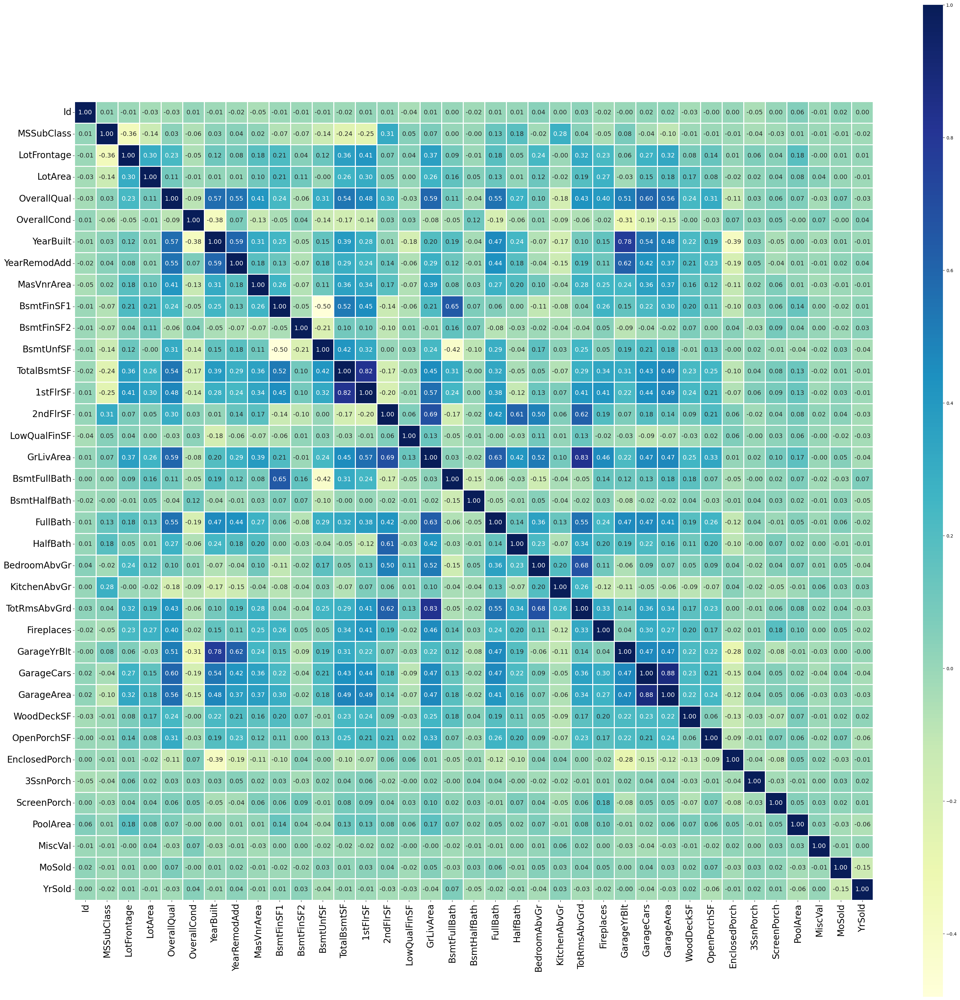

In [161]:
plt.figure(figsize=(40,40))
heatmap = sns.heatmap(tr_df.drop('SalePrice', axis=1).corr(), annot=True, annot_kws={"size": 14},
                      linewidths=1, linecolor='white', cmap='YlGnBu', square=True, fmt='.2f',cbar_kws={'aspect': 50}
                     ,xticklabels='auto', yticklabels='auto')

# Increase x-label font size
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=20)
# Increase y-label font size
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=20)
plt.show()

### Checking for correlation between input features and dependent feature

### Insights:
- If the correlation between independent and dependent feature is greater than 0.90 or below -0.90, then drop the independent feature. 
- Also if the correlation between independent and dependent feature isnear to 0, then drop the independent feature. 
- **So we are not dropping  any features based on their correlation value with target feature.**

C:\Users\om\AppData\Local\Temp\ipykernel_26804\2411385504.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  inp_corr_wi_tar = tr_df.corr().loc[:,'SalePrice'].drop('SalePrice').sort_values(ascending=False)


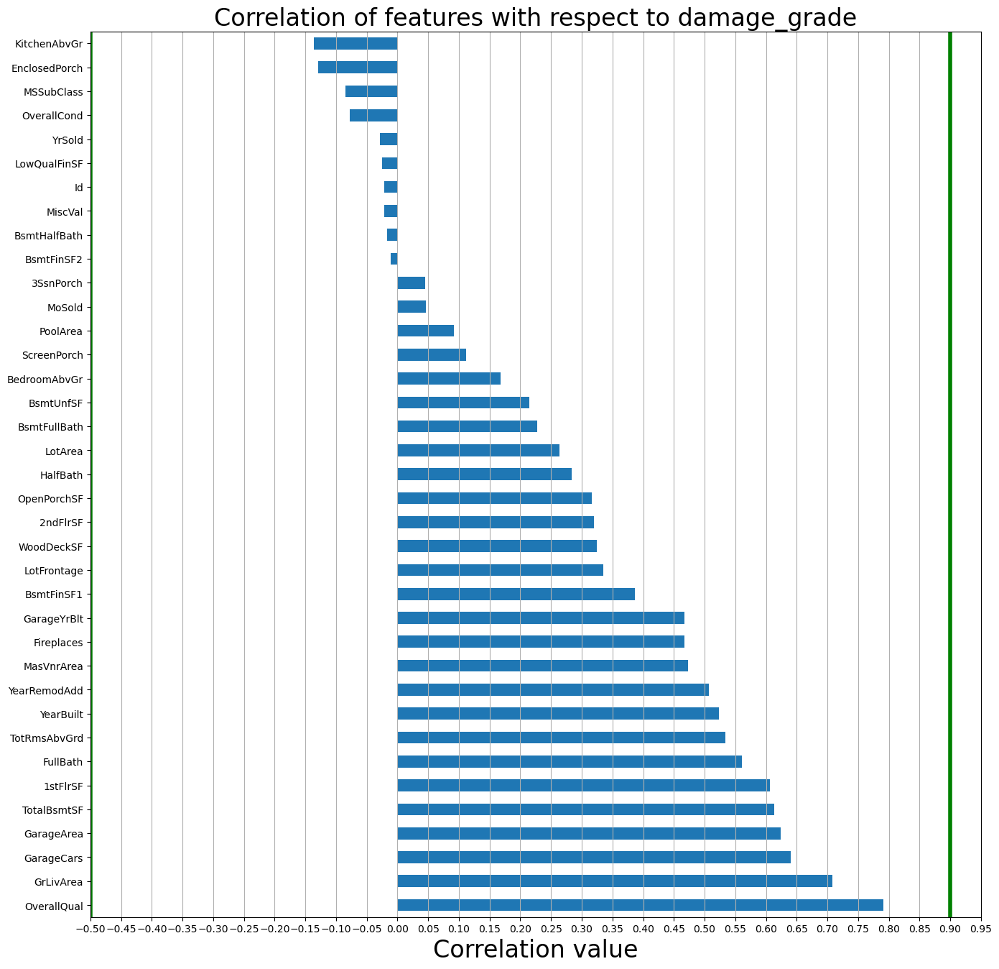

In [162]:
# Gets us the correlation value of each input features with target feature 

inp_corr_wi_tar = tr_df.corr().loc[:,'SalePrice'].drop('SalePrice').sort_values(ascending=False)

plt.figure(figsize=(16,16))

inp_corr_wi_tar.plot(kind='barh')

plt.title("Correlation of features with respect to damage_grade",fontdict={'fontsize':24})
plt.xlabel('Correlation value',fontdict={'fontsize':24})

plt.xticks(np.arange(-0.5,1,0.05),label=np.arange(-0.5,1,0.2)) # maximum correlation value doesn't cross 0.4

plt.axvline(-0.5,linewidth=4, color='green') # Draws a vertical line at x = -0.5
plt.axvline(0.9,linewidth=4, color='green') # Draws a vertical line at x = 0.9

plt.grid(axis='x')
plt.show()

C:\Users\om\AppData\Local\Temp\ipykernel_26804\1428113143.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(tr_df.corr(), annot=True, annot_kws={"size": 12},


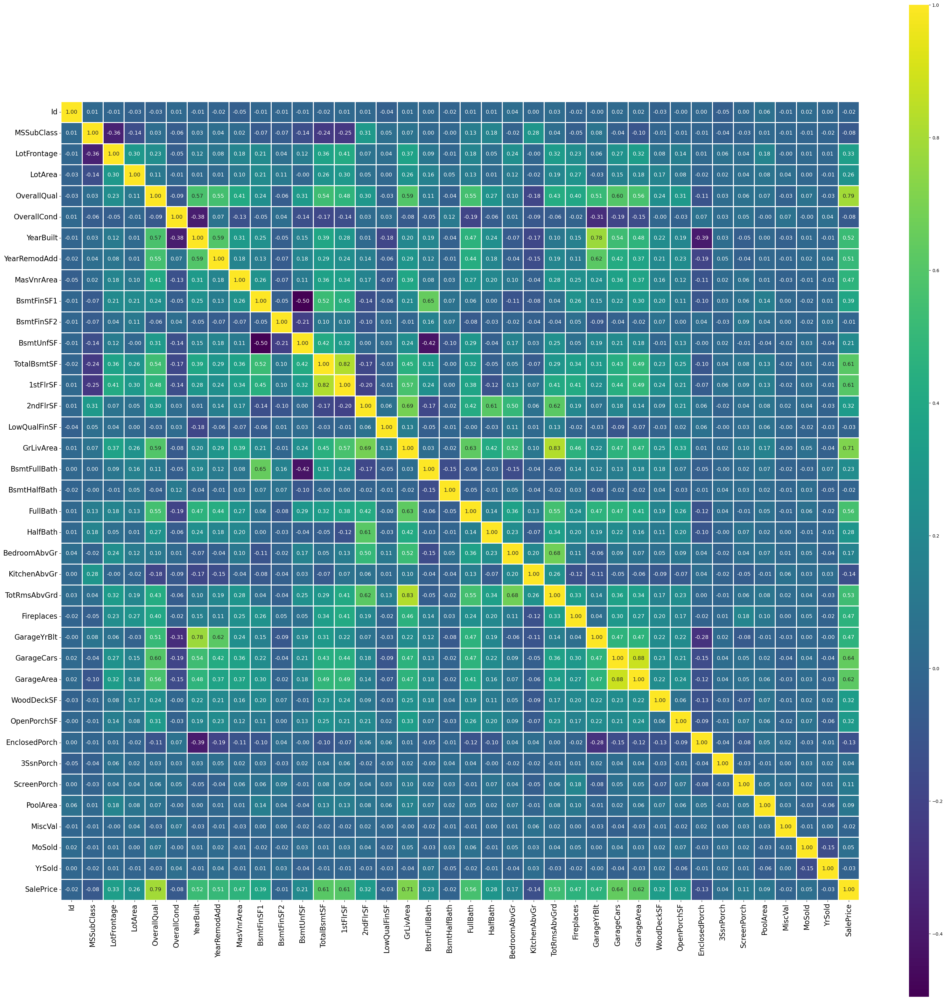

In [163]:
col = tr_df.columns # contains a list of all input features

plt.figure(figsize=(40, 40))
heatmap = sns.heatmap(tr_df.corr(), annot=True, annot_kws={"size": 12},
                      linewidths=1, linecolor='white', cmap='viridis', square=True, fmt='.2f',
                      xticklabels='auto', yticklabels='auto', cbar_kws={'aspect': 50})

# Increase x-label font size
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=16)
# Increase y-label font size
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=16)
plt.show()

# Data preprocessing

## Feature Transformations
- **Log Transform for Skewed Features**

### Independent features transfromation

#### NOTE:
- We are concatenating tr_df, and test_df data sets which have been altered from their original source (I've just filled NA values of those data, that's it)

In [164]:
df = pd.concat([tr_df,test_df],axis=0, ignore_index=True)
print(df.shape)
print("=================================================================================================================")
df.head()

(2919, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NO,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NF,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NP,NF,NO,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NO,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NP,NF,NO,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NO,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NP,NF,NO,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NO,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NP,NF,NO,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NO,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NP,NF,NO,0,12,2008,WD,Normal,250000.0


In [165]:
# Calculate skewness value for each Numerical feature
import scipy
skew_df = pd.DataFrame(df.loc[:,num_cols].drop('SalePrice',axis=1).columns, columns=['Feature'])
skew = []
for col in num_cols:
    if col != "SalePrice":
        skew.append(scipy.stats.skew(df[col]))

skew_df['Skew'] =  skew  
skew_df['Absolute Skew'] = skew_df['Skew'].apply(abs)
skew_df['Skewed'] = skew_df['Absolute Skew'] > 0.5
skew_df

,Feature,Skew,Absolute Skew,Skewed
0,Id,0.000000,0.000000,False
1,MSSubClass,1.375457,1.375457,True
2,LotFrontage,1.672470,1.672470,True
3,LotArea,12.822431,12.822431,True
4,OverallQual,0.197110,0.197110,False
5,OverallCond,0.570312,0.570312,True
6,YearBuilt,-0.599806,0.599806,True
7,YearRemodAdd,-0.451020,0.451020,False
8,MasVnrArea,2.613592,2.613592,True
9,BsmtFinSF1,1.425407,1.425407,True


#### Skewed columns info:

In [166]:
skewed_cols = skew_df[skew_df["Skewed"] == True]["Feature"].values

print(len(skewed_cols))
print("==========================================================================================================================")
print(skewed_cols)

27
['MSSubClass' 'LotFrontage' 'LotArea' 'OverallCond' 'YearBuilt'
 'MasVnrArea' 'BsmtFinSF1' 'BsmtFinSF2' 'BsmtUnfSF' 'TotalBsmtSF'
 '1stFlrSF' '2ndFlrSF' 'LowQualFinSF' 'GrLivArea' 'BsmtFullBath'
 'BsmtHalfBath' 'HalfBath' 'KitchenAbvGr' 'TotRmsAbvGrd' 'Fireplaces'
 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch' '3SsnPorch' 'ScreenPorch'
 'PoolArea' 'MiscVal']


In [167]:
# Apply Log transformation on Skewes features
# Log(0) is undefined that"s why choose log1p, which holds good even when log1p(0) for column in 

for column in skewed_cols:
    df[column] = np.log1p(df[column])

### Target feature transformation
- Here we can go for log(x)  beacuse SalePrice column doesn't seem to contains 0 value/s.

In [168]:
df['SalePrice'] =  np.log(df['SalePrice'])

## Encode Categoricals features
- Creating dummy columns for each categorical features

In [169]:
for column in cat_cols:
    dummy = pd.get_dummies(df[column],prefix=column,drop_first=True)
    df=pd.concat([df,dummy],axis=1).drop([column],axis=1)

In [170]:
df.head(10)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Fami

In [171]:
# Now we have total 261 columns and 2919 rows
print(df.shape)
print("==========================================================================================================================")
df.head()

(2919, 261)


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Fami

In [172]:
### Store the clean and processed data into an excel file

## Seperating input features and dependent feature

In [173]:
X_train = df.loc[:1167].drop(['Id','SalePrice'],axis=1)
y_train = df.loc[:1167,'SalePrice' ]

X_valid = df.loc[1168:1459].drop(['Id','SalePrice'],axis=1)
y_valid = df.loc[1168:1459,'SalePrice' ]

X_test = df.loc[1460:].drop(['Id','SalePrice'],axis=1)


# Print the shapes of the resulting datasets
print("Train data shape X_train:", X_train.shape)
print("Valid data shape X_valid:", X_valid.shape)
print("Test data shape X_valid:", X_test.shape)
print("Train labels shape y_train:", y_train.shape)
print("Valid labels shape y_valid:", y_valid.shape)

Train data shape X_train: (1168, 259)
Valid data shape X_valid: (292, 259)
Test data shape X_valid: (1459, 259)
Train labels shape y_train: (1168,)
Valid labels shape y_valid: (292,)


In [174]:
print(X_train.shape)
print("===================================================================================================================")
X_train.tail(3)

(1168, 259)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondit

In [175]:
print(X_valid.shape)
print("===================================================================================================================")
X_valid.head(3)

(292, 259)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondit

In [176]:
print(X_valid.shape)
print("===================================================================================================================")
X_valid.tail(3)

(292, 259)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondit

In [177]:
print(X_test.shape)
print("===================================================================================================================")
X_test.head(3)

(1459, 259)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NO,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NB,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NB,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NB,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NB,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NB,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NF,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NG,GarageFinish_NG,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_NG,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NG,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_NP,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NF,MiscFeature_NO,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondit

In [178]:
print(y_train.shape)
print("===================================================================================================================")
y_train.head(3)

(1168,)


0    12.247694
1    12.109011
2    12.317167
Name: SalePrice, dtype: float64

In [179]:
print(y_valid.shape)
print("===================================================================================================================")
y_valid.head(3)

(292,)


1168    12.367341
1169    13.345507
1170    12.049419
Name: SalePrice, dtype: float64

## Scaling

In [180]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Fit the scaler on X_train and transform X_train
X_train = scaler.fit_transform(X_train)

# Transform X_test using the fitted scaler
X_test = scaler.transform(X_test)

# Transform X_valid using the fitted scaler
X_valid = scaler.transform(X_valid)

In [181]:
X_train.shape,y_train.shape,X_valid.shape,y_valid.shape,X_test.shape

((1168, 259), (1168,), (292, 259), (292,), (1459, 259))

## Model selection

In [182]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree
from catboost import CatBoostRegressor
from sklearn.linear_model import BayesianRidge
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

## Linear Regression

In [215]:
lr_mod = LinearRegression()

lr_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= lr_mod.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")
print("===================================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= lr_mod.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.9497895218084312
MAE 0.06275446129131142
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.064765366018693
Validation data info:
R2 score -9.893437999868987e+20
MAE 1434758853.2203767


In [216]:
lin_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)

lin_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score = {"linear regression":[lin_reg_tr_sco,lin_reg_test_sco]}

## Ridge Regression

In [217]:
ridge_mod = Ridge(alpha=10)

ridge_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= ridge_mod.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= ridge_mod.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.948301643282546
MAE 0.06406930564286462
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0661662875409796
Validation data info:
R2 score 0.8420006971162357
MAE 0.08990374698308


### Ridge regression (Hyper parameter tuning)

In [218]:
# Define the parameter grid
param_grid = {'alpha': [0.1, 1.0, 10.0, 100.0, 500.0, 1000.0, 1500.0],  # Regularization strength
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}  # Solver options

# Create a Ridge regression model
ridge = Ridge(max_iter=5000)

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, scoring='neg_mean_squared_error')

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best parameter values
best_params = grid_search.best_params_
print("Best Parameters: ", best_params)
print("======================================================================================================================")

# Create model with best estimator (fitted Ridge model)
best_ridge = grid_search.best_estimator_

# predict for train data to see the accuracy
y_train_pred= best_ridge.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= best_ridge.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Best Parameters:  {'alpha': 100.0, 'solver': 'svd'}
Train data info:
R2 score 0.9419037414507708
MAE 0.0674987250517392
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0698288956205426
Validation data info:
R2 score 0.8487511704557287
MAE 0.0896704188340153


In [219]:
ridge_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
ridge_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["Ridge regression"] = [ridge_reg_tr_sco,ridge_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488]}

## Lasso Regression

In [220]:
lasso_mod = Lasso(alpha=0.001)

lasso_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= lasso_mod.predict(X_train)


print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("=====================================================================================================================")

# predict for valid data to see the accuracy
y_valid_pred= lasso_mod.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.944357875334324
MAE 0.06644383534391547
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0687009391688445
Validation data info:
R2 score 0.8533659627502487
MAE 0.08587138210411367


### Lasso regression (Hyper parameter tuning)

In [221]:
# Define the parameter grid
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0],  # L1 regularization parameter
    'tol': [10.0, 1.0, 0.1, 0.01, 0.001, 0.0001],  # Tolerance for optimization
    'max_iter': [100, 500, 1000, 2000, 3000, 4000, 5000]  # Maximum number of iterations
}

# Create a Lasso regression model
lasso = Lasso()

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='neg_mean_squared_error')

# Fit the model to the training data
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    grid_search.fit(X_train, y_train)
    

# Get the best parameter values
best_params = grid_search.best_params_
print("Best Parameters: ", best_params)
print("======================================================================================================================")

# Create model with best estimator (fitted Ridge model)
best_lasso = grid_search.best_estimator_

# predict for train data to see the accuracy
y_train_pred= best_lasso.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= best_lasso.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Best Parameters:  {'alpha': 0.001, 'max_iter': 500, 'tol': 0.0001}
Train data info:
R2 score 0.944357875334324
MAE 0.06644383534391547
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0687009391688445
Validation data info:
R2 score 0.8533659627502487
MAE 0.08587138210411367


In [225]:
lasso_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
lasso_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["lasso regression"] = [lasso_reg_tr_sco,lasso_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534]}

## Decision Tree

In [226]:
dt_mod = DecisionTreeRegressor(max_depth=8)

dt_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= dt_mod.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("==================================================================================================================")
print("Validation data info")
# predict for valid data to see the accuracy
y_valid_pred= dt_mod.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.9623053042240153
MAE 0.05655241663385868
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.058182079689199
Validation data info
R2 score 0.7594584213005993
MAE 0.13736347690138798


### Decision Tree (Hyper parameter tuning)

In [227]:
param_grid = {
    'max_depth': [1,2,3,4,5,6,7,8,9,10,11,None],
    'min_samples_split': [1,2,3,4,5,6,7,8,9,10,11],
    'min_samples_leaf': [1,2,3,4,5,6,7,8,9,10],
    'max_features': [1.0, 'sqrt', 'log2', None]
}

# Create the Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=42)


# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5)

# Fit the model to the training data, and get no warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    grid_search.fit(X_train, y_train)
    

# Get the best parameter values
best_params = grid_search.best_params_
print("Best Parameters: ", best_params)
print("======================================================================================================================")

# Create model with best estimator (fitted Ridge model)
best_tree = grid_search.best_estimator_

# predict for train data to see the accuracy
y_train_pred= best_tree.predict(X_train)

print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= best_tree.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Best Parameters:  {'max_depth': 11, 'max_features': 1.0, 'min_samples_leaf': 7, 'min_samples_split': 1}
R2 score 0.9203665088915225
MAE 0.07929128498562117
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0825195978560302
R2 score 0.7498800071044665
MAE 0.13716532711783605


In [228]:
decision_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
decision_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["decision regression"] = [decision_reg_tr_sco,decision_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499]}

## Random Forest

In [229]:
rf_mod = RandomForestRegressor(n_estimators=100,random_state=3,max_samples=0.5,max_features=0.75,max_depth=15)

rf_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= rf_mod.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("=======================================================================================================================")

# predict for valid data to see the accuracy
y_valid_pred= rf_mod.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.9521771231799049
MAE 0.058664582916233304
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0604194982667647
Validation data info:
R2 score 0.8515167450298946
MAE 0.09939973972269028


### Random forest (Hyper parameter tuning)

#### I have ran the following Random forest hyper parameter code on Google collaboratory, and it gave me following parameters as best parameters.
- I trained model on those prameters

- Best Parameters:  {'max_depth': None, 'max_features': 1.0, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}

In [230]:
RandomForest_params = {'max_depth': None, 'max_features': 1.0, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}

rf_mod = RandomForestRegressor(**RandomForest_params)

rf_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= rf_mod.predict(X_train)

print("Train data info:")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("=======================================================================================================================")

# predict for valid data to see the accuracy
y_valid_pred= rf_mod.predict(X_valid)

print("Validation data info:")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info:
R2 score 0.9741812844663906
MAE 0.0406203409999397
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0414566320941554
Validation data info:
R2 score 0.8487800820007421
MAE 0.10003161006349016


In [231]:
ran_forest_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
ran_forest_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["Random Forest regression"] = [ran_forest_reg_tr_sco,ran_forest_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499],
 'Random Forest regression': [0.9742, 0.8488]}

## Catboost

In [232]:
catboost_params = {
    'iterations': 8000,
    'learning_rate': 0.005,
    'depth': 2,
    'l2_leaf_reg': 1,
    'eval_metric':'RMSE',
    'early_stopping_rounds': 200,
    'random_seed': 42
}

cat_boost_mod = CatBoostRegressor(**catboost_params, verbose=0)

cat_boost_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= cat_boost_mod.predict(X_train)

print("Train data info")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= cat_boost_mod.predict(X_valid)

print("Validation data info")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info
R2 score 0.9560100018721845
MAE 0.06122430919186331
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0631373589253426
Validation data info
R2 score 0.8827336467665445
MAE 0.08745898408732851


### Catboost model (Hyper parameter tuning)

#### I have ran the following Catboost hyper parameter code on Google collaboratory, and it gave me following parameters as best parameters.
- I trained model on those prameters

- Best Parameters:  {'depth': 1, 'early_stopping_rounds': 200, 'eval_metric': 'RMSE', 'iterations': 6000, 'l2_leaf_reg': 2, 'learning_rate': 0.005, 'random_seed': 42}

In [233]:
catboost_params = {'depth': 1, 'early_stopping_rounds': 200, 
                   'eval_metric': 'RMSE', 'iterations': 6000, 
                   'l2_leaf_reg': 2, 'learning_rate': 0.005, 'random_seed': 42}

cat_boost_mod = CatBoostRegressor(**catboost_params, verbose=0)

cat_boost_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= cat_boost_mod.predict(X_train)

print("Train data info")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= cat_boost_mod.predict(X_valid)

print("Validation data info")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info
R2 score 0.918813063435903
MAE 0.08084099460170448
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0841984894476462
Validation data info
R2 score 0.8529627599968168
MAE 0.09951585748529597


In [234]:
catboost_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
catboost_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["catboost regression"] = [catboost_reg_tr_sco,catboost_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499],
 'Random Forest regression': [0.9742, 0.8488],
 'catboost regression': [0.9188, 0.853]}

## BayesianRidge

In [235]:
br_params = {
    'n_iter': 304,
    'tol': 0.16864712769300896,
    'alpha_1': 5.589616542154059e-07,
    'alpha_2': 9.799343618469923,
    'lambda_1': 1.7735725582463822,
    'lambda_2': 3.616928181181732e-06
}

# Ensure y_train and y_valid are 1D arrays
y_train1D= np.ravel(y_train)
y_valid1D = np.ravel(y_valid)

bayesian_mod = BayesianRidge(**br_params)

bayesian_mod.fit(X_train,y_train1D)

# predict for train data to see the accuracy
y_train_pred= bayesian_mod.predict(X_train)

print('R2 score',metrics.r2_score(y_train1D,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train1D,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")
print("=======================================================================================================================")
print("Validation data info")
# predict for valid data to see the accuracy
y_valid_pred= bayesian_mod.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid1D,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid1D,y_valid_pred))

R2 score 0.9365709396553069
MAE 0.07024563768643467
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0727716620416228
Validation data info
R2 score 0.8526993655938266
MAE 0.09047717206056334


### BayesianRidge (Hyper parameter tuning)

#### I have ran the following BayesianRidge hyper parameter code on Google collaboratory, and it gave me following parameters as best parameters.
- I trained model on those prameters

- Best Parameters:  {'alpha_1': 1e-06, 'alpha_2': 0.0001, 'lambda_1': 0.0001, 'lambda_2': 1e-06}

In [236]:
br_params = {'alpha_1': 1e-06, 'alpha_2': 0.0001, 'lambda_1': 0.0001, 'lambda_2': 1e-06}

bayesian_mod = BayesianRidge(**br_params)

bayesian_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= bayesian_mod.predict(X_train)

print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")
print("=======================================================================================================================")
print("Validation data info")
# predict for valid data to see the accuracy
y_valid_pred= bayesian_mod.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

R2 score 0.9438051072011778
MAE 0.06658049542157184
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0688469979021544
Validation data info
R2 score 0.8463530756687999
MAE 0.08964761777250853


In [237]:
bayesian_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
bayesian_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["Bayesian regression"] = [bayesian_reg_tr_sco,bayesian_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499],
 'Random Forest regression': [0.9742, 0.8488],
 'catboost regression': [0.9188, 0.853],
 'Bayesian regression': [0.9438, 0.8464]}

## LGBMRegressor

In [238]:
lightgbm_params = {
    'num_leaves': 39,
    'max_depth': 2,
    'learning_rate': 0.13705339989856127,
    'n_estimators': 273
}

LGBMRegressor_mod = LGBMRegressor(**lightgbm_params)

LGBMRegressor_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= LGBMRegressor_mod.predict(X_train)

print("Training data info")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")
print("=======================================================================================================================")
print("Validation data info")
# predict for valid data to see the accuracy
y_valid_pred= LGBMRegressor_mod.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Training data info
R2 score 0.9557262386088259
MAE 0.058048865565372344
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0597667805479238
Validation data info
R2 score 0.8837548757286455
MAE 0.08870192955068527


### LGBMRegressor (Hyper parameter tuning)

#### I have ran the following LGBMRegressor hyper parameter code on Google collaboratory, and it gave me following parameters as best parameters.
- I trained model on those prameters

- Best Parameters:  {'max_depth': 11, 'max_features': 1.0, 'min_samples_leaf': 4, 'min_samples_split': 11}

In [239]:
lightgbm_params ={'max_depth': 11, 'max_features': 1.0, 'min_samples_leaf': 4, 'min_samples_split': 11}

LGBMRegressor_mod = LGBMRegressor(**lightgbm_params)

LGBMRegressor_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= LGBMRegressor_mod.predict(X_train)

print("Training data info")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")
print("=======================================================================================================================")
print("Validation data info")
# predict for valid data to see the accuracy
y_valid_pred= LGBMRegressor_mod.predict(X_valid)

# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
Training data info
R2 score 0.9961323111738364
MAE 0.019045417974344253
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.019227938834573
Validation data info
R2 score 0.8798494684946331
MAE 0.09204795861648436


In [240]:
lightgbm_reg_tr_sco = np.round(metrics.r2_score(y_train,y_train_pred),4)
lightgbm_reg_test_sco = np.round(metrics.r2_score(y_valid,y_valid_pred),4)

models_score["LGBM regression"] = [lightgbm_reg_tr_sco,lightgbm_reg_test_sco]
models_score

{'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499],
 'Random Forest regression': [0.9742, 0.8488],
 'catboost regression': [0.9188, 0.853],
 'Bayesian regression': [0.9438, 0.8464],
 'LGBM regression': [0.9961, 0.8798]}

### Sepeating train and test data score from model_score dictionary

In [250]:
models_score ={'linear regression': [0.9498, -9.893437999868987e+20],
 'Ridge regression': [0.9419, 0.8488],
 'lasso regression': [0.9444, 0.8534],
 'decision regression': [0.9204, 0.7499],
 'Random Forest regression': [0.9742, 0.8488],
 'catboost regression': [0.9188, 0.853],
 'Bayesian regression': [0.9438, 0.8464],
 'LGBM regression': [0.9961, 0.8798]}


print(models_score)
print("======================")
    
# Delete key 'linear regression' from the dictionary
del models_score['linear regression']
    
    
name = list(models_score.keys())
score = list(models_score.values())
train_score = []
test_score = []

for i in range(len(score)):
    train_score.append(score[i][0]*100)
    test_score.append(score[i][1]*100)
    
print(name)
print("======================")
print(train_score)
print("======================")
print(test_score)

{'linear regression': [0.9498, -9.893437999868987e+20], 'Ridge regression': [0.9419, 0.8488], 'lasso regression': [0.9444, 0.8534], 'decision regression': [0.9204, 0.7499], 'Random Forest regression': [0.9742, 0.8488], 'catboost regression': [0.9188, 0.853], 'Bayesian regression': [0.9438, 0.8464], 'LGBM regression': [0.9961, 0.8798]}
['Ridge regression', 'lasso regression', 'decision regression', 'Random Forest regression', 'catboost regression', 'Bayesian regression', 'LGBM regression']
[94.19, 94.44, 92.04, 97.42, 91.88, 94.38, 99.61]
[84.88, 85.34, 74.99, 84.88, 85.3, 84.64, 87.98]


# Model comaprison report  and Challenges faced

#### Team ID: PTID-CDS-MAY-23-1515
#### Project ID: PRCP-1020 - Home price prediction

## Model comaprison report

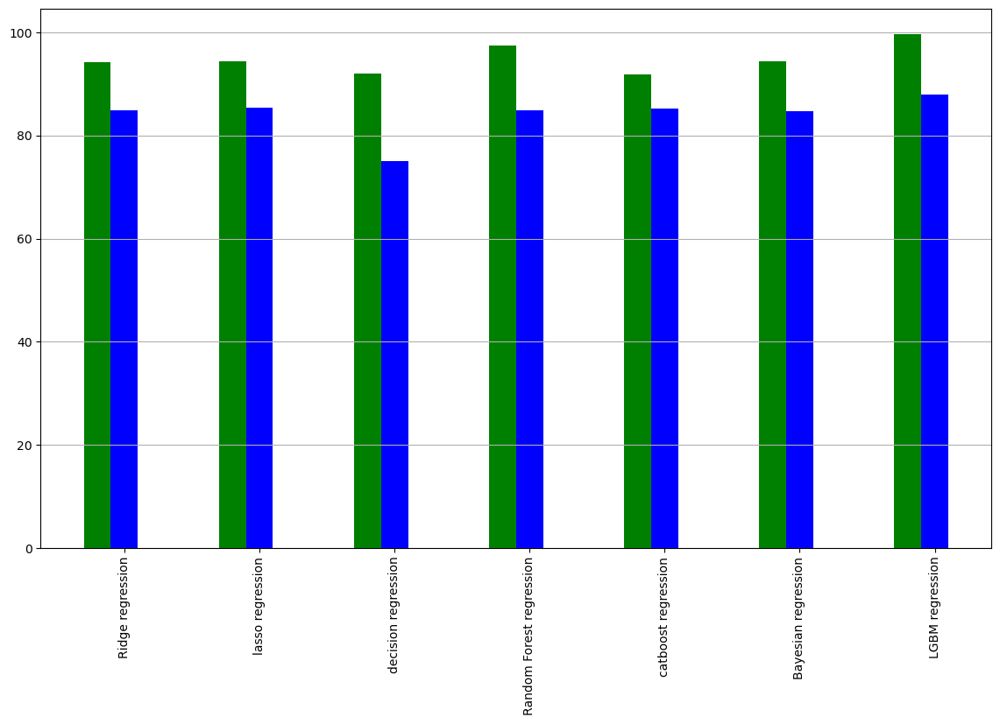

In [254]:
plt.figure(figsize=(14,8))
plt.bar(np.arange(len(train_score)) - 0.2,train_score,width=0.2,color='green')
plt.bar(np.arange(len(train_score)),test_score,width=0.2,color='blue')

plt.xticks(np.arange(len(train_score)), name)
plt.grid(axis='y')
plt.xticks(rotation='vertical')

plt.show()

In [258]:
models_score['catboost regression']

[0.9188, 0.853]

#### Model selection:
- From model performance on both train and valid data set we decided that Catboost model to be the best model out of all.
- Catboost model has least difference between train and test score, train score is 0.9188 and test score is 0.853.

#### Catboost model's prediction:

In [260]:
catboost_params = {'depth': 1, 'early_stopping_rounds': 200, 
                   'eval_metric': 'RMSE', 'iterations': 6000, 
                   'l2_leaf_reg': 2, 'learning_rate': 0.005, 'random_seed': 42}

cat_boost_mod = CatBoostRegressor(**catboost_params, verbose=0)

cat_boost_mod.fit(X_train,y_train)

# predict for train data to see the accuracy
y_train_pred= cat_boost_mod.predict(X_train)

print("Train data info")
print('R2 score',metrics.r2_score(y_train,y_train_pred))
print('MAE',metrics.mean_absolute_error(y_train,y_train_pred))
print("The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation")
real_mae = metrics.mean_absolute_error(y_train,y_train_pred)
print(f"Real MAE: {np.exp(real_mae)}")

print("======================================================================================================")
# predict for valid data to see the accuracy
y_valid_pred= cat_boost_mod.predict(X_valid)

print("Validation data info")
# Print R2 score and MAE for valid test data set
print('R2 score',metrics.r2_score(y_valid,y_valid_pred))
print('MAE',metrics.mean_absolute_error(y_valid,y_valid_pred))

Train data info
R2 score 0.918813063435903
MAE 0.08084099460170448
The MAE we got is in log transfrom form, inorder to get real MAE we need to do exponential transfromation
Real MAE: 1.0841984894476462
Validation data info
R2 score 0.8529627599968168
MAE 0.09951585748529597


In [263]:
# Prediction for test data set

y_test_pred= cat_boost_mod.predict(X_test)
y_test_pred = np.exp(y_test_pred)
y_test_pred

array([124154.52002733, 151809.30249398, 182096.25603916, ...,
       176121.51798987, 123748.59875618, 239557.50201481])

## Challenges faced:

1. We got 2 seperate data sets one for training and another for testing, train data set contains 80 independent features and 1 target feature. Test data set contains 80 independent features with no target feature
2. Both train and test data sets contains NaN value as category which are counted by Isnull() function as null values,So we need to find those columns and replace them with alternate meaningful values.
3. Both train and test data sets contains missing values which need to be replaced, we replaced them with either mean or mode depending upon type of the feature distribution
4. Removing duplicate values from both train and test data sets
5. Checking for correct and possible data entry for both train and test data sets
6. Combine both data sets as one data frame
7. Feature selection, there is no multi collinearity between independent features. We gonna tain models with all features
8. Finding skewed independent fetaures and applying log transfromaton, log transformation is also applied on target feature
9. Converting text data into numerical data by dummy variables method
10. Seperate data into train, test and valid data sets
11. Apply scaling on X_train, X_test and X_valid data sets
12. We weren't able to do Hyper parameter tuning of models on laptop with low configuraion, that's why we did in Google Collaboratory. Once we got the best prameters from model's hyper parameter tuning we traine dour models on those best parameters.